# CryoSENSE-HK: Lead-Time Snow-State Forecasting from ERA5-Land, Bounded by Station and Physical References

## CryoSENSE-HK reproduction notebook | ERA5-Land (1950-2025), two GHCN-Daily stations, and a ten-member CMIP6 ensemble (2015-2099)

**Purpose.** This notebook rebuilds the analysis as an applied, named, lightweight and explainable framework, and then bounds what it produces:

`climate diagnostics -> leakage-safe lead-time targets -> feature groups -> training-only feature selection -> tree decision layer -> ablation -> temporal and spatial validation -> conformal intervals -> SHAP explanation -> station comparison -> warming response against two physical references`

**Claim boundary.** `CryoSENSE-HK` forecasts ERA5-Land snow cover, snow water equivalent and snowmelt at 1-, 7-, 15- and 30-day lead times using only issue-date and lagged information. The field distributed as `sd` is snow depth expressed as water equivalent and is called snow water equivalent throughout; `sde` is the geometric depth and is called snow depth. Skill measured here is agreement with the reanalysis, which the station comparison shows is not the same as agreement with the snowpack. It links out-of-year forecast snowmelt indicators to the executed Landsat/GEE area series. It is not a glacier mass-balance model, not a direct ice-melt forecast, and not a basis for climate projection.


In [1]:
# 0. Configuration and imports
%matplotlib inline
from pathlib import Path
import json, os, time, warnings
warnings.filterwarnings("ignore")

# Resolve the repository root so the notebook runs whether the working
# directory is the repo root or the notebooks/ subdirectory.
def _find_repo_root(start: Path) -> Path:
    marker = Path("data") / "hakkari_gunluk_tum_degiskenler.csv"
    for candidate in (start, *start.parents):
        if (candidate / marker).exists():
            return candidate
        # tolerate the pre-flattening layout, where the code lived in code_repo/
        if (candidate / "code_repo" / marker).exists():
            return candidate / "code_repo"
    return start

ROOT = _find_repo_root(Path.cwd())
OUT_DIR = ROOT / "outputs"
os.environ.setdefault("MPLCONFIGDIR", str(OUT_DIR / ".matplotlib_cache"))
(OUT_DIR / ".matplotlib_cache").mkdir(parents=True, exist_ok=True)

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import rasterio
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle, ConnectionPatch
from scipy import stats
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit, LeaveOneOut, cross_val_predict
from xgboost import XGBRegressor
import shap
import xarray as xr
from IPython.display import display, Markdown

SEED = 42
np.random.seed(SEED)
DATA_DIR = ROOT / "data"
NC_DIR = DATA_DIR / "nc_cilo_sat"
SSP_DIR = NC_DIR / "SSP"
TABLE_DIR = OUT_DIR / "tables"
FIG_DIR = ROOT / "figures" / "raw"
SUBMIT_DIR = ROOT / "figures" / "submission"
MODEL_DIR = OUT_DIR / "models"
for d in [TABLE_DIR, FIG_DIR, SUBMIT_DIR, MODEL_DIR]:
    d.mkdir(parents=True, exist_ok=True)

sns.set_theme(style="whitegrid", context="talk")
plt.rcParams.update({
    "figure.dpi": 150,
    "savefig.dpi": 300,
    "font.family": "DejaVu Sans",
    "font.size": 18,
    "axes.labelsize": 20,
    "axes.titlesize": 1,
    "xtick.labelsize": 17,
    "ytick.labelsize": 17,
    "legend.fontsize": 16,
})
print(f"Workspace: {ROOT.name}")
print(f"Outputs:   {OUT_DIR.relative_to(ROOT)}")

def polish_manuscript_figure(fig):
    # Remove in-image panel titles and enlarge text for manuscript readability.
    if getattr(fig, "_suptitle", None) is not None:
        fig._suptitle.set_visible(False)
    for ax in fig.axes:
        ax.set_title("")
        ax.title.set_visible(False)
        ax.tick_params(axis="both", labelsize=17)
        ax.xaxis.label.set_fontsize(20)
        ax.yaxis.label.set_fontsize(20)
        legend = ax.get_legend()
        if legend is not None:
            for text in legend.get_texts():
                text.set_fontsize(16)
            if legend.get_title() is not None:
                legend.get_title().set_fontsize(16)
    return fig


def add_panel_letters(axes, letters=None, x=-0.01, y=1.03, fontsize=17):
    # Panel identity is a letter at the top-left corner of the panel, placed just
    # outside the frame so it can never cover a data point. The descriptive name
    # belongs to the caption and the body text, never on top of the image.
    flat = list(np.asarray(axes, dtype=object).ravel())
    if letters is None:
        letters = [f"({chr(97 + k)})" for k in range(len(flat))]
    for ax, letter in zip(flat, letters):
        ax.text(x, y, letter, transform=ax.transAxes, ha="left", va="bottom",
                fontsize=fontsize, fontweight="bold", color="#222222")
    return axes


Workspace: .
Outputs:   outputs


## 1. Data provenance and quality control

This section makes provenance visible before analysis. The processed daily table is used as the reproducible input for the modelling pipeline; raw ERA5-Land NetCDF files are inventoried. The area target is transcribed from the successfully executed GEE notebook output so that year, image count and NDSI threshold remain explicit.


In [2]:
# 1.1 Source inventory and daily data validation
daily_path = DATA_DIR / "hakkari_gunluk_tum_degiskenler.csv"
glacier_path = DATA_DIR / "hakkari_glacier_area_2000_2024_gee_executed.csv"
raw_nc = sorted([p.name for p in NC_DIR.glob("*.nc")])
ssp_nc = sorted([p.name for p in SSP_DIR.glob("*EC-Earth3-CC*.nc")])

# A glob over a missing directory returns an empty list rather than raising, so a
# mistyped or moved path would be recorded as "available, 0 files" and every
# downstream count would be silently wrong. The expected inventory sizes are
# therefore asserted here, before anything is written.
EXPECTED_RAW_NC, EXPECTED_SSP_NC = 23, 8
if len(raw_nc) < EXPECTED_RAW_NC or len(ssp_nc) < EXPECTED_SSP_NC:
    raise FileNotFoundError(
        f"NetCDF inventory incomplete under {NC_DIR}: "
        f"{len(raw_nc)}/{EXPECTED_RAW_NC} raw and {len(ssp_nc)}/{EXPECTED_SSP_NC} SSP files"
    )

daily = pd.read_csv(daily_path, sep=";", parse_dates=["time"]).sort_values("time")
daily = daily.set_index("time")
expected = pd.date_range(daily.index.min(), daily.index.max(), freq="D")

# Radiation and turbulent-flux correction. ERA5-Land accumulates these quantities in
# J m-2 over the day, so a daily-mean flux in W m-2 is the accumulation divided by 86400
# s. The stored columns divide by 3600 s instead and are therefore 24 times too large:
# they reach 8929 for downward shortwave, above the solar constant and impossible as a
# daily mean. The factor is constant, so it shifts split thresholds without changing any
# tree prediction, but the column unit is wrong and the values are published, so the
# scaling is corrected here and the corrected series are checked for admissibility.
FLUX_COLUMNS = ["ssr_W", "ssrd_W", "str_W", "strd_W", "slhf_W", "sshf_W"]
SECONDS_PER_DAY, SECONDS_STORED = 86400.0, 3600.0
daily[FLUX_COLUMNS] = daily[FLUX_COLUMNS] * (SECONDS_STORED / SECONDS_PER_DAY)
SOLAR_CONSTANT_W = 1361.0
assert daily["ssrd_W"].max() < SOLAR_CONSTANT_W, "downward shortwave exceeds the solar constant"
assert daily["ssrd_W"].min() >= 0.0, "downward shortwave is negative"
print(f"Flux columns rescaled to daily means: ssrd {daily['ssrd_W'].mean():.1f} W m-2 "
      f"(max {daily['ssrd_W'].max():.1f}), sshf {daily['sshf_W'].mean():.1f} W m-2.")

manifest = pd.DataFrame([
    {"Source": "ERA5-Land processed daily", "Path": str(daily_path.relative_to(ROOT)),
     "Status": "available", "Coverage": f"{daily.index.min().date()} to {daily.index.max().date()}",
     "Notes": f"{len(daily):,} days; missing rows={len(expected.difference(daily.index))}; NA={daily.isna().sum().sum()}"},
    {"Source": "ERA5-Land raw NetCDF inventory", "Path": "data/nc_cilo_sat/*.nc",
     "Status": "available", "Coverage": "historical forcing variables", "Notes": f"{len(raw_nc)} files"},
    {"Source": "EC-Earth3-CC CMIP6 SSP", "Path": "data/nc_cilo_sat/SSP/*EC-Earth3-CC*.nc",
     "Status": "available", "Coverage": "2015-2099", "Notes": f"{len(ssp_nc)} direct CMIP6 files"},
    {"Source": "Study-area boundaries", "Path": "data/spatial/natural_earth_turkey*.geojson",
     "Status": "available", "Coverage": "Turkey and Hakkari", "Notes": "Natural Earth 1:10m administrative boundaries"},
    {"Source": "GLIMS glacier polygons", "Path": "data/spatial/hakkari_glaciers_glims.gpkg",
     "Status": "available", "Coverage": "Cilo-Sat; 2000 and 2009", "Notes": "ROI polygons used in GEE area workflow"},
    {"Source": "Landsat/GEE glacier area", "Path": str(glacier_path.relative_to(ROOT)),
     "Status": "executed series", "Coverage": "2000-2024 excluding 2012",
     "Notes": "NDSI threshold=0.20; values captured from executed GEE notebook output; n=24"},
])
display(manifest)
manifest.to_csv(TABLE_DIR / "table_01_source_manifest.csv", index=False)

assert daily.index.is_monotonic_increasing
assert len(expected.difference(daily.index)) == 0
assert daily.isna().sum().sum() == 0
print("Daily ERA5-Land table passed continuity and completeness checks.")


Flux columns rescaled to daily means: ssrd 221.4 W m-2 (max 372.0), sshf -34.1 W m-2.


,Source,Path,Status,Coverage,Notes
0,ERA5-Land processed daily,data/hakkari_gunluk_tum_degiskenler.csv,available,1950-01-01 to 2025-12-31,"27,759 days; missing rows=0; NA=0"
1,ERA5-Land raw NetCDF inventory,data/nc_cilo_sat/*.nc,available,historical forcing variables,23 files
2,EC-Earth3-CC CMIP6 SSP,data/nc_cilo_sat/SSP/*EC-Earth3-CC*.nc,available,2015-2099,8 direct CMIP6 files
3,Study-area boundaries,data/spatial/natural_earth_turkey*.geojson,available,Turkey and Hakkari,Natural Earth 1:10m administrative boundaries
4,GLIMS glacier polygons,data/spatial/hakkari_glaciers_glims.gpkg,available,Cilo-Sat; 2000 and 2009,ROI polygons used in GEE area workflow
5,Landsat/GEE glacier area,data/hakkari_glacier_area_2000_2024_gee_execut...,executed series,2000-2024 excluding 2012,NDSI threshold=0.20; values captured from exec...


Daily ERA5-Land table passed continuity and completeness checks.


In [3]:
# 1.2 Compact descriptive table
# ERA5-Land naming, applied exactly as documented by ECMWF:
#   sd  = "Snow depth water equivalent" (paramId 141, m of water equivalent)
#   sde = "Snow depth"                  (paramId 3066, m of snow thickness)
# The abbreviation "sde" reads like "snow depth equivalent" but is the physical
# thickness; sd is the water-equivalent quantity. The two are related through the
# snow density rsn as  sde = sd * rho_water / rho_snow, verified below.
core = ["t2m_C", "tp_mm", "sf_mm", "snowc", "sd", "smlt_mm", "sde_mm"]
VARIABLE_LABELS = {
    "t2m_C": "2 m air temperature (deg C)",
    "tp_mm": "Total precipitation (mm)",
    "sf_mm": "Snowfall (mm w.e.)",
    "snowc": "Snow cover (%)",
    "sd": "Snow water equivalent (m w.e.)",
    "smlt_mm": "Snowmelt (mm w.e./day)",
    "sde_mm": "Snow depth (mm)",
}
descriptive = daily[core].agg(["mean", "std", "min", "max"]).T.round(3)
descriptive.index = descriptive.index.map(VARIABLE_LABELS)
descriptive.index.name = "Variable"
descriptive.to_csv(TABLE_DIR / "table_02_descriptive_statistics.csv")
display(descriptive)

# Identity check: on snow-covered days the two ERA5-Land snow variables must satisfy
# sde [mm] = sd [m w.e.] * 1e6 / rsn [kg m-3]. Agreement confirms which column is the
# water equivalent and which is the physical depth, independently of the CDS naming.
_snow = daily.loc[daily["sd"] > 1e-3]
_implied = _snow["sd"] * 1e6 / _snow["rsn"]
_rel = ((_implied - _snow["sde_mm"]).abs() / _snow["sde_mm"].clip(lower=1e-6))
_ratio = _snow["sd"] * 1000 / _snow["sde_mm"] * 1000  # implied bulk snow density
print(f"Snow-covered days: {len(_snow):,}")
print(f"  sde = sd*1e6/rsn holds within 1% on {(_rel <= 0.01).mean():.1%} of them")
print(f"  implied bulk density from sd/sde: mean {_ratio.mean():.0f} kg m-3 "
      f"(rsn mean {_snow['rsn'].mean():.0f} kg m-3)")
print("  -> 'sd' is the water equivalent; 'sde' is the physical snow depth.")


,mean,std,min,max
Variable,,,,
2 m air temperature (deg C),4.019,9.837,-20.237,23.381
Total precipitation (mm),2.676,6.694,0.000,83.121
Snowfall (mm w.e.),1.778,5.786,0.000,79.254
Snow cover (%),49.441,49.016,0.000,100.000
Snow water equivalent (m w.e.),0.164,0.230,-0.000,1.066
Snowmelt (mm w.e./day),1.920,5.421,0.000,31.887
Snow depth (mm),583.469,753.715,-0.000,3233.236


Snow-covered days: 14,606
  sde = sd*1e6/rsn holds within 1% on 92.1% of them
  implied bulk density from sd/sde: mean 269 kg m-3 (rsn mean 269 kg m-3)
  -> 'sd' is the water equivalent; 'sde' is the physical snow depth.


## 2. Study area and spatial data footprint

The study area is located in Hakkari Province, in the Cilo-Sat mountain glacier cluster. The map first locates the highlighted province within Turkey on a physical basemap, then enlarges the glacier ROI on satellite imagery within the same figure. It combines the province boundary, GLIMS-derived glacier polygons used in the GEE workflow, and the ERA5-Land extraction point (`44.000 E, 37.500 N`).


Saved: outputs/figures/figure_01_study_area_map.png


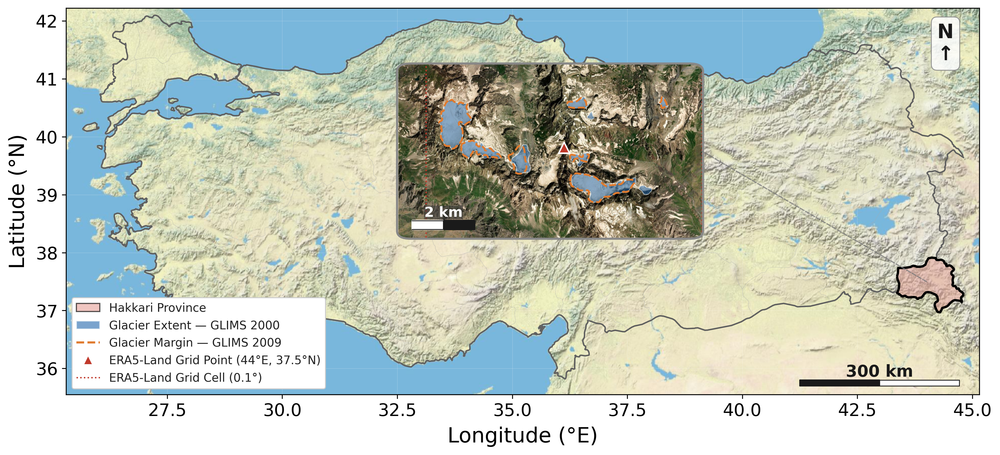

In [4]:
"""Generate Figure 1 (study-area map) in the user-approved clean layout.

Stable requirements:
- no figure name/title above the image, no footnote (caption lives in the manuscript)
- no ERA5 marker on the main Turkey map
- Hakkari pale red (#e8a8a0, 55% alpha) with a black boundary
- Cilo-Sat satellite inset at upper left, grey dashed connector
- legend at lower left, inside the map, does not overlap the map content
"""

from pathlib import Path

%matplotlib inline
import matplotlib as mpl
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from matplotlib.lines import Line2D
from matplotlib.patches import ConnectionPatch, FancyBboxPatch, Rectangle


ROOT = _find_repo_root(Path.cwd())
DATA_DIR = ROOT / "data"
FIG_DIR = ROOT / "figures" / "raw"
FIG_DIR.mkdir(parents=True, exist_ok=True)


def read_rgb(path: Path):
    with rasterio.open(path) as source:
        image = np.moveaxis(source.read([1, 2, 3]), 0, 2)
        return image, source.bounds


def main() -> Path:
    mpl.rcdefaults()
    plt.rcParams.update(
        {
            "figure.dpi": 150,
            "savefig.dpi": 300,
            "font.family": "DejaVu Sans",
            "axes.grid": False,
            "axes.facecolor": "white",
            "figure.facecolor": "white",
            "axes.labelsize": 18,
            "axes.titlesize": 1,
            "xtick.labelsize": 15,
            "ytick.labelsize": 15,
            "legend.fontsize": 15,
        }
    )

    spatial_dir = DATA_DIR / "spatial"

    c_hak_fill = "#e8a8a0"
    c_hak_alpha = 0.55
    c_hak_bound = "#000000"
    c_tr_bound = "#555555"
    c_prov = "#aaaaaa"
    c_gl2000 = "#2166ac"
    c_gl2009 = "#e07b2f"
    c_era5 = "#c0392b"
    c_conn = "#777777"
    c_inset_bdr = "#888888"
    c_scalebar = "#1a1a1a"
    c_leg_ec = "#cccccc"

    provinces = gpd.read_file(spatial_dir / "natural_earth_turkey_provinces.geojson")
    turkey = gpd.read_file(spatial_dir / "natural_earth_turkey.geojson")
    hakkari = provinces.loc[provinces["name"] == "Hakkari"].copy()
    glims = gpd.read_file(spatial_dir / "hakkari_glaciers_glims.gpkg")
    glims["src_year"] = pd.to_datetime(glims["src_date"]).dt.year
    glims_2000 = glims.loc[glims["src_year"] == 2000]
    glims_2009 = glims.loc[glims["src_year"] == 2009]
    era_lon, era_lat = 44.000, 37.500

    country_img, cb = read_rgb(spatial_dir / "turkey_esri_world_physical_wgs84.tif")
    detail_img, db = read_rgb(spatial_dir / "cilo_sat_esri_world_imagery_wgs84.tif")

    fig = plt.figure(figsize=(13, 9))
    fig.patch.set_facecolor("white")
    ax = fig.add_axes([0.08, 0.10, 0.84, 0.82])
    ax.imshow(country_img, extent=[cb.left, cb.right, cb.bottom, cb.top], origin="upper")
    ax.set_xlim(25.3, 45.15)
    ax.set_ylim(35.55, 42.22)

    turkey.boundary.plot(ax=ax, color=c_tr_bound, lw=1.2, zorder=3)
    provinces.boundary.plot(ax=ax, color=c_prov, lw=0.4, alpha=0.6, linestyle=":", zorder=3)
    hakkari.plot(ax=ax, color=c_hak_fill, alpha=c_hak_alpha, zorder=4)
    hakkari.boundary.plot(ax=ax, color=c_hak_bound, lw=2.0, zorder=5)

    ax.set_xlabel("Longitude (°E)", labelpad=6)
    ax.set_ylabel("Latitude (°N)", labelpad=6)
    ax.grid(True, color="white", lw=0.25, alpha=0.30)

    ax.text(
        0.963, 0.962, "N\n↑", transform=ax.transAxes, ha="center", va="top",
        fontsize=17, weight="bold", color="#1a1a1a",
        bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.85, ec=c_inset_bdr, lw=0.8),
    )

    scale_300 = 300.0 / (111.32 * np.cos(np.deg2rad(39.0)))
    x0 = 41.25
    ax.fill_between([x0, x0 + scale_300 / 2], 35.70, 35.80, color=c_scalebar, zorder=8)
    ax.fill_between(
        [x0 + scale_300 / 2, x0 + scale_300], 35.70, 35.80,
        color="white", edgecolor=c_scalebar, lw=0.7, zorder=8,
    )
    ax.plot([x0, x0 + scale_300], [35.70, 35.70], color=c_scalebar, lw=0.7, zorder=9)
    ax.plot([x0, x0 + scale_300], [35.80, 35.80], color=c_scalebar, lw=0.7, zorder=9)
    ax.text(x0 + scale_300 / 2, 35.86, "300 km", color=c_scalebar, fontsize=14,
            ha="center", weight="bold")

    inset = ax.inset_axes([0.33, 0.405, 0.40, 0.45])
    detail_artist = inset.imshow(detail_img, extent=[db.left, db.right, db.bottom, db.top], origin="upper")
    inset.set_xlim(43.940, 44.050)
    inset.set_ylim(37.474, 37.524)

    glims_2000.plot(ax=inset, color=c_gl2000, edgecolor="white", alpha=0.52, lw=0.7)
    glims_2009.boundary.plot(ax=inset, color=c_gl2009, lw=1.6, ls="--")
    inset.scatter(era_lon, era_lat, marker="^", s=90, color=c_era5,
                  edgecolor="white", lw=1.2, zorder=8)
    inset.add_patch(
        Rectangle((43.95, 37.45), 0.1, 0.1, lw=1.2, edgecolor=c_era5,
                  facecolor="none", ls=":", zorder=7)
    )

    inset.set_xticks([])
    inset.set_yticks([])
    inset.patch.set_visible(False)
    for spine in inset.spines.values():
        spine.set_visible(False)

    scale_2 = 2.0 / 88.0
    ix = 43.945
    inset.fill_between([ix, ix + scale_2 / 2], 37.4765, 37.479, color="white", zorder=20)
    inset.fill_between([ix + scale_2 / 2, ix + scale_2], 37.4765, 37.479, color=c_scalebar, zorder=20)
    inset.plot([ix, ix + scale_2], [37.4765, 37.4765], color=c_scalebar, lw=0.7, zorder=21)
    inset.plot([ix, ix + scale_2], [37.479, 37.479], color=c_scalebar, lw=0.7, zorder=21)
    inset.text(ix + scale_2 / 2, 37.4802, "2 km", color="white", fontsize=12, weight="bold",
               ha="center", zorder=22,
               bbox=dict(fc="#333333", alpha=0.55, ec="none", pad=0.15))

    rounded_inset = FancyBboxPatch(
        (0, 0), 1, 1,
        boxstyle="round,pad=0.004,rounding_size=0.045",
        transform=inset.transAxes,
        facecolor="none",
        edgecolor=c_inset_bdr,
        linewidth=1.8,
        zorder=40,
        clip_on=False,
    )
    for artist in list(inset.images) + list(inset.collections) + list(inset.lines) + list(inset.patches) + list(inset.texts):
        artist.set_clip_path(rounded_inset)
    inset.add_patch(rounded_inset)

    fig.add_artist(
        ConnectionPatch(
            xyA=(era_lon, era_lat), coordsA=ax.transData,
            xyB=(1.0, 0.5), coordsB=inset.transAxes,
            axesA=ax, axesB=inset,
            color=c_conn, lw=1.0, ls="--", alpha=0.75, zorder=10,
        )
    )

    legend_handles = [
        mpatches.Patch(fc=c_hak_fill, ec=c_hak_bound, alpha=0.65, label="Hakkari Province"),
        mpatches.Patch(fc=c_gl2000, ec="white", alpha=0.60, label="Glacier Extent — GLIMS 2000"),
        Line2D([0], [0], color=c_gl2009, lw=1.8, ls="--", label="Glacier Margin — GLIMS 2009"),
        Line2D([0], [0], marker="^", color="none", mfc=c_era5, mec="white", ms=8,
               label="ERA5-Land Grid Point (44°E, 37.5°N)"),
        Line2D([0], [0], color=c_era5, lw=1.2, ls=":", label="ERA5-Land Grid Cell (0.1°)"),
    ]
    legend = ax.legend(handles=legend_handles, loc="lower left", fontsize=10, framealpha=1.0,
                       facecolor="white", edgecolor=c_leg_ec, labelcolor="#222222")
    legend.get_frame().set_linewidth(0.8)

    out = FIG_DIR / "figure_01_study_area_map.png"
    fig.savefig(out, bbox_inches="tight", facecolor="white")
    plt.close(fig)
    print(f"Saved: {out.relative_to(ROOT)}")
    return out


from IPython.display import Image, display

_figure_01_path = main()
display(Image(filename=str(_figure_01_path)))


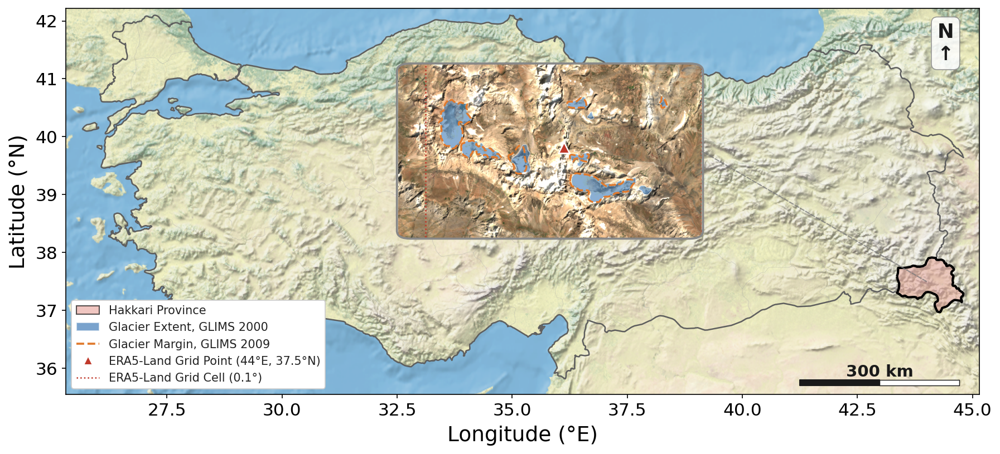

Figure 1 (CC BY basemaps): outputs/figures/fig1_manuscript/Fig1.tiff


In [5]:
# 2.1b Figure 1, copyright-clean basemaps
#
# The variant above renders the country map from Esri World Physical and the
# inset from Esri World Imagery. Both are proprietary, so they cannot be
# redistributed under the CC BY 4.0 licence a fully open-access journal
# applies to its figures. This cell rebuilds the same layout from sources that
# can: Natural Earth shaded relief (public domain) for the country map and
# Sentinel-2 true colour (Copernicus, CC BY compatible) for the inset.
# Boundaries (Natural Earth) and glacier outlines (GLIMS) are identical.
#
# It writes a 600 dpi TIFF for submission and a PNG for inspection. This is the
# version that goes to the journal.

SPATIAL_DIR = DATA_DIR / "spatial"
RELIEF_TIF = SPATIAL_DIR / "natural_earth_shaded_relief_wgs84.tif"
SENTINEL_TIF = SPATIAL_DIR / "cilo_sat_sentinel2_wgs84.tif"
CCBY_DIR = FIG_DIR / "fig1_manuscript"
CCBY_DIR.mkdir(parents=True, exist_ok=True)


def build_figure_01_ccby() -> Path:
    """Draw Figure 1 from redistributable basemaps and save it at 600 dpi."""
    mpl.rcdefaults()
    plt.rcParams.update({
        "figure.dpi": 150, "savefig.dpi": 600, "font.family": "DejaVu Sans",
        "axes.grid": False, "axes.facecolor": "white", "figure.facecolor": "white",
        "axes.labelsize": 18, "xtick.labelsize": 15, "ytick.labelsize": 15,
        "legend.fontsize": 15,
    })

    c_hak_fill, c_hak_alpha, c_hak_bound = "#e8a8a0", 0.55, "#000000"
    c_tr_bound, c_prov = "#555555", "#aaaaaa"
    c_gl2000, c_gl2009, c_era5 = "#2166ac", "#e07b2f", "#c0392b"
    c_conn, c_inset_bdr, c_scalebar, c_leg_ec = "#777777", "#888888", "#1a1a1a", "#cccccc"

    provinces = gpd.read_file(SPATIAL_DIR / "natural_earth_turkey_provinces.geojson")
    turkey = gpd.read_file(SPATIAL_DIR / "natural_earth_turkey.geojson")
    hakkari = provinces.loc[provinces["name"] == "Hakkari"].copy()
    glims = gpd.read_file(SPATIAL_DIR / "hakkari_glaciers_glims.gpkg")
    glims["src_year"] = pd.to_datetime(glims["src_date"]).dt.year
    glims_2000 = glims.loc[glims["src_year"] == 2000]
    glims_2009 = glims.loc[glims["src_year"] == 2009]
    era_lon, era_lat = 44.000, 37.500

    country_img, cb = read_rgb(RELIEF_TIF)
    detail_img, db = read_rgb(SENTINEL_TIF)

    fig = plt.figure(figsize=(13, 9))
    ax = fig.add_axes([0.08, 0.10, 0.84, 0.82])
    ax.imshow(country_img, extent=[cb.left, cb.right, cb.bottom, cb.top], origin="upper")
    ax.set_xlim(25.3, 45.15)
    ax.set_ylim(35.55, 42.22)

    turkey.boundary.plot(ax=ax, color=c_tr_bound, lw=1.2, zorder=3)
    provinces.boundary.plot(ax=ax, color=c_prov, lw=0.4, alpha=0.6, linestyle=":", zorder=3)
    hakkari.plot(ax=ax, color=c_hak_fill, alpha=c_hak_alpha, zorder=4)
    hakkari.boundary.plot(ax=ax, color=c_hak_bound, lw=2.0, zorder=5)
    ax.set_xlabel("Longitude (°E)", labelpad=6)
    ax.set_ylabel("Latitude (°N)", labelpad=6)

    ax.text(0.963, 0.962, "N\n↑", transform=ax.transAxes, ha="center", va="top",
            fontsize=17, weight="bold", color="#1a1a1a",
            bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.85, ec=c_inset_bdr, lw=0.8))

    scale_300 = 300.0 / (111.32 * np.cos(np.deg2rad(39.0)))
    x0 = 41.25
    ax.fill_between([x0, x0 + scale_300 / 2], 35.70, 35.80, color=c_scalebar, zorder=8)
    ax.fill_between([x0 + scale_300 / 2, x0 + scale_300], 35.70, 35.80,
                    color="white", edgecolor=c_scalebar, lw=0.7, zorder=8)
    ax.text(x0 + scale_300 / 2, 35.86, "300 km", color=c_scalebar, fontsize=14,
            ha="center", weight="bold")

    inset = ax.inset_axes([0.33, 0.405, 0.40, 0.45])
    inset.imshow(detail_img, extent=[db.left, db.right, db.bottom, db.top], origin="upper")
    inset.set_xlim(43.940, 44.050)
    inset.set_ylim(37.474, 37.524)
    glims_2000.plot(ax=inset, color=c_gl2000, edgecolor="white", alpha=0.52, lw=0.7)
    glims_2009.boundary.plot(ax=inset, color=c_gl2009, lw=1.6, ls="--")
    inset.scatter(era_lon, era_lat, marker="^", s=90, color=c_era5,
                  edgecolor="white", lw=1.2, zorder=8)
    inset.add_patch(Rectangle((43.95, 37.45), 0.1, 0.1, lw=1.2, edgecolor=c_era5,
                              facecolor="none", ls=":", zorder=7))
    inset.set_xticks([]); inset.set_yticks([]); inset.patch.set_visible(False)
    for spine in inset.spines.values():
        spine.set_visible(False)

    rounded = FancyBboxPatch((0, 0), 1, 1, boxstyle="round,pad=0.004,rounding_size=0.045",
                             transform=inset.transAxes, facecolor="none",
                             edgecolor=c_inset_bdr, linewidth=1.8, zorder=40, clip_on=False)
    for artist in (list(inset.images) + list(inset.collections) + list(inset.lines)
                   + list(inset.patches) + list(inset.texts)):
        artist.set_clip_path(rounded)
    inset.add_patch(rounded)

    fig.add_artist(ConnectionPatch(xyA=(era_lon, era_lat), coordsA=ax.transData,
                                   xyB=(1.0, 0.5), coordsB=inset.transAxes,
                                   axesA=ax, axesB=inset, color=c_conn, lw=1.0,
                                   ls="--", alpha=0.75, zorder=10))

    legend_handles = [
        mpatches.Patch(fc=c_hak_fill, ec=c_hak_bound, alpha=0.65, label="Hakkari Province"),
        mpatches.Patch(fc=c_gl2000, ec="white", alpha=0.60, label="Glacier Extent, GLIMS 2000"),
        Line2D([0], [0], color=c_gl2009, lw=1.8, ls="--", label="Glacier Margin, GLIMS 2009"),
        Line2D([0], [0], marker="^", color="none", mfc=c_era5, mec="white", ms=8,
               label="ERA5-Land Grid Point (44°E, 37.5°N)"),
        Line2D([0], [0], color=c_era5, lw=1.2, ls=":", label="ERA5-Land Grid Cell (0.1°)"),
    ]
    legend = ax.legend(handles=legend_handles, loc="lower left", fontsize=10, framealpha=1.0,
                       facecolor="white", edgecolor=c_leg_ec, labelcolor="#222222")
    legend.get_frame().set_linewidth(0.8)

    tiff_path = CCBY_DIR / "Fig1.tiff"
    fig.savefig(tiff_path, bbox_inches="tight", facecolor="white", dpi=600,
                pil_kwargs={"compression": "tiff_lzw"})
    fig.savefig(CCBY_DIR / "figure_01_study_area_map_ccby.png",
                bbox_inches="tight", facecolor="white")
    plt.show()
    return tiff_path


_fig1_ccby = build_figure_01_ccby()
print(f"Figure 1 (CC BY basemaps): {_fig1_ccby}")


## 3. Hydroclimate diagnostics and drought-stress context

Annual diagnostics establish the applied climate problem before model development. Linear slopes are descriptive and not used as machine-learning inputs.


,indicator,slope_per_decade,linear_p,kendall_tau,kendall_p
0,temperature_C,0.17101,0.00002,0.33684,0.00002
1,precipitation_mm,3.38914,0.70693,0.04281,0.58427
2,snowfall_mm,-11.33745,0.16228,-0.09193,0.23998
3,snow_cover_days,-1.89364,0.04607,-0.14433,0.06712
4,mean_swe_m,-0.00511,0.11158,-0.12982,0.09704
5,snowmelt_mm,-11.39053,0.23403,-0.09193,0.23998
6,cpdd_C_days,41.96630,0.00000,0.35368,0.00001


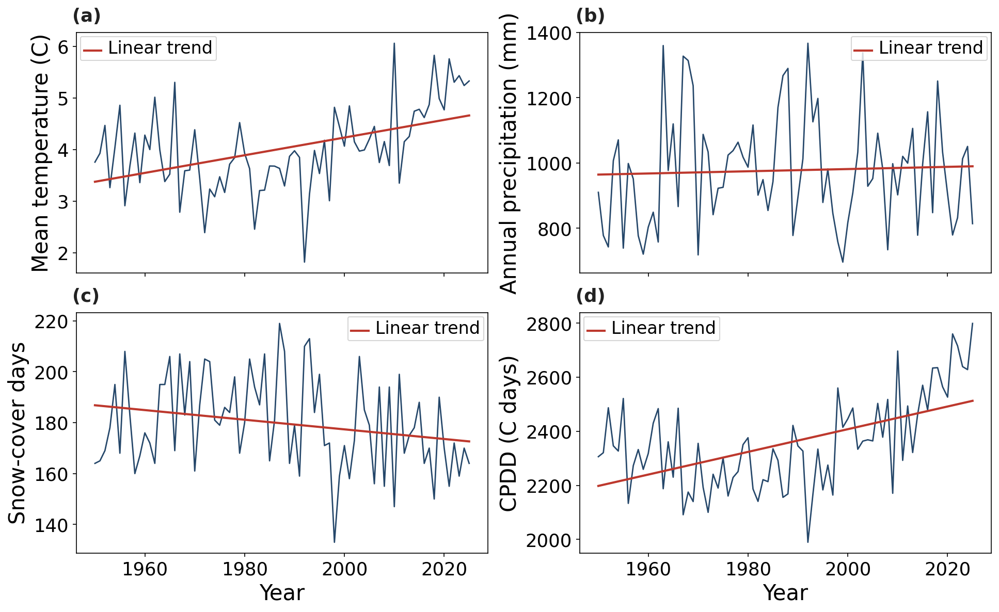

In [6]:
# 3.1 Annual climate indicators and trend table
annual = pd.DataFrame(index=daily.resample("YS").mean().index.year)
annual.index.name = "year"
annual["temperature_C"] = daily["t2m_C"].resample("YS").mean().values
annual["precipitation_mm"] = daily["tp_mm"].resample("YS").sum().values
annual["snowfall_mm"] = daily["sf_mm"].resample("YS").sum().values
annual["snow_cover_days"] = (daily["snowc"] >= 50).resample("YS").sum().values
annual["mean_swe_m"] = daily["sd"].resample("YS").mean().values
annual["snowmelt_mm"] = daily["smlt_mm"].resample("YS").sum().values
annual["cpdd_C_days"] = daily["t2m_C"].clip(lower=0).resample("YS").sum().values

trend_rows = []
for col in annual.columns:
    slope, intercept, r, p, stderr = stats.linregress(annual.index, annual[col])
    tau, mk_p = stats.kendalltau(annual.index, annual[col])
    trend_rows.append({"indicator": col, "slope_per_decade": slope * 10, "linear_p": p,
                       "kendall_tau": tau, "kendall_p": mk_p})
trend_table = pd.DataFrame(trend_rows).round(5)
annual.to_csv(TABLE_DIR / "table_03_annual_indicators.csv")
trend_table.to_csv(TABLE_DIR / "table_04_climate_trends.csv", index=False)
display(trend_table)

fig, axes = plt.subplots(2, 2, figsize=(13, 8), sharex=True)
panels = [("temperature_C", "Mean temperature (C)"), ("precipitation_mm", "Annual precipitation (mm)"),
          ("snow_cover_days", "Snow-cover days"), ("cpdd_C_days", "CPDD (C days)")]
for ax, (col, label) in zip(axes.flat, panels):
    ax.plot(annual.index, annual[col], color="#25476a", lw=1.3)
    fit = np.polyval(np.polyfit(annual.index, annual[col], 1), annual.index)
    ax.plot(annual.index, fit, color="#bd382d", lw=2, label="Linear trend")
    slope = trend_table.loc[trend_table.indicator == col, "slope_per_decade"].iloc[0]
    ax.set_ylabel(label)
    ax.legend(frameon=True, fontsize=8)
axes[1, 0].set_xlabel("Year")
axes[1, 1].set_xlabel("Year")
polish_manuscript_figure(fig)
# Four panels showing four different indicators, so each needs an identity
# the running text can reference.
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_02_historical_climate_diagnostics.png", bbox_inches="tight")
plt.show()


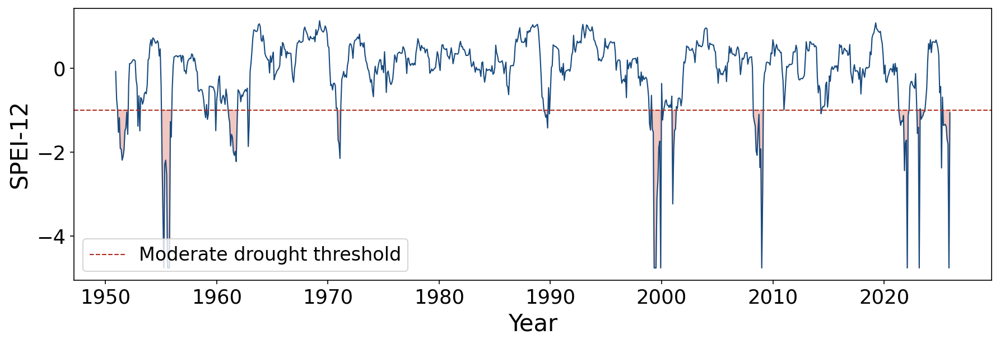

In [7]:
# 3.2 Drought-stress context from precomputed SPEI series
spei_path = DATA_DIR / "hakkari_spei_sonuclari.csv"
spei = pd.read_csv(spei_path, sep=";", parse_dates=["time"]).set_index("time")
spei_annual = pd.DataFrame({
    "spei12_mean": spei["SPEI_12"].resample("YS").mean(),
    "drought_months_spei12": (spei["SPEI_12"] <= -1).resample("YS").sum(),
}).dropna()
spei_annual.index = spei_annual.index.year
spei_annual.index.name = "year"
spei_annual.to_csv(TABLE_DIR / "table_05_spei_drought_stress.csv")

fig, ax = plt.subplots(figsize=(12, 4.2))
ax.plot(spei.index, spei["SPEI_12"], color="#174a7e", lw=1)
ax.axhline(-1, color="#ad2e24", ls="--", lw=1, label="Moderate drought threshold")
ax.fill_between(spei.index, spei["SPEI_12"], -1, where=(spei["SPEI_12"] <= -1),
                color="#d95f4e", alpha=.35)
ax.set(ylabel="SPEI-12", xlabel="Year")
ax.legend()
polish_manuscript_figure(fig)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_03_spei12_drought_stress.png", bbox_inches="tight")
plt.show()


## 4. Landsat/GEE glacier-area target: observed decline context

The area series is captured from the executed `Hakkari_Glacier_GEE.ipynb` output, which reports NDSI threshold `0.20`, explicit year and Landsat image counts. It can serve as an external area target, but interpretation remains limited by `n=24`, single-threshold segmentation and the absence of independent field mass-balance observations.


**Executed GEE output series; NDSI threshold = 0.20; n = 24 years.** Trend slope: `-0.0315 km2/year`, p = `0.0014`.

,indicator,spearman_rho,p_value
0,temperature_C,-0.2591,0.2214
1,precipitation_mm,0.2730,0.1967
2,snow_cover_days,0.0518,0.8100
3,mean_swe_m,0.5087,0.0111
4,cpdd_C_days,-0.4287,0.0366


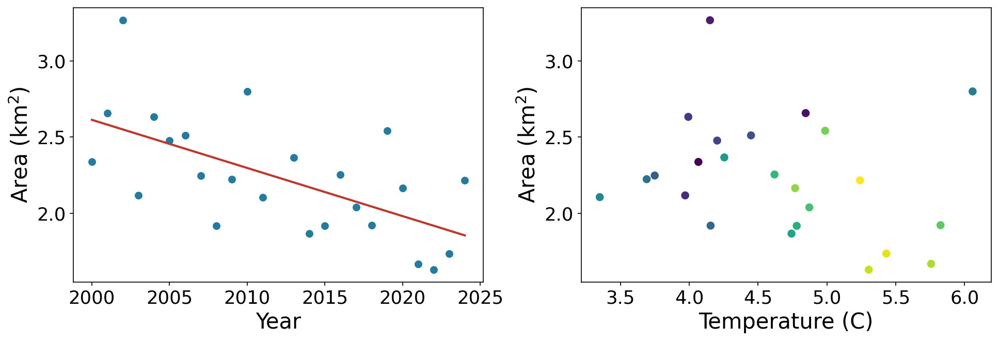

In [8]:
# 4.1 Executed GEE glacier-area trend and climate relationships
glacier = pd.read_csv(glacier_path)
assert {"year", "area_km2", "n_images", "ndsi_threshold"}.issubset(glacier.columns)
assert glacier["ndsi_threshold"].nunique() == 1 and glacier["ndsi_threshold"].iloc[0] == 0.20
provenance_note = "Executed GEE output series; NDSI threshold = 0.20; n = 24 years."

sat = glacier.merge(annual.reset_index(), on="year", how="inner")
slope, intercept, r, p, _ = stats.linregress(sat["year"], sat["area_km2"])
corr_rows = []
for col in ["temperature_C", "precipitation_mm", "snow_cover_days", "mean_swe_m", "cpdd_C_days"]:
    rho, pv = stats.spearmanr(sat["area_km2"], sat[col])
    corr_rows.append({"indicator": col, "spearman_rho": rho, "p_value": pv})
corr = pd.DataFrame(corr_rows).round(4)
sat.to_csv(TABLE_DIR / "table_06_gee_glacier_merged.csv", index=False)
corr.to_csv(TABLE_DIR / "table_07_gee_glacier_correlations.csv", index=False)
display(Markdown(f"**{provenance_note}** Trend slope: `{slope:.4f} km2/year`, p = `{p:.4f}`."))
display(corr)

fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
axes[0].scatter(sat["year"], sat["area_km2"], s=38, color="#247ba0")
axes[0].plot(sat["year"], intercept + slope * sat["year"], color="#bd382d", lw=2)
axes[0].set(xlabel="Year", ylabel="Area (km$^2$)")
axes[1].scatter(sat["temperature_C"], sat["area_km2"], c=sat["year"], cmap="viridis", s=42)
axes[1].set(xlabel="Temperature (C)", ylabel="Area (km$^2$)")
polish_manuscript_figure(fig)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_04_gee_glacier_context.png", bbox_inches="tight")
plt.show()


## 5. Proposed CryoSENSE-HK framework

**Named model.** CryoSENSE-HK is an explainable tree-ensemble decision framework for lead-time forecasting of ERA5-Land snow cover (`snowc`), snow depth (`sd`) and snowmelt (`smlt_mm`) in the Hakkari cryosphere.

**Feature-set logic.**

| Set | Definition | Interpretation |
|---|---|---|
| A: Atmosphere/Energy | Issue-date meteorological and radiative forcing plus seasonality | Conservative no-snow-memory forecast |
| B: Atmosphere + Snowfall + Memory | A plus solid precipitation and lagged snow states known at issue date | Proposed CryoSENSE-HK forecast input |
| C: Full Reanalysis State | B plus additional issue-date snow/runoff state proxies | Upper-bound reanalysis-informed forecast |

**Leakage rule.** For a horizon `h`, every predictor is observed at issue date `t` or earlier, and every target is observed at `t+h`. No same-target-date forcing, snow state or runoff variable is used as a predictor.

**Decision layer.** Mutual-information feature ranking is fitted on training data only for each target and forecast horizon. A compact top-k subset (`k in {4, 6, 8, 10, 12}`) is selected on the validation period to prevent the claimed selected model from degenerating into the full input vector. Tree ensembles are selected on validation data. The held-out test target period is not used for feature or algorithm selection.


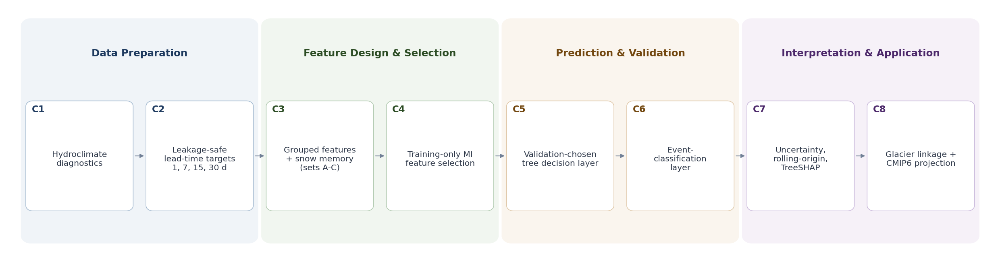

In [9]:
# 5.1 Publication-ready workflow figure (8 components, C1-C8; matches Methods text)
import matplotlib.path as mpath
import matplotlib.patches as mpatches

def rounded_rect_path(x, y, w, h, rx, ry):
    kappa = 0.552284749831
    kx, ky = kappa * rx, kappa * ry
    verts = [
        (x + rx, y), (x + w - rx, y),
        (x + w - rx + kx, y), (x + w, y + ry - ky), (x + w, y + ry),
        (x + w, y + h - ry),
        (x + w, y + h - ry + ky), (x + w - rx + kx, y + h), (x + w - rx, y + h),
        (x + rx, y + h),
        (x + rx - kx, y + h), (x, y + h - ry + ky), (x, y + h - ry),
        (x, y + ry),
        (x, y + ry - ky), (x + rx - kx, y), (x + rx, y), (x + rx, y),
    ]
    codes = [
        mpath.Path.MOVETO, mpath.Path.LINETO,
        mpath.Path.CURVE4, mpath.Path.CURVE4, mpath.Path.CURVE4,
        mpath.Path.LINETO,
        mpath.Path.CURVE4, mpath.Path.CURVE4, mpath.Path.CURVE4,
        mpath.Path.LINETO,
        mpath.Path.CURVE4, mpath.Path.CURVE4, mpath.Path.CURVE4,
        mpath.Path.LINETO,
        mpath.Path.CURVE4, mpath.Path.CURVE4, mpath.Path.CURVE4,
        mpath.Path.CLOSEPOLY,
    ]
    return mpath.Path(verts, codes)

# One box per framework component C1-C8 (same labels/order as the Methods text)
steps = [
    ("C1", "Hydroclimate\ndiagnostics"),
    ("C2", "Leakage-safe\nlead-time targets\n1, 7, 15, 30 d"),
    ("C3", "Grouped features\n+ snow memory\n(sets A-C)"),
    ("C4", "Training-only MI\nfeature selection"),
    ("C5", "Validation-chosen\ntree decision layer"),
    ("C6", "Event-\nclassification\nlayer"),
    ("C7", "Uncertainty,\nrolling-origin,\nTreeSHAP"),
    ("C8", "Glacier linkage +\nCMIP6 projection"),
]
groups = [
    ("Data Preparation", 0, 1, "#f0f4f8", "#1e3a5f", "#a2b9cf"),
    ("Feature Design & Selection", 2, 3, "#f1f6f0", "#2c4c24", "#b1cab0"),
    ("Prediction & Validation", 4, 5, "#faf5ee", "#72470f", "#dfc7a7"),
    ("Interpretation & Application", 6, 7, "#f6f1f8", "#4c286a", "#c9b8db"),
]

aspect = 7.4 / 2.45
fig, ax = plt.subplots(figsize=(16.4, 4.2))
fig.patch.set_facecolor("white")
ax.set_xlim(0, 1); ax.set_ylim(0, 1); ax.axis("off")

left, right, gap = 0.02, 0.98, 0.013
n = len(steps)
box_w = (right - left - gap * (n - 1)) / n
box_h, box_y = 0.44, 0.18
xs = [left + i * (box_w + gap) for i in range(n)]

for label, start_i, end_i, bg_color, text_color, border_color in groups:
    x0 = xs[start_i] - 0.005
    x1 = xs[end_i] + box_w + 0.005
    panel_rx = 0.010; panel_ry = panel_rx * aspect
    ax.add_patch(mpatches.PathPatch(rounded_rect_path(x0, 0.05, x1 - x0, 0.90, panel_rx, panel_ry),
                                    transform=ax.transAxes, fc=bg_color, ec="none", zorder=1))
    ax.text((x0 + x1) / 2, 0.81, label, ha="center", va="center",
            fontsize=11.8, fontweight="bold", color=text_color, transform=ax.transAxes, zorder=2)

for i, ((num, label), x) in enumerate(zip(steps, xs)):
    group_color = group_border = None
    for _, start_i, end_i, _, text_color, border_color in groups:
        if start_i <= i <= end_i:
            group_color, group_border = text_color, border_color
            break
    box_rx = 0.007; box_ry = box_rx * aspect
    ax.add_patch(mpatches.PathPatch(rounded_rect_path(x, box_y, box_w, box_h, box_rx, box_ry),
                                    transform=ax.transAxes, fc="#ffffff", ec=group_border, lw=0.75, zorder=3))
    ax.text(x + 0.006, box_y + box_h - 0.016, num, ha="left", va="top",
            fontsize=11.0, fontweight="black", color=group_color, transform=ax.transAxes, zorder=4)
    ax.text(x + box_w / 2, box_y + box_h / 2 - 0.012, label, ha="center", va="center",
            fontsize=9.8, color="#2d3748", linespacing=1.18, transform=ax.transAxes, zorder=4)
    if i < n - 1:
        y_arrow = box_y + box_h / 2
        ax.annotate("", xy=(xs[i + 1] - 0.002, y_arrow), xytext=(x + box_w + 0.002, y_arrow),
                    xycoords=ax.transAxes,
                    arrowprops=dict(arrowstyle="-|>", lw=0.85, color="#718096",
                                    mutation_scale=10, shrinkA=0, shrinkB=0), zorder=4)

polish_manuscript_figure(fig)
fig.tight_layout(pad=0.2)
fig.savefig(FIG_DIR / "figure_05_cryosense_hk_workflow.png", dpi=600, bbox_inches="tight")
plt.show()


## 6. Snow/rain phase threshold validation

This classification subtask provides class-wise metrics appropriate to precipitation-phase identification. Calibration uses the early record and evaluation uses a later holdout; it is separate from continuous snow-state regression.


Selected training-period threshold: **-0.7 C**

,threshold_C,tp,fp,fn,tn,precision,recall,specificity,balanced_accuracy,f1
0,-0.7,1826,103,65,2285,0.9466,0.9656,0.9569,0.9612,0.956


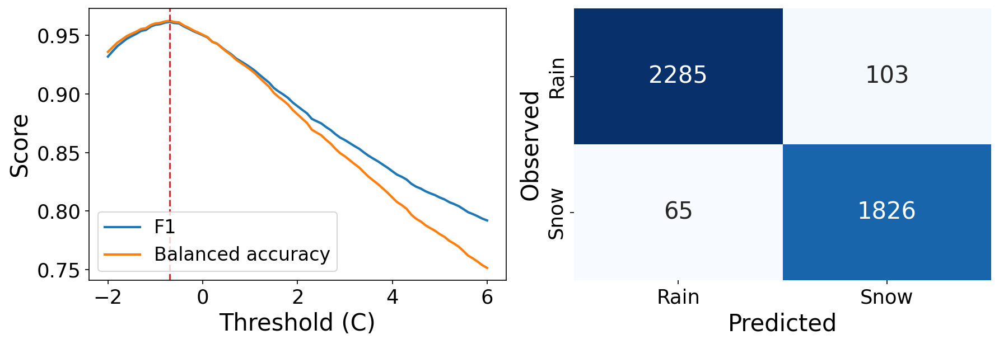

In [10]:
# 6.1 Temperature-threshold classifier with temporal calibration/evaluation
phase = daily.loc[daily["tp_mm"] >= 0.1, ["t2m_C", "tp_mm", "sf_mm"]].copy()
phase["observed_snow"] = (phase["sf_mm"] / phase["tp_mm"].clip(lower=1e-8) >= .5).astype(int)
phase_train = phase.loc[: "1999-12-31"]
phase_test = phase.loc["2000-01-01":]
thresholds = np.arange(-2, 6.01, .1)

def phase_metrics(y, pred):
    tp = int(((y == 1) & (pred == 1)).sum()); tn = int(((y == 0) & (pred == 0)).sum())
    fp = int(((y == 0) & (pred == 1)).sum()); fn = int(((y == 1) & (pred == 0)).sum())
    precision = tp / max(tp + fp, 1); recall = tp / max(tp + fn, 1)
    specificity = tn / max(tn + fp, 1); f1 = 2 * precision * recall / max(precision + recall, 1e-12)
    return {"tp": tp, "fp": fp, "fn": fn, "tn": tn, "precision": precision, "recall": recall,
            "specificity": specificity, "balanced_accuracy": (recall + specificity) / 2, "f1": f1}

cal = []
for threshold in thresholds:
    m = phase_metrics(phase_train["observed_snow"], (phase_train["t2m_C"] <= threshold).astype(int))
    cal.append({"threshold_C": threshold, **m})
cal = pd.DataFrame(cal)
chosen_threshold = cal.loc[cal["f1"].idxmax(), "threshold_C"]
test_phase_result = pd.DataFrame([{"threshold_C": chosen_threshold,
    **phase_metrics(phase_test["observed_snow"], (phase_test["t2m_C"] <= chosen_threshold).astype(int))}])
cal.to_csv(TABLE_DIR / "table_08_phase_threshold_calibration.csv", index=False)
test_phase_result.to_csv(TABLE_DIR / "table_09_phase_threshold_holdout_metrics.csv", index=False)
display(Markdown(f"Selected training-period threshold: **{chosen_threshold:.1f} C**"))
display(test_phase_result.round(4))

fig, axes = plt.subplots(1, 2, figsize=(12, 4.2))
axes[0].plot(cal["threshold_C"], cal["f1"], label="F1", lw=2)
axes[0].plot(cal["threshold_C"], cal["balanced_accuracy"], label="Balanced accuracy", lw=2)
axes[0].axvline(chosen_threshold, color="#bd382d", ls="--")
axes[0].set(xlabel="Threshold (C)", ylabel="Score")
axes[0].legend()
m = test_phase_result.iloc[0]
cm = np.array([[m["tn"], m["fp"]], [m["fn"], m["tp"]]])
sns.heatmap(cm, annot=True, fmt=".0f", cmap="Blues", cbar=False, ax=axes[1],
            xticklabels=["Rain", "Snow"], yticklabels=["Rain", "Snow"],
            annot_kws={"size": 20})
axes[1].set(xlabel="Predicted", ylabel="Observed")
polish_manuscript_figure(fig)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_06_phase_threshold_validation.png", bbox_inches="tight")
plt.show()


## 7. Feature engineering, data split and selection protocol

The primary regression claim is based on **Set B**, which combines issue-date atmospheric forcing, snowfall and snow-memory variables that are already known at forecast issue time. The targets are shifted forward to `t+h` for `h in {1, 7, 15, 30}` days. Set C is retained only as an explicit upper-bound design using additional issue-date reanalysis state proxies. The continuous tasks do not use confusion matrices; they use regression and hydrological efficiency metrics.


In [11]:
# 7.1 Forecast features, shifted targets and chronological holdout design
model_df = daily.copy()
day = model_df.index.dayofyear
model_df["doy_sin"] = np.sin(2 * np.pi * day / 365.25)
model_df["doy_cos"] = np.cos(2 * np.pi * day / 365.25)
model_df["net_radiation_W"] = model_df["ssr_W"] + model_df["str_W"]

for col in ["t2m_C", "tp_mm", "sf_mm", "snowc", "sd", "smlt_mm"]:
    for lag in [1, 3, 7]:
        model_df[f"{col}_lag{lag}"] = model_df[col].shift(lag)
for col in ["snowc", "sd"]:
    model_df[f"{col}_lag0"] = model_df[col]

FORECAST_HORIZONS = [1, 7, 15, 30]

feature_sets = {
    "A_atmosphere_energy": ["t2m_C", "d2m_C", "sp_hPa", "ws", "tp_mm",
                             "e_mm", "ssrd_W", "strd_W", "slhf_W", "sshf_W",
                             "net_radiation_W", "doy_sin", "doy_cos"],
    "B_atmosphere_snowfall_memory": ["t2m_C", "d2m_C", "sp_hPa", "ws", "tp_mm",
                              "sf_mm", "e_mm", "ssrd_W", "strd_W", "slhf_W", "sshf_W",
                              "net_radiation_W", "doy_sin", "doy_cos",
                              "t2m_C_lag1", "t2m_C_lag3", "t2m_C_lag7",
                              "tp_mm_lag1", "tp_mm_lag3", "tp_mm_lag7",
                              "sf_mm_lag1", "sf_mm_lag3", "sf_mm_lag7",
                              "snowc_lag0", "snowc_lag1", "snowc_lag3", "snowc_lag7",
                              "sd_lag0", "sd_lag1", "sd_lag3", "sd_lag7",
                              "smlt_mm_lag1", "smlt_mm_lag3", "smlt_mm_lag7"],
    "C_full_reanalysis_state": ["t2m_C", "d2m_C", "tsn_C", "sp_hPa", "ws", "tp_mm",
                                "sf_mm", "e_mm", "ssrd_W", "strd_W", "slhf_W", "sshf_W",
                                "net_radiation_W", "rsn", "sde_mm", "sro_mm", "ro_mm",
                                "ssro_mm", "doy_sin", "doy_cos",
                                "t2m_C_lag1", "t2m_C_lag3", "t2m_C_lag7",
                                "tp_mm_lag1", "tp_mm_lag3", "tp_mm_lag7",
                                "sf_mm_lag1", "sf_mm_lag3", "sf_mm_lag7",
                                "snowc_lag0", "snowc_lag1", "snowc_lag3", "snowc_lag7",
                                "sd_lag0", "sd_lag1", "sd_lag3", "sd_lag7",
                                "smlt_mm_lag1", "smlt_mm_lag3", "smlt_mm_lag7"],
}
# Target labels follow the ECMWF definitions checked in cell 1.2: the modelled
# variable "sd" is snow depth WATER EQUIVALENT, not snow thickness.
targets = {"snowc": "Snow cover (%)", "sd": "Snow water equivalent (m w.e.)",
           "smlt_mm": "Snowmelt (mm w.e./day)"}

def target_col(target, horizon):
    return f"{target}_h{horizon}"

def make_forecast_frame(base, horizon):
    df = base.copy()
    df["issue_date"] = df.index
    df["target_date"] = df.index + pd.to_timedelta(horizon, unit="D")
    df["target_doy"] = df["target_date"].dt.dayofyear
    for target in targets:
        df[target_col(target, horizon)] = df[target].shift(-horizon)
    required = sorted(set(sum(feature_sets.values(), []) + [target_col(t, horizon) for t in targets]))
    return df.dropna(subset=required + ["target_date", "target_doy"]).copy()

def split_forecast_frame(frame):
    train_h = frame.loc[frame["target_date"] <= pd.Timestamp("2002-12-31")].copy()
    valid_h = frame.loc[(frame["target_date"] >= pd.Timestamp("2003-01-01")) &
                        (frame["target_date"] <= pd.Timestamp("2014-12-31"))].copy()
    test_h = frame.loc[frame["target_date"] >= pd.Timestamp("2015-01-01")].copy()
    return train_h, valid_h, test_h

forecast_frames = {}
split_rows = []
for horizon in FORECAST_HORIZONS:
    hdf = make_forecast_frame(model_df, horizon)
    train_h, valid_h, test_h = split_forecast_frame(hdf)
    forecast_frames[horizon] = {"data": hdf, "train": train_h, "valid": valid_h, "test": test_h}
    split_rows.extend([
        {"horizon_days": horizon, "split": "Training", "target_period": "1950-2002",
         "n_rows": len(train_h), "issue_start": train_h.index.min().date(), "issue_end": train_h.index.max().date(),
         "role": "feature ranking and fitting"},
        {"horizon_days": horizon, "split": "Validation", "target_period": "2003-2014",
         "n_rows": len(valid_h), "issue_start": valid_h.index.min().date(), "issue_end": valid_h.index.max().date(),
         "role": "top-k and decision-layer selection"},
        {"horizon_days": horizon, "split": "Test", "target_period": "2015-2025",
         "n_rows": len(test_h), "issue_start": test_h.index.min().date(), "issue_end": test_h.index.max().date(),
         "role": "held-out final evaluation"},
    ])

split_table = pd.DataFrame(split_rows)
split_table.to_csv(TABLE_DIR / "table_10_temporal_split_protocol.csv", index=False)
display(split_table)


,horizon_days,split,target_period,n_rows,issue_start,issue_end,role
0,1,Training,1950-2002,19350,1950-01-08,2002-12-30,feature ranking and fitting
1,1,Validation,2003-2014,4383,2002-12-31,2014-12-30,top-k and decision-layer selection
2,1,Test,2015-2025,4018,2014-12-31,2025-12-30,held-out final evaluation
3,7,Training,1950-2002,19344,1950-01-08,2002-12-24,feature ranking and fitting
4,7,Validation,2003-2014,4383,2002-12-25,2014-12-24,top-k and decision-layer selection
5,7,Test,2015-2025,4018,2014-12-25,2025-12-24,held-out final evaluation
6,15,Training,1950-2002,19336,1950-01-08,2002-12-16,feature ranking and fitting
7,15,Validation,2003-2014,4383,2002-12-17,2014-12-16,top-k and decision-layer selection
8,15,Test,2015-2025,4018,2014-12-17,2025-12-16,held-out final evaluation
9,30,Training,1950-2002,19321,1950-01-08,2002-12-01,feature ranking and fitting


In [12]:
# 7.2 Reusable selection, decision-layer and metric functions
def kge(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    r = np.corrcoef(y_true, y_pred)[0, 1]
    alpha = np.std(y_pred) / max(np.std(y_true), 1e-12)
    beta = np.mean(y_pred) / max(np.mean(y_true), 1e-12)
    return 1 - np.sqrt((r - 1) ** 2 + (alpha - 1) ** 2 + (beta - 1) ** 2)

def regression_metrics(y, pred):
    return {"RMSE": np.sqrt(mean_squared_error(y, pred)), "MAE": mean_absolute_error(y, pred),
            "R2": r2_score(y, pred), "NSE": 1 - np.sum((y - pred) ** 2) / np.sum((y - y.mean()) ** 2),
            "KGE": kge(y, pred)}

def decision_model(name):
    if name == "XGBoost":
        return XGBRegressor(n_estimators=180, max_depth=4, learning_rate=.06, subsample=.85,
                            colsample_bytree=.85, objective="reg:squarederror", tree_method="hist",
                            random_state=SEED, n_jobs=4)
    if name == "Random Forest":
        return RandomForestRegressor(n_estimators=100, max_depth=12, min_samples_leaf=2, max_features=.8,
                                     random_state=SEED, n_jobs=4)
    return ExtraTreesRegressor(n_estimators=100, max_depth=12, min_samples_leaf=2, max_features=.9,
                               random_state=SEED, n_jobs=4)

def rank_features(frame, features, target):
    mi = mutual_info_regression(frame[features], frame[target], random_state=SEED)
    return pd.Series(mi, index=features).sort_values(ascending=False)

def tune_top_k(train_df, valid_df, features, target, algorithm="XGBoost"):
    ranking = rank_features(train_df, features, target)
    candidates = sorted(set([4, 6, 8, 10, 12]))
    candidates = [k for k in candidates if k <= len(features)]
    scores = []
    for k in candidates:
        selected = ranking.index[:k].tolist()
        model = decision_model(algorithm)
        model.fit(train_df[selected], train_df[target])
        pred = model.predict(valid_df[selected])
        scores.append({"k": k, "RMSE": regression_metrics(valid_df[target], pred)["RMSE"]})
    scores = pd.DataFrame(scores)
    best_k = int(scores.loc[scores["RMSE"].idxmin(), "k"])
    return ranking, best_k, scores

def bootstrap_regression_ci(y, pred, n_boot=500, seed=SEED):
    y = np.asarray(y)
    pred = np.asarray(pred)
    rng = np.random.RandomState(seed)
    rows = []
    for _ in range(n_boot):
        idx = rng.randint(0, len(y), len(y))
        rows.append(regression_metrics(y[idx], pred[idx]))
    boot = pd.DataFrame(rows)
    return {
        "RMSE_ci_low": boot["RMSE"].quantile(0.025),
        "RMSE_ci_high": boot["RMSE"].quantile(0.975),
        "R2_ci_low": boot["R2"].quantile(0.025),
        "R2_ci_high": boot["R2"].quantile(0.975),
    }

def paired_rmse_bootstrap(y, model_pred, baseline_pred, n_boot=1000, seed=SEED):
    y = np.asarray(y)
    model_pred = np.asarray(model_pred)
    baseline_pred = np.asarray(baseline_pred)
    rng = np.random.RandomState(seed)
    def rmse(a, b):
        return np.sqrt(np.mean((a - b) ** 2))
    observed_delta = rmse(y, model_pred) - rmse(y, baseline_pred)
    boot_delta = []
    for _ in range(n_boot):
        idx = rng.randint(0, len(y), len(y))
        boot_delta.append(rmse(y[idx], model_pred[idx]) - rmse(y[idx], baseline_pred[idx]))
    boot_delta = np.asarray(boot_delta)
    p_two_sided = min(1.0, 2 * min(np.mean(boot_delta <= 0), np.mean(boot_delta >= 0)))
    return {
        "delta_RMSE_model_minus_baseline": observed_delta,
        "delta_RMSE_ci_low": np.quantile(boot_delta, 0.025),
        "delta_RMSE_ci_high": np.quantile(boot_delta, 0.975),
        "bootstrap_p_two_sided": p_two_sided,
    }


## 8. Feature-set ablation and feature-selection effect

The ablation is the principal safeguard against overstating performance driven by current snow-state memory. Selection is derived from training data separately for each horizon; validation selects feature count; test reports final target-period performance.


,horizon_days,target,target_col,feature_group,n_selected,RMSE,MAE,R2,NSE,KGE
0,1,snowc,snowc_h1,A_atmosphere_energy,12,5.0225,1.4858,0.9894,0.9894,0.9927
1,1,snowc,snowc_h1,B_atmosphere_snowfall_memory,4,4.3799,0.7749,0.9920,0.9920,0.9938
2,1,snowc,snowc_h1,C_full_reanalysis_state,8,4.3880,0.7268,0.9919,0.9919,0.9948
3,1,sd,sd_h1,A_atmosphere_energy,12,0.0930,0.0473,0.7921,0.7921,0.8529
4,1,sd,sd_h1,B_atmosphere_snowfall_memory,12,0.0056,0.0027,0.9993,0.9993,0.9984
5,1,sd,sd_h1,C_full_reanalysis_state,12,0.0055,0.0026,0.9993,0.9993,0.9981
6,1,smlt_mm,smlt_mm_h1,A_atmosphere_energy,12,1.1143,0.4195,0.9515,0.9515,0.9340
7,1,smlt_mm,smlt_mm_h1,B_atmosphere_snowfall_memory,12,1.1446,0.3858,0.9489,0.9489,0.9419
8,1,smlt_mm,smlt_mm_h1,C_full_reanalysis_state,12,1.2681,0.4318,0.9372,0.9372,0.9184
9,7,snowc,snowc_h7,A_atmosphere_energy,12,12.2982,4.4515,0.9366,0.9366,0.9507


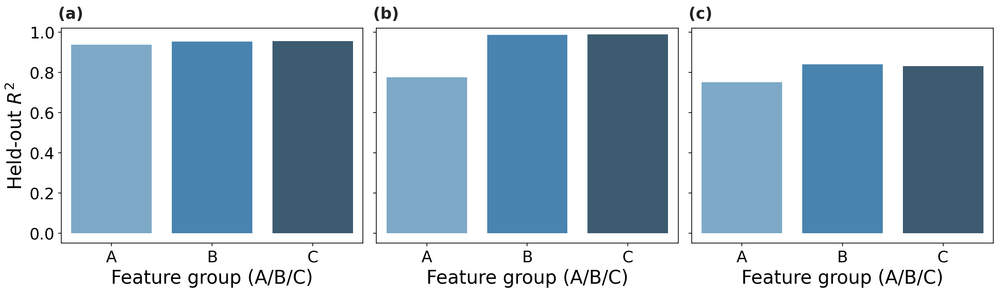

In [13]:
# 8.1 XGBoost ablation across feature groups and forecast horizons
ablation_rows, selection_rows = [], []
for horizon in FORECAST_HORIZONS:
    train_h = forecast_frames[horizon]["train"]
    valid_h = forecast_frames[horizon]["valid"]
    test_h = forecast_frames[horizon]["test"]
    fit_h = pd.concat([train_h, valid_h])
    for target in targets:
        ycol = target_col(target, horizon)
        for group, features in feature_sets.items():
            ranking, best_k, tuning = tune_top_k(train_h, valid_h, features, ycol, "XGBoost")
            selected = ranking.index[:best_k].tolist()
            model = decision_model("XGBoost")
            model.fit(fit_h[selected], fit_h[ycol])
            pred = model.predict(test_h[selected])
            met = regression_metrics(test_h[ycol], pred)
            ablation_rows.append({"horizon_days": horizon, "target": target, "target_col": ycol,
                                  "feature_group": group, "n_selected": best_k, **met})
            selection_rows.extend([{"horizon_days": horizon, "target": target, "target_col": ycol,
                                    "feature_group": group, "rank": rank + 1,
                                    "feature": f, "MI_training": ranking.loc[f], "selected": rank < best_k}
                                   for rank, f in enumerate(ranking.index)])

ablation = pd.DataFrame(ablation_rows)
selection = pd.DataFrame(selection_rows)
ablation.to_csv(TABLE_DIR / "table_11_feature_group_ablation.csv", index=False)
selection.to_csv(TABLE_DIR / "table_12_training_only_feature_selection.csv", index=False)
display(ablation.round(4))

plot_ablation = ablation.loc[ablation.horizon_days == 7].copy()
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), sharey=True)
for ax, (target, label) in zip(axes, targets.items()):
    one = plot_ablation.loc[plot_ablation.target == target].copy()
    one["short"] = one["feature_group"].str[0]
    sns.barplot(data=one, x="short", y="R2", ax=ax, palette="Blues_d")
    ax.set(xlabel="Feature group (A/B/C)", ylabel="Held-out $R^2$")
    ax.set_ylim(min(-.05, one["R2"].min() - .05), 1.02)
polish_manuscript_figure(fig)
# Shared y-axis: one neutral label, panels identified by letter and named
# by target in the running text.
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_07_feature_group_ablation.png", bbox_inches="tight")
plt.show()


In [14]:
# 8.2 Feature-selection effect for proposed Set B across horizons
effect_rows = []
proposed_features = feature_sets["B_atmosphere_snowfall_memory"]
for horizon in FORECAST_HORIZONS:
    train_h = forecast_frames[horizon]["train"]
    valid_h = forecast_frames[horizon]["valid"]
    test_h = forecast_frames[horizon]["test"]
    fit_h = pd.concat([train_h, valid_h])
    for target in targets:
        ycol = target_col(target, horizon)
        ranking, best_k, tuning = tune_top_k(train_h, valid_h, proposed_features, ycol, "XGBoost")
        for label, selected in [("All features", proposed_features), ("MI-selected features", ranking.index[:best_k].tolist())]:
            model = decision_model("XGBoost")
            model.fit(fit_h[selected], fit_h[ycol])
            met = regression_metrics(test_h[ycol], model.predict(test_h[selected]))
            effect_rows.append({"horizon_days": horizon, "target": target, "target_col": ycol,
                                "input_design": label, "n_features": len(selected), **met})
selection_effect = pd.DataFrame(effect_rows)
selection_effect.to_csv(TABLE_DIR / "table_13_feature_selection_effect.csv", index=False)
display(selection_effect.round(4))


,horizon_days,target,target_col,input_design,n_features,RMSE,MAE,R2,NSE,KGE
0,1,snowc,snowc_h1,All features,34,2.6437,0.5169,0.9971,0.9971,0.9977
1,1,snowc,snowc_h1,MI-selected features,4,4.3799,0.7749,0.9920,0.9920,0.9938
2,1,sd,sd_h1,All features,34,0.0037,0.0018,0.9997,0.9997,0.9992
3,1,sd,sd_h1,MI-selected features,12,0.0056,0.0027,0.9993,0.9993,0.9984
4,1,smlt_mm,smlt_mm_h1,All features,34,1.0317,0.3542,0.9584,0.9584,0.9597
5,1,smlt_mm,smlt_mm_h1,MI-selected features,12,1.1446,0.3858,0.9489,0.9489,0.9419
6,7,snowc,snowc_h7,All features,34,10.5493,3.4768,0.9534,0.9534,0.9612
7,7,snowc,snowc_h7,MI-selected features,6,10.6297,3.5276,0.9527,0.9527,0.9579
8,7,sd,sd_h7,All features,34,0.0215,0.0120,0.9889,0.9889,0.9901
9,7,sd,sd_h7,MI-selected features,10,0.0241,0.0135,0.9861,0.9861,0.9832


## 9. Decision-layer comparison and baseline-controlled final results

The proposed input design is **Set B**. XGBoost, Random Forest and Extra Trees are compared on validation data for every target-horizon pair; the selected algorithm is refitted using training plus validation data and evaluated once on the held-out target period. Persistence uses the issue-date value at `t` as the forecast for `t+h`, and day-of-year climatology uses the target date, not the issue date.


,horizon_days,target,target_col,algorithm,RMSE,MAE,R2,NSE,KGE
0,1,snowc,snowc_h1,XGBoost,4.6077,0.7858,0.9911,0.9911,0.9948
1,1,snowc,snowc_h1,Random Forest,4.2807,0.7085,0.9923,0.9923,0.9952
2,1,snowc,snowc_h1,Extra Trees,4.3337,0.7495,0.9921,0.9921,0.9950
3,1,sd,sd_h1,XGBoost,0.0059,0.0029,0.9992,0.9992,0.9991
4,1,sd,sd_h1,Random Forest,0.0055,0.0026,0.9994,0.9994,0.9972
5,1,sd,sd_h1,Extra Trees,0.0057,0.0027,0.9993,0.9993,0.9986
6,1,smlt_mm,smlt_mm_h1,XGBoost,1.2269,0.4092,0.9487,0.9487,0.9535
7,1,smlt_mm,smlt_mm_h1,Random Forest,1.2143,0.3889,0.9498,0.9498,0.9598
8,1,smlt_mm,smlt_mm_h1,Extra Trees,1.2085,0.3995,0.9502,0.9502,0.9546
9,7,snowc,snowc_h7,XGBoost,13.5802,4.0270,0.9226,0.9226,0.9547


,target,horizon_days,selected_features
0,snowc,1,"snowc_lag0, sd_lag0, snowc_lag1, sd_lag1"
1,sd,1,"sd_lag0, sd_lag1, sd_lag3, sd_lag7, snowc_lag0..."
2,smlt_mm,1,"smlt_mm_lag1, sd_lag0, snowc_lag0, sd_lag1, sm..."
3,snowc,7,"sd_lag0, snowc_lag0, doy_cos, doy_sin, sd_lag1..."
4,sd,7,"sd_lag0, sd_lag1, sd_lag3, sd_lag7, doy_sin, s..."
5,smlt_mm,7,"doy_cos, doy_sin, smlt_mm_lag1, sd_lag0, t2m_C..."
6,snowc,15,"doy_cos, doy_sin, t2m_C, t2m_C_lag1, t2m_C_lag..."
7,sd,15,"sd_lag0, sd_lag1, sd_lag3, sd_lag7, doy_cos, d..."
8,smlt_mm,15,"doy_sin, doy_cos, t2m_C, sd_lag7, t2m_C_lag1, ..."
9,snowc,30,"doy_sin, doy_cos, net_radiation_W, t2m_C, t2m_..."


,horizon_days,target,target_col,method,n_features,RMSE,MAE,R2,NSE,KGE,RMSE_ci_low,RMSE_ci_high,R2_ci_low,R2_ci_high
0,1,snowc,snowc_h1,CryoSENSE-HK (Random Forest),4,4.4390,0.7338,0.9917,0.9917,0.9946,3.6385,5.1563,0.9888,0.9945
1,1,snowc,snowc_h1,Persistence (issue-day t),1,5.3081,0.8927,0.9882,0.9882,0.9941,4.3771,6.2139,0.9838,0.9920
2,1,snowc,snowc_h1,Training target-DOY climatology,1,18.1580,7.4609,0.8619,0.8619,0.8712,17.1408,19.0673,0.8467,0.8773
3,1,sd,sd_h1,CryoSENSE-HK (Random Forest),12,0.0050,0.0024,0.9994,0.9994,0.9971,0.0047,0.0053,0.9993,0.9995
4,1,sd,sd_h1,Persistence (issue-day t),1,0.0077,0.0033,0.9986,0.9986,0.9993,0.0073,0.0080,0.9984,0.9987
5,1,sd,sd_h1,Training target-DOY climatology,1,0.1201,0.0660,0.6536,0.6536,0.6942,0.1155,0.1247,0.6238,0.6812
6,1,smlt_mm,smlt_mm_h1,CryoSENSE-HK (Extra Trees),12,1.1051,0.3695,0.9523,0.9523,0.9460,1.0215,1.1864,0.9443,0.9600
7,1,smlt_mm,smlt_mm_h1,Persistence (issue-day t),1,1.4024,0.4468,0.9232,0.9232,0.9616,1.2997,1.4980,0.9117,0.9348
8,1,smlt_mm,smlt_mm_h1,Training target-DOY climatology,1,3.8760,1.5764,0.4135,0.4135,0.6100,3.6859,4.0914,0.3510,0.4677
9,7,snowc,snowc_h7,CryoSENSE-HK (Extra Trees),6,10.2875,3.2970,0.9557,0.9557,0.9598,9.5216,10.9975,0.9492,0.9620


,horizon_days,target,baseline,delta_RMSE_model_minus_baseline,delta_RMSE_ci_low,delta_RMSE_ci_high,bootstrap_p_two_sided
0,1,snowc,Persistence (issue-day t),-0.8690,-1.3976,-0.3593,0.002
1,1,snowc,Training target-DOY climatology,-13.7190,-15.0164,-12.5617,0.000
2,1,sd,Persistence (issue-day t),-0.0027,-0.0029,-0.0024,0.000
3,1,sd,Training target-DOY climatology,-0.1151,-0.1198,-0.1104,0.000
4,1,smlt_mm,Persistence (issue-day t),-0.2973,-0.3860,-0.2090,0.000
5,1,smlt_mm,Training target-DOY climatology,-2.7710,-2.9697,-2.5750,0.000
6,7,snowc,Persistence (issue-day t),-6.7620,-7.8601,-5.5818,0.000
7,7,snowc,Training target-DOY climatology,-7.8705,-8.9066,-6.8373,0.000
8,7,sd,Persistence (issue-day t),-0.0197,-0.0213,-0.0181,0.000
9,7,sd,Training target-DOY climatology,-0.0963,-0.1009,-0.0919,0.000


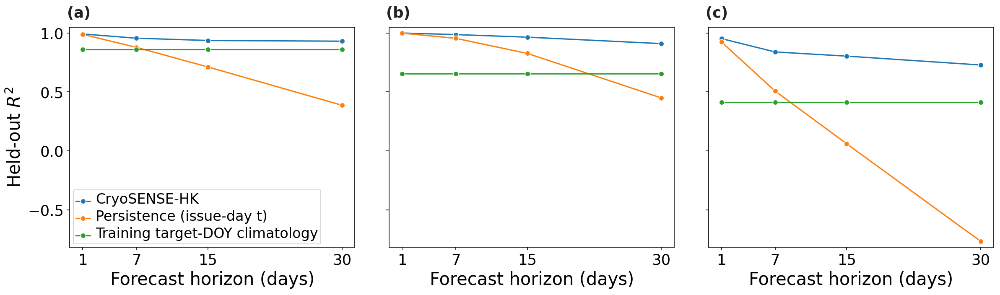

In [15]:
# 9.1 Select decision layer on validation period, then evaluate held-out target period
algorithms = ["XGBoost", "Random Forest", "Extra Trees"]
candidate_rows, final_rows, skill_test_rows = [], [], []
prediction_rows, fitted_models, selected_features = [], {}, {}

for horizon in FORECAST_HORIZONS:
    train_h = forecast_frames[horizon]["train"]
    valid_h = forecast_frames[horizon]["valid"]
    test_h = forecast_frames[horizon]["test"]
    fit_h = pd.concat([train_h, valid_h])
    for target in targets:
        ycol = target_col(target, horizon)
        key = (target, horizon)
        ranking, best_k, _ = tune_top_k(train_h, valid_h, proposed_features, ycol, "XGBoost")
        selected = ranking.index[:best_k].tolist()
        selected_features[key] = selected
        for algorithm in algorithms:
            m = decision_model(algorithm)
            m.fit(train_h[selected], train_h[ycol])
            candidate_rows.append({"horizon_days": horizon, "target": target, "target_col": ycol,
                                   "algorithm": algorithm,
                                   **regression_metrics(valid_h[ycol], m.predict(valid_h[selected]))})
        cand = pd.DataFrame(candidate_rows)
        best_algorithm = cand[(cand.horizon_days == horizon) & (cand.target == target)].sort_values("RMSE").iloc[0]["algorithm"]
        final_model = decision_model(best_algorithm)
        final_model.fit(fit_h[selected], fit_h[ycol])
        fitted_models[key] = (best_algorithm, final_model)

        model_pred = final_model.predict(test_h[selected])
        persistence = test_h[target].values
        climatology = train_h.groupby("target_doy")[ycol].mean()
        climate_pred = test_h["target_doy"].map(climatology).fillna(train_h[ycol].mean()).values
        methods = [
            (f"CryoSENSE-HK ({best_algorithm})", len(selected), model_pred),
            ("Persistence (issue-day t)", 1, persistence),
            ("Training target-DOY climatology", 1, climate_pred),
        ]
        for method, n_features, pred in methods:
            met = regression_metrics(test_h[ycol], pred)
            ci = bootstrap_regression_ci(test_h[ycol], pred, seed=SEED + horizon + len(target) + n_features)
            final_rows.append({"horizon_days": horizon, "target": target, "target_col": ycol,
                               "method": method, "n_features": n_features, **met, **ci})
            for issue_date, target_date, observed, predicted in zip(test_h.index, test_h["target_date"], test_h[ycol], pred):
                prediction_rows.append({"horizon_days": horizon, "target": target, "method": method,
                                        "issue_date": issue_date, "target_date": target_date,
                                        "observed": observed, "predicted": predicted})
        for baseline_name, baseline_pred in [
            ("Persistence (issue-day t)", persistence),
            ("Training target-DOY climatology", climate_pred),
        ]:
            skill_test_rows.append({"horizon_days": horizon, "target": target, "baseline": baseline_name,
                                    **paired_rmse_bootstrap(test_h[ycol], model_pred, baseline_pred,
                                                           seed=SEED + 100 * horizon + len(target))})

candidate_results = pd.DataFrame(candidate_rows)
final_results = pd.DataFrame(final_rows)
forecast_predictions = pd.DataFrame(prediction_rows)
skill_tests = pd.DataFrame(skill_test_rows)
selected_table = pd.DataFrame([{"target": t, "horizon_days": h, "selected_features": ", ".join(fs)}
                               for (t, h), fs in selected_features.items()])
candidate_results.to_csv(TABLE_DIR / "table_14_decision_layer_validation.csv", index=False)
selected_table.to_csv(TABLE_DIR / "table_15_proposed_selected_features.csv", index=False)
final_results.to_csv(TABLE_DIR / "table_16_heldout_model_and_baselines.csv", index=False)
forecast_predictions.to_csv(TABLE_DIR / "table_16a_heldout_forecast_predictions.csv", index=False)
skill_tests.to_csv(TABLE_DIR / "table_16c_paired_bootstrap_skill_tests.csv", index=False)
display(candidate_results.round(4))
display(selected_table)
display(final_results.round(4))
display(skill_tests.round(4))

# Collapse per-horizon algorithm names so a single CryoSENSE-HK line/legend entry is shown.
plot_df = final_results.copy()
plot_df["method_group"] = plot_df["method"].str.replace(r"CryoSENSE-HK \(.*\)", "CryoSENSE-HK", regex=True)
method_order = ["CryoSENSE-HK", "Persistence (issue-day t)", "Training target-DOY climatology"]

fig, axes = plt.subplots(1, 3, figsize=(16, 4.8), sharey=True)
for ax, (target, label) in zip(axes, targets.items()):
    one = plot_df[plot_df.target == target].copy()
    sns.lineplot(data=one, x="horizon_days", y="R2", hue="method_group",
                 hue_order=method_order, marker="o", ax=ax)
    ax.set(xlabel="Forecast horizon (days)", ylabel="Held-out $R^2$")
    ax.set_xticks(FORECAST_HORIZONS)
    ax.set_ylim(min(-0.1, one["R2"].min() - 0.05), 1.05)
    if ax is not axes[0]:
        leg = ax.get_legend()
        if leg is not None:
            leg.remove()
axes[0].legend(fontsize=8, title="", loc="lower left")
polish_manuscript_figure(fig)
# The three panels share one y-axis, so matplotlib draws the label of the leftmost
# panel only and that label cannot name a target without appearing to name all
# three. Panels are identified by letter here and by target in the caption.
axes[0].set_ylabel("Held-out $R^2$")
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_08_final_model_baselines.png", bbox_inches="tight")
plt.show()


## 9b. Snow-regime event classification (event decision layer)

To meet the applied-classification reporting standard, the event-classification layer forecasts two operational snow-regime events at `t+h`: **future high-snowmelt day** and **future snow-covered day**. The high-snowmelt threshold is the training-period 90th percentile of `smlt_mm_h`; the snow-covered threshold is `snowc_h >= 50%`. The decision layer (XGBoost, Random Forest or Extra Trees) is selected on validation F1, refitted on training plus validation, and evaluated once on the held-out target period against issue-day persistence and target-day climatological-frequency baselines. Reported metrics are accuracy, balanced accuracy, precision, recall, specificity, F1, AUC and Cohen's kappa, with confusion matrices.


,event,horizon_days,threshold_mm_day,model,n_selected,positive_rate,Accuracy,Balanced_accuracy,Precision,Recall,Specificity,F1,AUC,Cohen_kappa,threshold_percent
0,High snowmelt day,1,7.8088,CryoSENSE-HK (Random Forest),10,0.0906,0.9853,0.9561,0.9178,0.9203,0.9918,0.9191,0.9975,0.9110,NaN
1,High snowmelt day,1,7.8088,Issue-day persistence,1,0.0906,0.9826,0.9471,0.9038,0.9038,0.9904,0.9038,0.9471,0.8943,NaN
2,High snowmelt day,1,7.8088,Target-DOY climatology baseline,0,0.0906,0.9313,0.8113,0.6111,0.6648,0.9579,0.6368,0.9481,0.5990,NaN
3,Snow-covered day,1,NaN,CryoSENSE-HK (Random Forest),10,0.4609,0.9960,0.9958,0.9978,0.9935,0.9982,0.9957,0.9998,0.9920,50.0
4,Snow-covered day,1,NaN,Issue-day persistence,1,0.4609,0.9925,0.9925,0.9919,0.9919,0.9931,0.9919,0.9925,0.9850,50.0
5,Snow-covered day,1,NaN,Target-DOY climatology baseline,0,0.4609,0.9482,0.9507,0.9122,0.9822,0.9192,0.9459,0.9930,0.8964,50.0
6,High snowmelt day,7,7.8092,CryoSENSE-HK (Random Forest),10,0.0906,0.9676,0.8993,0.8250,0.8159,0.9828,0.8204,0.9901,0.8027,NaN
7,High snowmelt day,7,7.8092,Issue-day persistence,1,0.0906,0.9447,0.8323,0.6951,0.6951,0.9696,0.6951,0.8323,0.6647,NaN
8,High snowmelt day,7,7.8092,Target-DOY climatology baseline,0,0.0906,0.9313,0.8113,0.6111,0.6648,0.9579,0.6368,0.9481,0.5990,NaN
9,Snow-covered day,7,NaN,CryoSENSE-HK (Extra Trees),10,0.4609,0.9831,0.9824,0.9890,0.9741,0.9908,0.9815,0.9986,0.9659,50.0


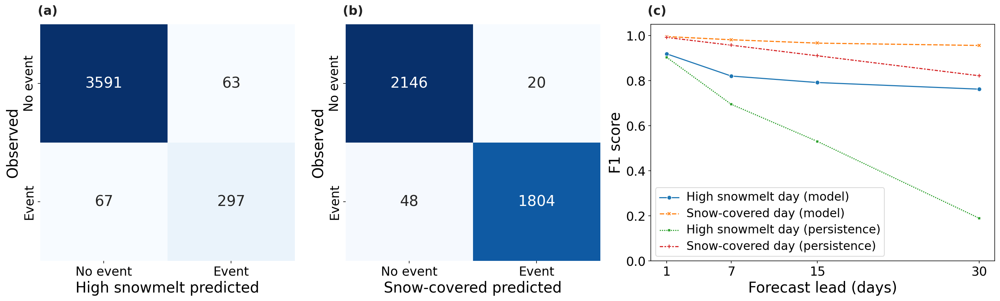

In [16]:
# 9b.1 Lead-time snow-regime event classification with full metric suite
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.feature_selection import mutual_info_classif
from sklearn.metrics import (accuracy_score, balanced_accuracy_score, precision_score,
                             recall_score, f1_score, roc_auc_score, cohen_kappa_score,
                             confusion_matrix)
from xgboost import XGBClassifier

def event_classifier(name):
    if name == "XGBoost":
        return XGBClassifier(n_estimators=180, max_depth=4, learning_rate=.06, subsample=.85,
                             colsample_bytree=.85, tree_method="hist", eval_metric="logloss",
                             random_state=SEED, n_jobs=4)
    if name == "Random Forest":
        return RandomForestClassifier(n_estimators=200, max_depth=12, min_samples_leaf=2,
                                      max_features=.8, class_weight="balanced",
                                      random_state=SEED, n_jobs=4)
    return ExtraTreesClassifier(n_estimators=200, max_depth=12, min_samples_leaf=2,
                                max_features=.9, class_weight="balanced",
                                random_state=SEED, n_jobs=4)

def classification_metrics(y_true, y_pred, y_prob):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    specificity = tn / (tn + fp) if (tn + fp) else np.nan
    auc = roc_auc_score(y_true, y_prob) if len(np.unique(y_true)) == 2 else np.nan
    return {"Accuracy": accuracy_score(y_true, y_pred),
            "Balanced_accuracy": balanced_accuracy_score(y_true, y_pred),
            "Precision": precision_score(y_true, y_pred, zero_division=0),
            "Recall": recall_score(y_true, y_pred, zero_division=0),
            "Specificity": specificity,
            "F1": f1_score(y_true, y_pred, zero_division=0),
            "AUC": auc,
            "Cohen_kappa": cohen_kappa_score(y_true, y_pred)}

event_inputs = proposed_features
event_rows, event_conf_rows, event_prob_rows = [], [], []
event_conf = {}
for horizon in FORECAST_HORIZONS:
    train_h = forecast_frames[horizon]["train"]
    valid_h = forecast_frames[horizon]["valid"]
    test_h = forecast_frames[horizon]["test"]
    event_fit = pd.concat([train_h, valid_h])
    event_specs = [
        {"event": "High snowmelt day", "target": "smlt_mm",
         "threshold": float(train_h[target_col("smlt_mm", horizon)].quantile(0.90)),
         "threshold_name": "threshold_mm_day", "issue_source": "smlt_mm"},
        {"event": "Snow-covered day", "target": "snowc",
         "threshold": 50.0, "threshold_name": "threshold_percent", "issue_source": "snowc"},
    ]
    for spec in event_specs:
        ycol = target_col(spec["target"], horizon)
        threshold = spec["threshold"]
        y_train = (train_h[ycol] >= threshold).astype(int)
        y_valid = (valid_h[ycol] >= threshold).astype(int)
        y_test = (test_h[ycol] >= threshold).astype(int)
        ranking = pd.Series(mutual_info_classif(train_h[event_inputs], y_train, random_state=SEED),
                            index=event_inputs).sort_values(ascending=False)
        selected = ranking.index[:10].tolist()
        best_algorithm, best_f1 = None, -1.0
        for algorithm in ["XGBoost", "Random Forest", "Extra Trees"]:
            m = event_classifier(algorithm)
            m.fit(train_h[selected], y_train)
            f1 = f1_score(y_valid, m.predict(valid_h[selected]), zero_division=0)
            if f1 > best_f1:
                best_algorithm, best_f1 = algorithm, f1
        y_fit = (event_fit[ycol] >= threshold).astype(int)
        final = event_classifier(best_algorithm)
        final.fit(event_fit[selected], y_fit)
        y_pred = final.predict(test_h[selected])
        y_prob = final.predict_proba(test_h[selected])[:, 1]
        freq = y_train.groupby(train_h["target_doy"]).mean()
        clim_prob = test_h["target_doy"].map(freq).fillna(y_train.mean()).values
        clim_pred = (clim_prob >= 0.5).astype(int)
        persistence_pred = (test_h[spec["issue_source"]] >= threshold).astype(int).values
        persistence_prob = persistence_pred.astype(float)
        baselines = [
            (f"CryoSENSE-HK ({best_algorithm})", len(selected), y_pred, y_prob),
            ("Issue-day persistence", 1, persistence_pred, persistence_prob),
            ("Target-DOY climatology baseline", 0, clim_pred, clim_prob),
        ]
        for model_name, n_selected, pred, prob in baselines:
            event_prob_rows.append(pd.DataFrame({
                "event": spec["event"], "horizon_days": horizon, "model": model_name,
                "target_date": test_h["target_date"].to_numpy(),
                "observed": y_test.to_numpy(), "probability": np.asarray(prob, dtype=float)}))
            event_rows.append({"event": spec["event"], "horizon_days": horizon,
                               spec["threshold_name"]: threshold, "model": model_name,
                               "n_selected": n_selected, "positive_rate": round(float(y_test.mean()), 4),
                               **classification_metrics(y_test, pred, prob)})
        cm = confusion_matrix(y_test, y_pred, labels=[0, 1])
        event_conf[(spec["event"], horizon)] = cm
        event_conf_rows.extend([
            {"event": spec["event"], "horizon_days": horizon, "observed": "No event", "predicted": "No event", "count": int(cm[0, 0])},
            {"event": spec["event"], "horizon_days": horizon, "observed": "No event", "predicted": "Event", "count": int(cm[0, 1])},
            {"event": spec["event"], "horizon_days": horizon, "observed": "Event", "predicted": "No event", "count": int(cm[1, 0])},
            {"event": spec["event"], "horizon_days": horizon, "observed": "Event", "predicted": "Event", "count": int(cm[1, 1])},
        ])

event_results = pd.DataFrame(event_rows)
event_confusion = pd.DataFrame(event_conf_rows)
event_results.to_csv(TABLE_DIR / "table_16b_event_classification_metrics.csv", index=False)
event_confusion.to_csv(TABLE_DIR / "table_16d_event_confusion_matrices.csv", index=False)
event_probabilities = pd.concat(event_prob_rows, ignore_index=True)
event_probabilities.to_csv(TABLE_DIR / "table_16x_event_probabilities.csv", index=False)
display(event_results.round(4))

EVENT_FIGURE_HORIZON = 7
fig, axes = plt.subplots(1, 3, figsize=(19, 5.8), gridspec_kw={"width_ratios": [1, 1, 1.35]})
cm_labels = ["No event", "Event"]
for ax, (event, xlabel) in zip(axes[:2], [("High snowmelt day", "High snowmelt predicted"),
                                          ("Snow-covered day", "Snow-covered predicted")]):
    cm = event_conf[(event, EVENT_FIGURE_HORIZON)]
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"size": 20},
                xticklabels=cm_labels, yticklabels=cm_labels, ax=ax)
    ax.set(xlabel=xlabel, ylabel="Observed")

model_f1 = event_results[event_results.model.str.startswith("CryoSENSE")].melt(
    id_vars=["event", "horizon_days"], value_vars=["F1"], var_name="metric", value_name="score")
persist_f1 = event_results[event_results.model.eq("Issue-day persistence")].melt(
    id_vars=["event", "horizon_days"], value_vars=["F1"], var_name="metric", value_name="score")
model_f1["series"] = model_f1["event"] + " (model)"
persist_f1["series"] = persist_f1["event"] + " (persistence)"
f1_plot = pd.concat([model_f1, persist_f1], ignore_index=True)
sns.lineplot(data=f1_plot, x="horizon_days", y="score", hue="series", style="series",
             markers=True, dashes=True, ax=axes[2])
axes[2].set(xlabel="Forecast lead (days)", ylabel="F1 score", ylim=(0, 1.05))
axes[2].set_xticks(FORECAST_HORIZONS)
axes[2].legend(fontsize=13, title="")
polish_manuscript_figure(fig)
# The three panels carry different chart types, so the letter is the only
# stable handle the running text can use.
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_08b_event_classification.png", bbox_inches="tight")
plt.show()


## 9c. Classical time-series and temperature-index baselines

Persistence and day-of-year climatology are minimal baselines. To show that the tree
decision layer, and not simple autocorrelation, produces the reported skill, the held-out
period is also scored against four classical forecasters that use the same issue-date
information: a linear regression on lagged snow states, a seasonal autoregressive model
with annual harmonics, simple exponential smoothing with the smoothing parameter chosen
on the validation period, and an iterated SARIMAX with Fourier seasonality.

Snowmelt is additionally compared with a calibrated degree-day model. Melt is taken as a
degree-day factor times the positive departure of temperature from a calibrated base
temperature, evaluated only where snow is available, and the model appears in two forms.
The operational form uses the snow cover known at the issue date together with the
temperature climatology of the target date. The oracle form is given the observed
target-date temperature and the observed target-date snow cover, so it depends on nothing
that the forecast horizon degrades and its score is a lead-time-independent ceiling for
what a temperature-index structure can reach. The snow gate is not optional: without it
the calibration is degenerate, the optimum runs to the edge of any base-temperature grid
and the model scores below the sample mean, because melt is zero on snow-free days
whatever the temperature.

Each baseline is fitted on the training and validation periods only and evaluated once on
the held-out period, so the comparison follows the same leakage-safe protocol as the
framework itself.


**Held-out R-squared: framework against every baseline**

horizon_days                                             1       7       15  \
target  method                                                                
sd      CryoSENSE-HK                                 0.9994  0.9864  0.9647   
        Exponential smoothing                        0.9985  0.9541  0.8257   
        Lagged linear regression                     0.9995  0.9801  0.9183   
        Persistence (issue-day t)                    0.9986  0.9546  0.8268   
        SARIMAX(3, 0, 1) with Fourier seasonality    0.9995  0.9783  0.9170   
        Seasonal AR with annual harmonics            0.9995  0.9822  0.9360   
        Training target-DOY climatology              0.6536  0.6536  0.6537   
smlt_mm CryoSENSE-HK                                 0.9523  0.8390  0.8039   
        Degree-day, climatological target-date T     0.3522  0.3021  0.2377   
        Degree-day, observed target-date T (oracle)  0.3998  0.3998  0.3998   
        Exponential smoothing                        0.9233  0.5086  0.0608   
        Lagged linear regression                     0.9249  0.5729  0.3067   
        Persistence (issue-day t)                    0.9232  0.5073  0.0607   
        SARIMAX(3, 0, 1) with Fourier seasonality    0.9262  0.6239  0.4665   
        Seasonal AR with annual harmonics            0.9262  0.6190  0.4579   
        Training target-DOY climatology              0.4135  0.4135  0.4135   
snowc   CryoSENSE-HK                                 0.9917  0.9557  0.9365   
        Exponential smoothing                        0.9878  0.8778  0.7116   
        Lagged linear regression                     0.9896  0.8833  0.7417   
        Persistence (issue-day t)                    0.9882  0.8782  0.7122   
        SARIMAX(3, 0, 1) with Fourier seasonality    0.9900  0.9051  0.8346   
        Seasonal AR with annual harmonics            0.9900  0.9077  0.8446   
        Training target-DOY climatology              0.8619  0.8619  0.8619   

horizon_days                                             30  
target  method                                               
sd      CryoSENSE-HK                                 0.9099  
        Exponential smoothing                        0.4481  
        Lagged linear regression                     0.6911  
        Persistence (issue-day t)                    0.4496  
        SARIMAX(3, 0, 1) with Fourier seasonality    0.7670  
        Seasonal AR with annual harmonics            0.8106  
        Training target-DOY climatology              0.6538  
smlt_mm CryoSENSE-HK                                 0.7286  
        Degree-day, climatological target-date T     0.1470  
        Degree-day, observed target-date T (oracle)  0.3998  
        Exponential smoothing                       -0.5500  
        Lagged linear regression                     0.0317  
        Persistence (issue-day t)                   -0.7665  
        SARIMAX(3, 0, 1) with Fourier seasonality    0.3993  
        Seasonal AR with annual harmonics            0.3908  
        Training target-DOY climatology              0.4135  
snowc   CryoSENSE-HK                                 0.9304  
        Exponential smoothing                        0.3868  
        Lagged linear regression                     0.5119  
        Persistence (issue-day t)                    0.3873  
        SARIMAX(3, 0, 1) with Fourier seasonality    0.7919  
        Seasonal AR with annual harmonics            0.8148  
        Training target-DOY climatology              0.8619

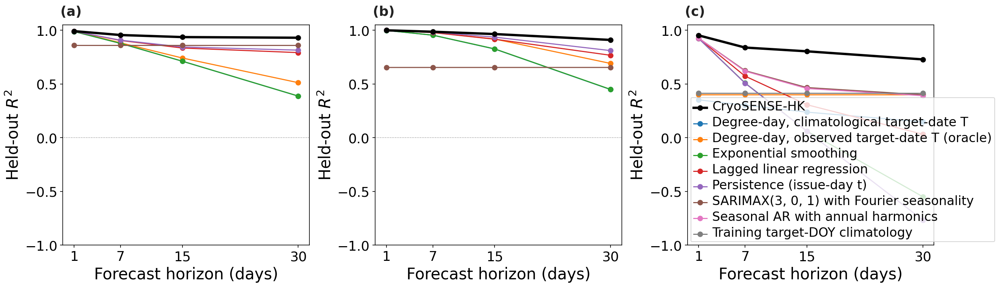

In [17]:
# 9c.1 Classical time-series and temperature-index baselines on the held-out period
from statsmodels.tsa.statespace.sarimax import SARIMAX

TARGET_LAGS = [0, 1, 2, 3, 5, 7, 14, 30]
DEGREE_DAY_BASE_GRID = np.arange(-15.0, 12.01, 0.5)


def _lag_design(frame, base_series, lags, n_harmonics):
    """Predictors known at the issue date: lagged target values, plus harmonics of the
    target day-of-year (the calendar position of the target date is always known)."""
    cols = {f"lag{lag}": base_series.shift(lag).reindex(frame.index).values for lag in lags}
    if n_harmonics:
        doy = frame["target_doy"].to_numpy(dtype=float)
        for k in range(1, n_harmonics + 1):
            cols[f"sin{k}"] = np.sin(2 * np.pi * k * doy / 365.25)
            cols[f"cos{k}"] = np.cos(2 * np.pi * k * doy / 365.25)
    return pd.DataFrame(cols, index=frame.index)


def linear_lag_baseline(fit_df, test_df, base_series, ycol, n_harmonics):
    x_fit = _lag_design(fit_df, base_series, TARGET_LAGS, n_harmonics)
    x_test = _lag_design(test_df, base_series, TARGET_LAGS, n_harmonics)
    ok = x_fit.notna().all(axis=1)
    model = LinearRegression().fit(x_fit[ok], fit_df.loc[ok, ycol])
    return model.predict(x_test.fillna(x_fit[ok].mean()))


def ses_level(series, alpha):
    """Simple exponential smoothing. The forecast function is flat, so the h-step-ahead
    forecast issued at t equals the smoothed level at t for every h."""
    return series.ewm(alpha=alpha, adjust=False).mean()


def tune_ses_alpha(base_series, valid_df, ycol):
    grid = np.arange(0.05, 1.0, 0.05)
    errors = [np.sqrt(mean_squared_error(valid_df[ycol],
                                         ses_level(base_series, a).reindex(valid_df.index)))
              for a in grid]
    return float(grid[int(np.argmin(errors))])


def sarimax_hstep(res_full, horizon):
    """Iterated h-step-ahead forecasts at every origin under fixed parameters.

    With a_{t+1|t} the predicted state, T the transition matrix, c the state intercept
    and Z the design matrix,
        a_{t+h|t} = T^{h-1} a_{t+1|t} + sum_{j=0}^{h-2} T^j c
        y_{t+h|t} = Z a_{t+h|t} + obs_intercept_{t+h}.
    Evaluating this once over the filtered path reproduces res.forecast() to machine
    precision while avoiding a refit at every issue date.
    """
    ssm = res_full.filter_results
    transition = np.asarray(ssm.transition)[:, :, 0]
    design = np.asarray(ssm.design)[:, :, 0]
    state_intercept = np.asarray(ssm.state_intercept)[:, 0]
    obs_intercept = np.asarray(ssm.obs_intercept)
    predicted = np.asarray(res_full.predicted_state)
    n_obs = predicted.shape[1] - 1

    drift = np.zeros_like(state_intercept)
    accumulator = np.eye(transition.shape[0])
    for _ in range(horizon - 1):
        drift = drift + accumulator @ state_intercept
        accumulator = accumulator @ transition

    propagated = np.linalg.matrix_power(transition, horizon - 1) @ predicted[:, 1:n_obs + 1]
    core = (design @ (propagated + drift[:, None])).ravel()
    out = np.full(n_obs, np.nan)
    out[:-horizon] = core[:-horizon] + (obs_intercept[0, horizon:] if obs_intercept.shape[1] > 1
                                        else obs_intercept[0, 0])
    return pd.Series(out, index=res_full.data.row_labels[:n_obs])


def fit_sarimax(series, fit_end, order=(3, 0, 1)):
    """Fit on the training and validation period, then apply the fixed parameters to the
    whole record. Stationarity is enforced because an iterated forecast propagates the
    state through T^(h-1): a non-stationary autoregressive root grows without bound
    instead of producing a usable baseline. Snow cover is the case that needs this, its
    unconstrained fit fails to converge and reaches a spectral radius above 1e10."""
    doy = series.index.dayofyear.to_numpy(dtype=float)
    exog = pd.DataFrame({f"{fn}{k}": func(2 * np.pi * k * doy / 365.25)
                         for k in (1, 2) for fn, func in (("s", np.sin), ("c", np.cos))},
                        index=series.index)
    fitted = SARIMAX(series.loc[:fit_end], exog=exog.loc[:fit_end], order=order, trend="c",
                     enforce_stationarity=True, enforce_invertibility=True
                     ).fit(disp=False, maxiter=200)
    applied = fitted.apply(series, exog=exog, refit=False)
    radius = float(np.max(np.abs(np.linalg.eigvals(
        np.asarray(applied.filter_results.transition)[:, :, 0]))))
    if not fitted.mle_retvals["converged"] or radius >= 1.0:
        raise RuntimeError(f"SARIMAX baseline unusable: converged="
                           f"{fitted.mle_retvals['converged']}, spectral radius {radius:.4g}")
    return applied, fitted


def degree_day_melt(y_fit, temps_fit, snow_fit, temps_test, snow_test):
    """Temperature-index melt, melt = DDF * max(T - T_base, 0), evaluated only where snow
    is available. T_base is grid-searched and DDF solved in closed form, both on the
    fitting period. The snow gate matters: without it the calibration is degenerate, the
    optimum runs to the edge of any T_base grid and the model scores below the sample
    mean, because melt is zero on snow-free days whatever the temperature."""
    best = None
    for t_base in DEGREE_DAY_BASE_GRID:
        pdd = np.maximum(temps_fit - t_base, 0.0) * snow_fit
        denom = float(pdd @ pdd)
        if denom <= 0:
            continue
        ddf = float(pdd @ y_fit) / denom
        rmse = float(np.sqrt(np.mean((ddf * pdd - y_fit) ** 2)))
        if best is None or rmse < best[2]:
            best = (float(t_base), ddf, rmse)
    t_base, ddf, _ = best
    if t_base in (DEGREE_DAY_BASE_GRID[0], DEGREE_DAY_BASE_GRID[-1]):
        raise RuntimeError(f"degree-day base temperature hit the grid edge at {t_base} C")
    prediction = ddf * np.maximum(temps_test - t_base, 0.0) * snow_test
    return prediction, t_base, ddf


# Temperature climatology of the target date: the only temperature information an
# operational degree-day forecast could use at the issue date.
_t2m_climatology = daily.groupby(daily.index.dayofyear)["t2m_C"].mean()

baseline_rows, baseline_pred_store = [], {}
for horizon in FORECAST_HORIZONS:
    train_h = forecast_frames[horizon]["train"]
    valid_h = forecast_frames[horizon]["valid"]
    test_h = forecast_frames[horizon]["test"]
    fit_h = pd.concat([train_h, valid_h])
    for target in targets:
        ycol = target_col(target, horizon)
        base_series = model_df[target]

        alpha = tune_ses_alpha(base_series, valid_h, ycol)
        res_full, res_fit = fit_sarimax(base_series.asfreq("D"), "2014-12-31")
        sarimax_path = sarimax_hstep(res_full, horizon).reindex(test_h.index)

        classical = {
            "Lagged linear regression":
                (linear_lag_baseline(fit_h, test_h, base_series, ycol, 0),
                 f"lags {TARGET_LAGS}"),
            "Seasonal AR with annual harmonics":
                (linear_lag_baseline(fit_h, test_h, base_series, ycol, 2),
                 f"lags {TARGET_LAGS}, 2 harmonics"),
            "Exponential smoothing":
                (ses_level(base_series, alpha).reindex(test_h.index).to_numpy(),
                 f"alpha={alpha:.2f}"),
            f"SARIMAX{res_fit.model.order} with Fourier seasonality":
                (sarimax_path.to_numpy(), "2 Fourier pairs, iterated"),
        }
        if target == "smlt_mm":
            y_fit = fit_h[ycol].to_numpy()
            t_fit = fit_h["target_date"].map(daily["t2m_C"]).to_numpy()
            t_clim = test_h["target_doy"].map(_t2m_climatology).to_numpy()
            t_true = test_h["target_date"].map(daily["t2m_C"]).to_numpy()
            # Operational: snow cover known at the issue date, temperature climatology of
            # the target date. Oracle: target-date snow cover and temperature both given.
            gate_fit_issue = (fit_h["snowc"].to_numpy() > 0).astype(float)
            gate_test_issue = (test_h["snowc"].to_numpy() > 0).astype(float)
            gate_fit_target = (fit_h["target_date"].map(daily["snowc"]).to_numpy() > 0).astype(float)
            gate_test_target = (test_h["target_date"].map(daily["snowc"]).to_numpy() > 0).astype(float)

            operational, tb_op, ddf_op = degree_day_melt(y_fit, t_fit, gate_fit_issue,
                                                         t_clim, gate_test_issue)
            oracle, tb_or, ddf_or = degree_day_melt(y_fit, t_fit, gate_fit_target,
                                                    t_true, gate_test_target)
            classical["Degree-day, climatological target-date T"] = (
                operational, f"Tb={tb_op:.1f} C, DDF={ddf_op:.2f} mm/C/day, issue-day snow gate")
            classical["Degree-day, observed target-date T (oracle)"] = (
                oracle, f"Tb={tb_or:.1f} C, DDF={ddf_or:.2f} mm/C/day, target-day snow gate")

        for method, (prediction, configuration) in classical.items():
            prediction = np.asarray(prediction, dtype=float)
            valid_mask = np.isfinite(prediction)
            if not valid_mask.any():
                raise RuntimeError(f"{method} produced no finite forecast at "
                                   f"horizon {horizon} for {target}")
            metrics = regression_metrics(test_h.loc[valid_mask, ycol], prediction[valid_mask])
            baseline_rows.append({"horizon_days": horizon, "target": target, "target_col": ycol,
                                  "method": method, "configuration": configuration,
                                  "n_evaluated": int(valid_mask.sum()), **metrics})
            baseline_pred_store[(target, horizon, method)] = pd.Series(prediction,
                                                                       index=test_h.index)

classical_baselines = pd.DataFrame(baseline_rows)
classical_baselines.to_csv(TABLE_DIR / "table_16e_classical_baselines.csv", index=False)

# Assemble the full comparison: framework, minimal baselines, classical baselines. The
# framework algorithm is selected per horizon, so it is carried in its own column and the
# method label stays constant across horizons.
_framework = final_results[["horizon_days", "target", "method",
                            "RMSE", "MAE", "R2", "NSE", "KGE"]].copy()
_is_framework = _framework["method"].str.startswith("CryoSENSE-HK")
_framework["family"] = np.where(_is_framework, "CryoSENSE-HK", "Minimal baseline")
_framework["configuration"] = np.where(
    _is_framework, _framework["method"].str.extract(r"\((.*)\)", expand=False), "")
_framework["method"] = np.where(_is_framework, "CryoSENSE-HK", _framework["method"])
_classical = classical_baselines[["horizon_days", "target", "method", "configuration",
                                  "RMSE", "MAE", "R2", "NSE", "KGE"]].copy()
_classical["family"] = "Classical baseline"
baseline_comparison = pd.concat([_framework, _classical], ignore_index=True)
baseline_comparison.to_csv(TABLE_DIR / "table_16f_full_baseline_comparison.csv", index=False)

display(Markdown("**Held-out R-squared: framework against every baseline**"))
display(baseline_comparison.pivot_table(index=["target", "method"], columns="horizon_days",
                                        values="R2").round(4))

fig, axes = plt.subplots(1, 3, figsize=(18, 5.2))
for ax, target in zip(axes, targets):
    one = baseline_comparison[baseline_comparison.target == target]
    for method, grp in one.groupby("method"):
        is_framework = method == "CryoSENSE-HK"
        grp = grp.sort_values("horizon_days")
        ax.plot(grp["horizon_days"], grp["R2"], marker="o",
                linewidth=3.0 if is_framework else 1.4,
                color="black" if is_framework else None,
                zorder=5 if is_framework else 2, label=method)
    ax.set(xlabel="Forecast horizon (days)", ylabel="Held-out $R^2$")
    ax.set_xticks(FORECAST_HORIZONS)
    ax.set_ylim(-1.0, 1.05)
    ax.axhline(0.0, color="grey", linewidth=0.8, linestyle=":")
axes[2].legend(fontsize=8.5, loc="lower left", ncol=1)
polish_manuscript_figure(fig)
# Panels carry letters only; the variable each one shows is named in the running text.
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_08c_classical_baseline_comparison.png", bbox_inches="tight")
plt.show()


## 9d. Block bootstrap uncertainty under temporal dependence

Daily snow states are strongly autocorrelated, so an i.i.d. bootstrap resamples days as if
they were independent and understates the sampling variability of held-out scores.
Confidence intervals and paired skill tests are therefore recomputed with a moving-block
bootstrap, which resamples contiguous blocks and preserves short-range dependence.

The block length is not chosen by hand. For each target and horizon it is derived from the
integrated autocorrelation time of the framework's own held-out residuals, using the
initial-positive-sequence rule, and the resulting length in days is reported alongside
every interval.

The number of resampling draws is set against the threshold the resulting p-values are
judged by. A paired bootstrap with B draws cannot distinguish any p-value below 2/B from
zero, so reporting a Bonferroni-corrected decision at a threshold finer than that
resolution would be reading structure into the resampling noise. The paired tests
therefore use ten thousand draws, which resolves p-values an order of magnitude below the
Bonferroni level for the comparisons made here, and the intervals use two thousand.


In [18]:
# 9d.1 Moving-block bootstrap: confidence intervals and paired skill tests
import itertools

# Draw counts are set so the resolution of the resampling distribution is finer than the
# multiple-comparison threshold it is judged against: with B paired draws no p-value
# below 2/B is distinguishable from zero, and 2/10000 sits below the Bonferroni level for
# the 80 comparisons made here. Seeds are assigned from a running counter, so a method can
# be renamed without moving any number in the table.
CI_DRAWS, PAIRED_DRAWS = 2000, 10000
_bootstrap_seed = itertools.count(SEED)


def integrated_autocorrelation_block(residual, max_lag=400):
    """Block length from the integrated autocorrelation time of a residual series.

    Autocorrelations are summed until the first non-positive value (initial positive
    sequence), giving tau = 1 + 2 * sum(rho_k); the block length is ceil(tau) in days.
    """
    values = np.asarray(residual, dtype=float)
    values = values - values.mean()
    denominator = float(values @ values)
    if denominator <= 0:
        return 1
    total = 0.0
    for lag in range(1, min(max_lag, len(values) - 1)):
        rho = float(values[:-lag] @ values[lag:]) / denominator
        if rho <= 0:
            break
        total += rho
    return max(1, int(np.ceil(1 + 2 * total)))


def moving_block_indices(n_obs, block_len, rng):
    n_blocks = int(np.ceil(n_obs / block_len))
    starts = rng.randint(0, n_obs - block_len + 1, n_blocks)
    return (starts[:, None] + np.arange(block_len)[None, :]).ravel()[:n_obs]


def _rmse_r2(truth, pred):
    residual = truth - pred
    rmse = np.sqrt(np.mean(residual ** 2))
    variance = np.mean((truth - truth.mean()) ** 2)
    return rmse, 1.0 - np.mean(residual ** 2) / variance if variance > 0 else np.nan


def block_bootstrap_ci(y, pred, block_len, n_boot=CI_DRAWS):
    y, pred = np.asarray(y, dtype=float), np.asarray(pred, dtype=float)
    rng = np.random.RandomState(next(_bootstrap_seed))
    draws = np.empty((n_boot, 2))
    for i in range(n_boot):
        idx = moving_block_indices(len(y), block_len, rng)
        draws[i] = _rmse_r2(y[idx], pred[idx])
    return {"RMSE_ci_low": float(np.quantile(draws[:, 0], 0.025)),
            "RMSE_ci_high": float(np.quantile(draws[:, 0], 0.975)),
            "R2_ci_low": float(np.quantile(draws[:, 1], 0.025)),
            "R2_ci_high": float(np.quantile(draws[:, 1], 0.975)),
            "block_len_days": block_len, "bootstrap_draws": n_boot}


def paired_rmse_block_bootstrap(y, model_pred, baseline_pred, block_len, n_boot=PAIRED_DRAWS):
    y, model_pred, baseline_pred = (np.asarray(a, dtype=float)
                                    for a in (y, model_pred, baseline_pred))

    def rmse(truth, pred):
        return np.sqrt(np.mean((truth - pred) ** 2))

    observed = rmse(y, model_pred) - rmse(y, baseline_pred)
    rng = np.random.RandomState(next(_bootstrap_seed))
    draws = np.empty(n_boot)
    for i in range(n_boot):
        idx = moving_block_indices(len(y), block_len, rng)
        draws[i] = rmse(y[idx], model_pred[idx]) - rmse(y[idx], baseline_pred[idx])
    p_two_sided = min(1.0, 2 * min(float(np.mean(draws <= 0)), float(np.mean(draws >= 0))))
    return {"delta_RMSE_model_minus_baseline": observed,
            "delta_RMSE_ci_low": float(np.quantile(draws, 0.025)),
            "delta_RMSE_ci_high": float(np.quantile(draws, 0.975)),
            "block_bootstrap_p_two_sided": p_two_sided,
            "p_resolution": 2.0 / n_boot,
            "block_len_days": block_len, "bootstrap_draws": n_boot}


block_ci_rows, block_test_rows, block_len_rows = [], [], []
for horizon in FORECAST_HORIZONS:
    test_h = forecast_frames[horizon]["test"]
    train_h = forecast_frames[horizon]["train"]
    for target in targets:
        ycol = target_col(target, horizon)
        observed = test_h[ycol].to_numpy()
        algorithm, model = fitted_models[(target, horizon)]
        model_pred = model.predict(test_h[selected_features[(target, horizon)]])

        block_len = integrated_autocorrelation_block(observed - model_pred)
        block_len_rows.append({"horizon_days": horizon, "target": target,
                               "block_len_days": block_len,
                               "n_test_days": len(observed),
                               "n_effective_blocks": int(np.ceil(len(observed) / block_len))})

        climatology = train_h.groupby("target_doy")[ycol].mean()
        candidates = {f"CryoSENSE-HK ({algorithm})": model_pred,
                      "Persistence (issue-day t)": test_h[target].to_numpy(),
                      "Training target-DOY climatology":
                          test_h["target_doy"].map(climatology).fillna(train_h[ycol].mean()).to_numpy()}
        for (bt, bh, method), series in baseline_pred_store.items():
            if bt == target and bh == horizon:
                candidates[method] = series.to_numpy()

        for method, prediction in candidates.items():
            mask = np.isfinite(prediction)
            block_ci_rows.append({"horizon_days": horizon, "target": target, "method": method,
                                  **regression_metrics(observed[mask], prediction[mask]),
                                  **block_bootstrap_ci(observed[mask], prediction[mask], block_len)})
            if method.startswith("CryoSENSE-HK"):
                continue
            block_test_rows.append({"horizon_days": horizon, "target": target, "baseline": method,
                                    **paired_rmse_block_bootstrap(observed[mask], model_pred[mask],
                                                                  prediction[mask], block_len)})

block_lengths = pd.DataFrame(block_len_rows)
block_bootstrap_ci_table = pd.DataFrame(block_ci_rows)
block_skill_tests = pd.DataFrame(block_test_rows)
block_lengths.to_csv(TABLE_DIR / "table_16g_block_lengths.csv", index=False)
block_bootstrap_ci_table.to_csv(TABLE_DIR / "table_16h_block_bootstrap_ci.csv", index=False)
block_skill_tests.to_csv(TABLE_DIR / "table_16i_block_bootstrap_skill_tests.csv", index=False)

display(Markdown("**Block length from the integrated autocorrelation of held-out residuals**"))
display(block_lengths.pivot(index="target", columns="horizon_days", values="block_len_days"))

# How much did ignoring temporal dependence understate the interval width?
_iid = final_results.set_index(["horizon_days", "target", "method"])
_block = block_bootstrap_ci_table.set_index(["horizon_days", "target", "method"])
_shared = _iid.index.intersection(_block.index)
width_comparison = pd.DataFrame({
    "iid_R2_ci_width": (_iid.loc[_shared, "R2_ci_high"] - _iid.loc[_shared, "R2_ci_low"]),
    "block_R2_ci_width": (_block.loc[_shared, "R2_ci_high"] - _block.loc[_shared, "R2_ci_low"]),
}).assign(inflation=lambda d: d["block_R2_ci_width"] / d["iid_R2_ci_width"])
width_comparison.to_csv(TABLE_DIR / "table_16j_ci_width_iid_vs_block.csv")
display(Markdown("**Interval width, i.i.d. against moving-block bootstrap**"))
display(width_comparison.round(4))
print(f"Widening of the held-out R2 interval: median {width_comparison['inflation'].median():.2f}x, "
      f"range {width_comparison['inflation'].min():.2f}x to {width_comparison['inflation'].max():.2f}x")

display(Markdown("**Paired skill tests under the moving-block bootstrap**"))
display(block_skill_tests.round(4))
_threshold = 0.05 / len(block_skill_tests)
_survivors = int((block_skill_tests["block_bootstrap_p_two_sided"] < _threshold).sum())
print(f"Bonferroni threshold at {len(block_skill_tests)} comparisons: {_threshold:.6f}; "
      f"resolution of the paired bootstrap: {2 / PAIRED_DRAWS:.6f}")
print(f"Comparisons where the framework is significantly better: {_survivors} of "
      f"{len(block_skill_tests)}")
display(block_skill_tests.loc[block_skill_tests["block_bootstrap_p_two_sided"] >= _threshold,
                              ["horizon_days", "target", "baseline",
                               "delta_RMSE_model_minus_baseline",
                               "block_bootstrap_p_two_sided"]].round(4))


**Block length from the integrated autocorrelation of held-out residuals**

horizon_days,1,7,15,30
target,,,,
sd,2,10,18,25
smlt_mm,2,5,10,10
snowc,2,7,11,11


**Interval width, i.i.d. against moving-block bootstrap**

iid_R2_ci_width  \
horizon_days target  method                                             
1            snowc   CryoSENSE-HK (Random Forest)              0.0056   
                     Persistence (issue-day t)                 0.0081   
                     Training target-DOY climatology           0.0306   
             sd      CryoSENSE-HK (Random Forest)              0.0001   
                     Persistence (issue-day t)                 0.0003   
                     Training target-DOY climatology           0.0574   
             smlt_mm CryoSENSE-HK (Extra Trees)                0.0156   
                     Persistence (issue-day t)                 0.0231   
                     Training target-DOY climatology           0.1167   
7            snowc   CryoSENSE-HK (Extra Trees)                0.0128   
                     Persistence (issue-day t)                 0.0384   
                     Training target-DOY climatology           0.0276   
             sd      CryoSENSE-HK (Extra Trees)                0.0022   
                     Persistence (issue-day t)                 0.0082   
                     Training target-DOY climatology           0.0572   
             smlt_mm CryoSENSE-HK (XGBoost)                    0.0377   
                     Persistence (issue-day t)                 0.1505   
                     Training target-DOY climatology           0.1338   
15           snowc   CryoSENSE-HK (Extra Trees)                0.0159   
                     Persistence (issue-day t)                 0.0598   
                     Training target-DOY climatology           0.0297   
             sd      CryoSENSE-HK (Extra Trees)                0.0059   
                     Persistence (issue-day t)                 0.0336   
                     Training target-DOY climatology           0.0622   
             smlt_mm CryoSENSE-HK (Extra Trees)                0.0475   
                     Persistence (issue-day t)                 0.2618   
                     Training target-DOY climatology           0.1120   
30           snowc   CryoSENSE-HK (Extra Trees)                0.0159   
                     Persistence (issue-day t)                 0.0948   
                     Training target-DOY climatology           0.0293   
             sd      CryoSENSE-HK (XGBoost)                    0.0178   
                     Persistence (issue-day t)                 0.1078   
                     Training target-DOY climatology           0.0623   
             smlt_mm CryoSENSE-HK (XGBoost)                    0.0718   
                     Persistence (issue-day t)                 0.3556   
                     Training target-DOY climatology           0.1284   

                                                      block_R2_ci_width  \
horizon_days target  method                                               
1            snowc   CryoSENSE-HK (Random Forest)                0.0058   
                     Persistence (issue-day t)                   0.0087   
                     Training target-DOY climatology             0.0396   
             sd      CryoSENSE-HK (Random Forest)                0.0002   
                     Persistence (issue-day t)                   0.0004   
                     Training target-DOY climatology             0.0830   
             smlt_mm CryoSENSE-HK (Extra Trees)                  0.0170   
                     Persistence (issue-day t)                   0.0279   
                     Training target-DOY climatology             0.1751   
7            snowc   CryoSENSE-HK (Extra Trees)                  0.0278   
                     Persistence (issue-day t)                   0.0762   
                     Training target-DOY climatology             0.0714   
             sd      CryoSENSE-HK (Extra Trees)                  0.0055   
                     Persistence (issue-day t)                   0.0248   
                     Training target-DOY climatology             0.1876   
    

Widening of the held-out R2 interval: median 2.57x, range 1.03x to 4.74x


**Paired skill tests under the moving-block bootstrap**

,horizon_days,target,baseline,delta_RMSE_model_minus_baseline,delta_RMSE_ci_low,delta_RMSE_ci_high,block_bootstrap_p_two_sided,p_resolution,block_len_days,bootstrap_draws
0,1,snowc,Persistence (issue-day t),-0.8690,-1.3943,-0.3152,0.0026,0.0002,2,10000
1,1,snowc,Training target-DOY climatology,-13.7190,-15.1987,-12.2629,0.0000,0.0002,2,10000
2,1,snowc,Lagged linear regression,-0.5374,-0.9984,-0.0360,0.0336,0.0002,2,10000
3,1,snowc,Seasonal AR with annual harmonics,-0.4523,-0.9064,0.0167,0.0584,0.0002,2,10000
4,1,snowc,Exponential smoothing,-0.9657,-1.5211,-0.3854,0.0006,0.0002,2,10000
...,...,...,...,...,...,...,...,...,...,...
75,30,smlt_mm,Seasonal AR with annual harmonics,-1.3135,-1.7168,-0.9568,0.0000,0.0002,10,10000
76,30,smlt_mm,Exponential smoothing,-3.6642,-4.2835,-3.0404,0.0000,0.0002,10,10000
77,30,smlt_mm,"SARIMAX(3, 0, 1) with Fourier seasonality",-1.2857,-1.6838,-0.9172,0.0000,0.0002,10,10000
78,30,smlt_mm,"Degree-day, climatological target-date T",-2.0375,-2.5668,-1.5040,0.0000,0.0002,10,10000


Bonferroni threshold at 80 comparisons: 0.000625; resolution of the paired bootstrap: 0.000200
Comparisons where the framework is significantly better: 76 of 80


,horizon_days,target,baseline,delta_RMSE_model_minus_baseline,block_bootstrap_p_two_sided
0,1,snowc,Persistence (issue-day t),-0.8690,0.0026
2,1,snowc,Lagged linear regression,-0.5374,0.0336
3,1,snowc,Seasonal AR with annual harmonics,-0.4523,0.0584
5,1,snowc,"SARIMAX(3, 0, 1) with Fourier seasonality",-0.4520,0.0602


## 9e. Spatial generalisation across the Hakkari domain

Everything above is fitted and evaluated at one ERA5-Land cell, which cannot by itself
support a statement about a region. The same framework is therefore taken to every cell of
the province.

The domain is defined by the provincial boundary rather than by the box the data were
downloaded in. Each candidate cell is kept when more than a quarter of its area falls
inside Hakkari, the count is reported across a range of thresholds so the choice can be
inspected, and the cells that touch the province but fall below the threshold are
identified. The retained cells span roughly seventeen hundred metres of relief, so the
domain is a genuine test of transfer rather than a set of near-duplicates of the study
cell.

Two questions are separated. Whether the design works elsewhere is answered by refitting
it independently at every cell and reading the spread of held-out skill. Whether the skill
depends on having seen the evaluation cell at all is answered by training on the other
eighty-one cells and predicting the withheld one, which is the leave-one-pixel-out test the
reviews asked for.


In [19]:
# 9e.1 Hakkari domain mask and multi-cell ERA5-Land extraction
from shapely.geometry import box

DOMAIN_CELL_DEG = 0.1
DOMAIN_OVERLAP_MIN = 0.25
EQUAL_AREA_CRS = 6933
SECONDS_PER_DAY = 86400.0
MULTICELL_PATH = DATA_DIR / "derived" / "hakkari_multicell_daily.parquet"
MASK_PATH = DATA_DIR / "derived" / "hakkari_domain_mask.gpkg"

# Archive of daily ERA5-Land fields for Türkiye, from which the study domain is cut.
# This archive is far too large to bundle with the code, so it is not part of the
# published repository. Set CRYO_ERA5_ARCHIVE to the directory holding one NetCDF
# per variable; data/README.md lists the files the two multi-cell analyses need.
_archive_root = os.environ.get("CRYO_ERA5_ARCHIVE")
if not _archive_root:
    raise RuntimeError(
        "CRYO_ERA5_ARCHIVE is not set; point it at the directory holding one "
        "NetCDF per variable of the country-wide daily ERA5-Land archive "
        "(see data/README.md)")
ERA5_ARCHIVE = Path(_archive_root)
if not ERA5_ARCHIVE.exists():
    raise FileNotFoundError(
        f"country-wide ERA5-Land archive not found at {ERA5_ARCHIVE}; "
        "check CRYO_ERA5_ARCHIVE (see data/README.md)")

# Column -> (archive variable, multiplicative factor, additive offset). Accumulated fields
# are divided by the length of the day, giving fluxes in W m-2 and depths in mm.
ARCHIVE_CONVERSIONS = {
    "t2m_C": ("t2m", 1.0, -273.15), "d2m_C": ("d2m", 1.0, -273.15),
    "tsn_C": ("tsn", 1.0, -273.15), "sp_hPa": ("sp", 1e-2, 0.0),
    "snowc": ("snowc", 1.0, 0.0), "sd": ("sd", 1.0, 0.0), "rsn": ("rsn", 1.0, 0.0),
    "sde_mm": ("sde", 1e3, 0.0), "tp_mm": ("tp", 1e3, 0.0), "e_mm": ("e", 1e3, 0.0),
    "sro_mm": ("sro", 1e3, 0.0), "ro_mm": ("ro", 1e3, 0.0), "ssro_mm": ("ssro", 1e3, 0.0),
    "smlt_mm": ("smlt", 1e3, 0.0), "sf_mm": ("sf", 1e3, 0.0),
    "ssr_W": ("ssr", 1 / SECONDS_PER_DAY, 0.0), "ssrd_W": ("ssrd", 1 / SECONDS_PER_DAY, 0.0),
    "str_W": ("str", 1 / SECONDS_PER_DAY, 0.0), "strd_W": ("strd", 1 / SECONDS_PER_DAY, 0.0),
    "slhf_W": ("slhf", 1 / SECONDS_PER_DAY, 0.0), "sshf_W": ("sshf", 1 / SECONDS_PER_DAY, 0.0),
}


def build_domain_mask():
    """Cells of the ERA5-Land grid that belong to Hakkari province.

    A download box is not a study area. Membership is decided by the fraction of each
    cell's area that falls inside the provincial boundary, and the sensitivity of the cell
    count to that threshold is reported so the choice can be checked rather than trusted.
    """
    provinces = gpd.read_file(DATA_DIR / "spatial" / "natural_earth_turkey_provinces.geojson")
    province = provinces.loc[provinces["name"] == "Hakkari"].to_crs(4326)
    glacier_union = gpd.read_file(DATA_DIR / "spatial" /
                                  "hakkari_glaciers_glims.gpkg").to_crs(4326).geometry.union_all()
    west, south, east, north = province.total_bounds

    with xr.open_dataset(ERA5_ARCHIVE / "snowc.nc") as reference:
        grid_lat = reference["latitude"].values
        grid_lon = reference["longitude"].values
    half = DOMAIN_CELL_DEG / 2
    lats = grid_lat[(grid_lat >= south - DOMAIN_CELL_DEG) & (grid_lat <= north + DOMAIN_CELL_DEG)]
    lons = grid_lon[(grid_lon >= west - DOMAIN_CELL_DEG) & (grid_lon <= east + DOMAIN_CELL_DEG)]
    footprint = [{"latitude": float(la), "longitude": float(lo),
                  "geometry": box(lo - half, la - half, lo + half, la + half)}
                 for la in lats for lo in lons]
    candidates = gpd.GeoDataFrame(footprint, crs=4326)

    projected = candidates.to_crs(EQUAL_AREA_CRS)
    province_geometry = province.to_crs(EQUAL_AREA_CRS).geometry.union_all()
    candidates["cell_area_km2"] = projected.geometry.area / 1e6
    candidates["overlap_km2"] = projected.geometry.intersection(province_geometry).area / 1e6
    candidates["overlap_fraction"] = candidates["overlap_km2"] / candidates["cell_area_km2"]
    candidates["has_glacier"] = candidates.geometry.intersects(glacier_union)
    province_km2 = province_geometry.area / 1e6

    sensitivity = pd.DataFrame([
        {"overlap_threshold": threshold,
         "n_cells": int((candidates["overlap_fraction"] > threshold).sum()),
         "province_km2_covered": float(
             candidates.loc[candidates["overlap_fraction"] > threshold, "overlap_km2"].sum()),
         "province_fraction_covered": float(
             candidates.loc[candidates["overlap_fraction"] > threshold, "overlap_km2"].sum()
             / province_km2)}
        for threshold in (0.0, 0.10, 0.25, 0.40, 0.50)])

    with xr.open_dataset(ERA5_ARCHIVE / "z.nc") as geopotential:
        elevation = (geopotential["z"].isel(time=0) / 9.80665).load()
    with xr.open_dataset(ERA5_ARCHIVE / "lsm.nc") as land:
        land_fraction = land["lsm"].isel(time=0).load()

    selected = candidates.loc[candidates["overlap_fraction"] > DOMAIN_OVERLAP_MIN].copy()
    selected = selected.sort_values(["latitude", "longitude"]).reset_index(drop=True)
    lat_index = xr.DataArray(selected["latitude"].to_numpy(), dims="cell")
    lon_index = xr.DataArray(selected["longitude"].to_numpy(), dims="cell")
    selected["elevation_m"] = elevation.sel(latitude=lat_index, longitude=lon_index,
                                            method="nearest").to_numpy()
    selected["land_fraction"] = land_fraction.sel(latitude=lat_index, longitude=lon_index,
                                                  method="nearest").to_numpy()
    selected["cell"] = np.arange(len(selected))
    excluded = candidates.loc[(candidates["overlap_fraction"] > 0)
                              & (candidates["overlap_fraction"] <= DOMAIN_OVERLAP_MIN)]
    return selected, sensitivity, excluded, province_km2, len(candidates)


def extract_multicell_table(mask):
    """Daily series for every masked cell, in the units of the single-cell table."""
    lat_index = xr.DataArray(mask["latitude"].to_numpy(), dims="cell")
    lon_index = xr.DataArray(mask["longitude"].to_numpy(), dims="cell")
    columns = {}
    for column, (variable, factor, offset) in ARCHIVE_CONVERSIONS.items():
        with xr.open_dataset(ERA5_ARCHIVE / f"{variable}.nc") as source:
            values = source[variable].sel(latitude=lat_index, longitude=lon_index,
                                          method="nearest").to_numpy()
        columns[column] = (values * factor + offset).astype("float32")
    # Wind speed from the daily mean components. The single-cell table averages hourly
    # wind speed, a different quantity; the column is carried only for completeness and
    # the feature ranking below is checked to confirm it is never selected.
    with xr.open_dataset(ERA5_ARCHIVE / "u10.nc") as source:
        eastward = source["u10"].sel(latitude=lat_index, longitude=lon_index,
                                     method="nearest").to_numpy()
    with xr.open_dataset(ERA5_ARCHIVE / "v10.nc") as source:
        northward = source["v10"].sel(latitude=lat_index, longitude=lon_index,
                                      method="nearest").to_numpy()
    columns["ws"] = np.hypot(eastward, northward).astype("float32")

    with xr.open_dataset(ERA5_ARCHIVE / "snowc.nc") as reference:
        times = pd.to_datetime(reference["time"].values).normalize()
    index = pd.MultiIndex.from_product([times, mask["cell"].to_numpy()], names=["time", "cell"])
    table = pd.DataFrame({name: values.reshape(-1) for name, values in columns.items()},
                         index=index).reset_index()
    # Coordinates travel with the values. Cell numbers are positions in a mask, and a mask
    # built in a different order would silently attach every series to the wrong place.
    positions = table["cell"].to_numpy()
    table["latitude"] = mask["latitude"].to_numpy()[positions]
    table["longitude"] = mask["longitude"].to_numpy()[positions]
    return table


def cache_matches_mask(table, mask):
    """True when the cached cell numbering names the same coordinates as the mask."""
    if not {"latitude", "longitude"}.issubset(table.columns):
        return False
    cached = (table.groupby("cell")[["latitude", "longitude"]].first()
              .reindex(mask["cell"].to_numpy()))
    if cached.isna().any().any():
        return False
    return bool(np.allclose(cached["latitude"], mask["latitude"])
                and np.allclose(cached["longitude"], mask["longitude"]))


MULTICELL_PATH.parent.mkdir(parents=True, exist_ok=True)
domain_mask, mask_sensitivity, mask_excluded, province_km2, n_candidates = build_domain_mask()
domain_mask.to_file(MASK_PATH, driver="GPKG")
domain_mask.drop(columns="geometry").to_csv(TABLE_DIR / "table_16k_domain_mask.csv", index=False)
mask_sensitivity.to_csv(TABLE_DIR / "table_16l_mask_threshold_sensitivity.csv", index=False)

print(f"Download box holds {n_candidates} cells; {len(domain_mask)} of them are Hakkari at the "
      f">{DOMAIN_OVERLAP_MIN:.0%} area-overlap criterion, so "
      f"{n_candidates - len(domain_mask)} ({1 - len(domain_mask) / n_candidates:.0%}) of the box "
      f"lies outside the province and is discarded.")
print(f"Retained cells cover {domain_mask['overlap_km2'].sum():.0f} km2 of the "
      f"{province_km2:.0f} km2 province "
      f"({domain_mask['overlap_km2'].sum() / province_km2:.1%}). The "
      f"{len(mask_excluded)} cells that touch the province but fall below the threshold hold "
      f"{mask_excluded['overlap_km2'].sum():.0f} km2 "
      f"({mask_excluded['overlap_km2'].sum() / province_km2:.1%}); they are boundary slivers, "
      f"and none of them contains a glacier.")
print(f"Elevation of retained cells: {domain_mask['elevation_m'].min():.0f} to "
      f"{domain_mask['elevation_m'].max():.0f} m, median "
      f"{domain_mask['elevation_m'].median():.0f} m. Minimum land fraction "
      f"{domain_mask['land_fraction'].min():.3f}, so no cell is contaminated by water.")
display(Markdown("**Sensitivity of the domain to the area-overlap threshold**"))
display(mask_sensitivity.assign(
    province_fraction_covered=lambda d: d["province_fraction_covered"].map("{:.1%}".format)))

multicell = pd.read_parquet(MULTICELL_PATH) if MULTICELL_PATH.exists() else None
if multicell is not None and cache_matches_mask(multicell, domain_mask):
    print(f"Loaded cached multi-cell table from {MULTICELL_PATH.name}; its cell numbering "
          f"matches the mask.")
else:
    if multicell is not None:
        print(f"Cached {MULTICELL_PATH.name} does not match the current mask; rebuilding.")
    multicell = extract_multicell_table(domain_mask)
    multicell.to_parquet(MULTICELL_PATH, index=False)
    print(f"Extracted and cached multi-cell table to {MULTICELL_PATH.name}.")
assert cache_matches_mask(multicell, domain_mask), "multi-cell table is misaligned with the mask"
print(f"Multi-cell table: {multicell.shape[0]:,} rows over {multicell['cell'].nunique()} cells "
      f"and {multicell['time'].nunique():,} days.")

# The study cell must reappear in the domain, and its archive-derived series must match the
# single-cell table used everywhere else. State variables and fluxes agree to rounding
# (correlation above 0.99999). Precipitation differs slightly because the two extractions
# close the daily accumulation window at a different hour, which is why the single-cell
# analysis is not silently switched over. Wind is the one variable that genuinely differs:
# the archive stores daily-mean components, so the value below is the magnitude of the mean
# vector, whereas the single-cell table holds the mean of the instantaneous speeds. Vector
# averaging cancels direction reversals, which is why the correlation falls to about 0.63.
# Nothing reported depends on it: wind ranks 26th to 34th of 34 candidates in every one of
# the 246 per-cell selections and enters none of the final feature sets.
STUDY_LAT, STUDY_LON = 37.5, 44.0
study_cell = int(domain_mask.loc[np.isclose(domain_mask["latitude"], STUDY_LAT)
                                 & np.isclose(domain_mask["longitude"], STUDY_LON), "cell"].iloc[0])
study_series = multicell.loc[multicell["cell"] == study_cell].set_index("time").sort_index()
agreement = pd.DataFrame([
    {"variable": column,
     "max_abs_difference": float((study_series[column] - daily[column]).abs().max()),
     "rms_difference": float(np.sqrt(((study_series[column] - daily[column]) ** 2).mean())),
     "correlation": float(study_series[column].corr(daily[column]))}
    for column in ["t2m_C", "snowc", "sd", "smlt_mm", "sde_mm", "ssrd_W", "sshf_W",
                   "tp_mm", "sf_mm", "ws"]])
agreement.to_csv(TABLE_DIR / "table_16m_study_cell_extraction_agreement.csv", index=False)
display(Markdown("**Archive extraction against the single-cell table, at the study cell**"))
display(agreement.round(5))
print(f"The study cell is cell {study_cell}, elevation "
      f"{domain_mask.loc[study_cell, 'elevation_m']:.0f} m, and it is the only cell in the "
      f"domain that contains mapped glacier ice.")


Download box holds 204 cells; 82 of them are Hakkari at the >25% area-overlap criterion, so 122 (60%) of the box lies outside the province and is discarded.
Retained cells cover 7192 km2 of the 7469 km2 province (96.3%). The 23 cells that touch the province but fall below the threshold hold 278 km2 (3.7%); they are boundary slivers, and none of them contains a glacier.
Elevation of retained cells: 995 to 2734 m, median 2155 m. Minimum land fraction 1.000, so no cell is contaminated by water.


**Sensitivity of the domain to the area-overlap threshold**

,overlap_threshold,n_cells,province_km2_covered,province_fraction_covered
0,0.00,105,7469.401110,100.0%
1,0.10,96,7446.918237,99.7%
2,0.25,82,7191.792183,96.3%
3,0.40,79,7088.276225,94.9%
4,0.50,75,6914.303813,92.6%


Loaded cached multi-cell table from hakkari_multicell_daily.parquet; its cell numbering matches the mask.
Multi-cell table: 2,276,238 rows over 82 cells and 27,759 days.


**Archive extraction against the single-cell table, at the study cell**

,variable,max_abs_difference,rms_difference,correlation
0,t2m_C,0.38932,0.00589,1.00000
1,snowc,0.00398,0.00002,1.00000
2,sd,0.00048,0.00000,1.00000
3,smlt_mm,0.34435,0.00764,1.00000
4,sde_mm,16.29273,0.09833,1.00000
5,ssrd_W,0.00007,0.00001,1.00000
6,sshf_W,1.48389,0.13619,0.99999
7,tp_mm,7.79201,0.41717,0.99885
8,sf_mm,7.07490,0.35966,0.99889
9,ws,1.51276,0.55805,0.62746


The study cell is cell 45, elevation 2513 m, and it is the only cell in the domain that contains mapped glacier ice.


Loaded cached fitting results; delete the two tables to recompute.


**Held-out R-squared across the domain: the published design refitted locally**

min    25%    50%    75%    max
target  horizon_days                                   
sd      1             0.992  0.999  0.999  0.999  0.999
        7             0.743  0.971  0.978  0.984  0.987
        15            0.314  0.925  0.940  0.957  0.969
        30           -0.216  0.850  0.875  0.895  0.923
smlt_mm 1             0.895  0.923  0.935  0.943  0.955
        7             0.557  0.751  0.780  0.809  0.836
        15            0.325  0.697  0.736  0.792  0.820
        30            0.194  0.598  0.654  0.709  0.771
snowc   1             0.970  0.988  0.990  0.991  0.993
        7             0.652  0.895  0.915  0.927  0.957
        15            0.468  0.864  0.894  0.914  0.940
        30            0.365  0.825  0.855  0.895  0.936

**Held-out R-squared across the domain: leave-one-pixel-out transfer**

min    25%    50%    75%    max
target  horizon_days                                   
sd      1             0.987  0.999  0.999  0.999  0.999
        7             0.557  0.973  0.979  0.986  0.988
        15           -0.735  0.925  0.942  0.962  0.969
        30           -4.865  0.819  0.856  0.905  0.928
smlt_mm 1             0.834  0.915  0.930  0.937  0.949
        7             0.162  0.729  0.768  0.805  0.855
        15           -0.060  0.650  0.718  0.779  0.853
        30           -0.167  0.529  0.623  0.719  0.820
snowc   1             0.968  0.988  0.990  0.991  0.993
        7             0.304  0.897  0.915  0.933  0.956
        15            0.105  0.863  0.898  0.918  0.944
        30           -0.449  0.818  0.860  0.902  0.935

**Skill lost when the evaluation cell is withheld from training**

R2_transfer_loss         R2_learner_gap        
                               median     max         median     max
target  horizon_days                                                
sd      1                      0.0000  0.0030         0.0002  0.0020
        7                     -0.0006  0.1844        -0.0009  0.0011
        15                     0.0016  1.0371        -0.0044  0.0124
        30                     0.0048  4.6486         0.0000  0.0000
smlt_mm 1                      0.0042  0.0702         0.0032  0.0094
        7                     -0.0046  0.3951         0.0000  0.0000
        15                     0.0021  0.4191         0.0039  0.0381
        30                    -0.0011  0.3860         0.0000  0.0000
snowc   1                     -0.0005  0.0025         0.0006  0.0015
        7                     -0.0006  0.3462        -0.0011  0.0068
        15                    -0.0042  0.3550         0.0015  0.0086
        30                    -0.0012  0.8219         0.0008  0.0071

snowc    h= 1: study cell 0.992, domain median 0.990, rank 6 of 82; transferred median 0.990, worst 0.968
snowc    h= 7: study cell 0.956, domain median 0.915, rank 2 of 82; transferred median 0.915, worst 0.304
snowc    h=15: study cell 0.939, domain median 0.894, rank 2 of 82; transferred median 0.898, worst 0.105
snowc    h=30: study cell 0.931, domain median 0.855, rank 3 of 82; transferred median 0.860, worst -0.449
sd       h= 1: study cell 0.999, domain median 0.999, rank 9 of 82; transferred median 0.999, worst 0.987
sd       h= 7: study cell 0.986, domain median 0.978, rank 9 of 82; transferred median 0.979, worst 0.557
sd       h=15: study cell 0.963, domain median 0.940, rank 10 of 82; transferred median 0.942, worst -0.735
sd       h=30: study cell 0.909, domain median 0.875, rank 10 of 82; transferred median 0.856, worst -4.865
smlt_mm  h= 1: study cell 0.951, domain median 0.935, rank 3 of 82; transferred median 0.930, worst 0.834
smlt_mm  h= 7: study cell 0.828, domain m

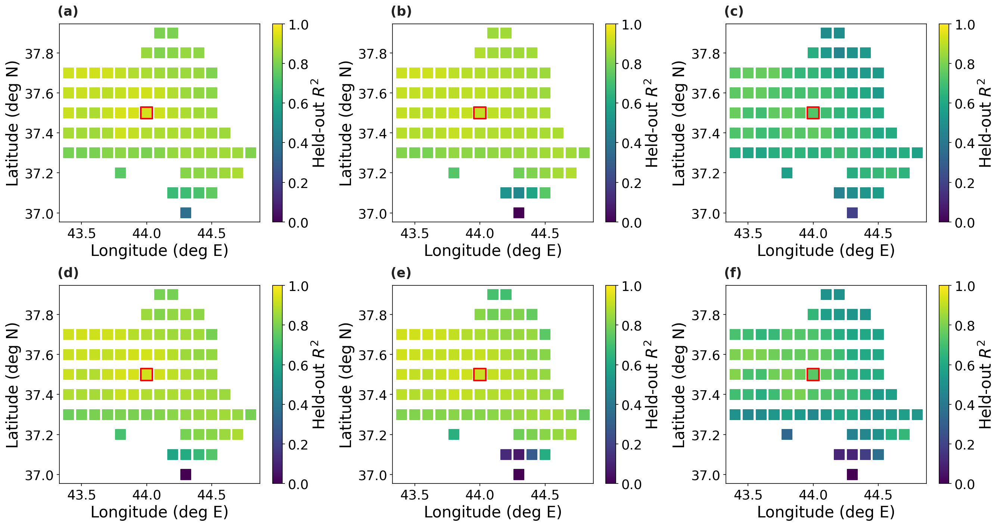

In [20]:
# 9e.2 Local refit and leave-one-pixel-out transfer across the 82-cell domain
# The transfer test pools 81 cells, so its training set is eighty times the single-cell
# one. Fitting the per-horizon selected algorithm on that would take hours for the extremely
# randomised forests, so every pooled fit uses the gradient-boosted learner, which handles
# the volume. To keep the comparison honest the local refit is run twice, once with the
# algorithm selected in Section 9.1 and once with the gradient-boosted learner, and the
# skill lost to withholding a cell is measured between the two gradient-boosted fits alone.
TRANSFER_ALGORITHM = "XGBoost"
SPATIAL_CACHE = {
    "local": TABLE_DIR / "table_16n_per_cell_local_skill.csv",
    "transfer": TABLE_DIR / "table_16o_leave_one_pixel_out.csv",
}
RANKING_CACHE = TABLE_DIR / "table_16p_per_cell_feature_ranking.csv"
# The design selects from the proposed set, so every sensitivity check below
# ranks candidates from that same pool rather than from the full state.
SELECTION_POOL = feature_sets["B_atmosphere_snowfall_memory"]


def build_cell_forecast_frame(cell_frame, horizon):
    """Reproduce the single-cell feature and target construction of Section 7.1."""
    frame = cell_frame.set_index("time").sort_index()
    day = frame.index.dayofyear
    frame["doy_sin"] = np.sin(2 * np.pi * day / 365.25)
    frame["doy_cos"] = np.cos(2 * np.pi * day / 365.25)
    frame["net_radiation_W"] = frame["ssr_W"] + frame["str_W"]
    for column in ["t2m_C", "tp_mm", "sf_mm", "snowc", "sd", "smlt_mm"]:
        for lag in [1, 3, 7]:
            frame[f"{column}_lag{lag}"] = frame[column].shift(lag)
    for column in ["snowc", "sd"]:
        frame[f"{column}_lag0"] = frame[column]
    frame["target_date"] = frame.index + pd.to_timedelta(horizon, unit="D")
    frame["target_doy"] = frame["target_date"].dt.dayofyear
    for target in targets:
        frame[target_col(target, horizon)] = frame[target].shift(-horizon)
    required = sorted(set(sum(feature_sets.values(), [])
                          + [target_col(t, horizon) for t in targets]))
    return frame.dropna(subset=required + ["target_date", "target_doy"])


def pooled_domain_frame(horizon):
    """All masked cells stacked, each contributing the rows it would contribute alone."""
    pieces = []
    for cell_id, group in multicell.groupby("cell", sort=True):
        built = build_cell_forecast_frame(group.drop(columns="cell").copy(), horizon)
        built["cell"] = cell_id
        pieces.append(built)
    return pd.concat(pieces)


def spatial_cache_is_complete():
    """A cache is only usable when it covers every cell, horizon and target of the run.

    Existence is not enough. A partial table written by a reduced trial has the same name
    as a full one, and loading it silently drops most of the experiment.
    """
    if not all(path.exists() for path in SPATIAL_CACHE.values()):
        return False, None
    tables = {name: pd.read_csv(path) for name, path in SPATIAL_CACHE.items()}
    expected_cells = set(domain_mask["cell"].astype(int))
    expected_rows = len(expected_cells) * len(FORECAST_HORIZONS) * len(targets)
    for name in ("local", "transfer"):
        frame = tables[name]
        if (set(frame["cell"].astype(int)) != expected_cells
                or set(frame["horizon_days"]) != set(FORECAST_HORIZONS)
                or set(frame["target"]) != set(targets)
                or len(frame) != expected_rows):
            return False, name
    return True, tables


_cache_ok, _cache_payload = spatial_cache_is_complete()
if _cache_ok:
    per_cell_local = _cache_payload["local"]
    leave_one_pixel_out = _cache_payload["transfer"]
    print("Loaded cached fitting results; delete the two tables to recompute.")
else:
    if _cache_payload is not None:
        print(f"Cached spatial results are incomplete ({_cache_payload} table); recomputing.")
    local_rows, transfer_rows, ranking_rows = [], [], []
    for horizon in FORECAST_HORIZONS:
        pooled = pooled_domain_frame(horizon)
        train_mask = pooled["target_date"] <= pd.Timestamp("2002-12-31")
        test_mask = pooled["target_date"] >= pd.Timestamp("2015-01-01")
        for target in targets:
            ycol = target_col(target, horizon)
            algorithm = fitted_models[(target, horizon)][0]
            features = list(selected_features[(target, horizon)])
            for cell_id in domain_mask["cell"]:
                here = pooled["cell"] == cell_id
                local_train = pooled.loc[here & train_mask]
                local_test = pooled.loc[here & test_mask]
                truth = local_test[ycol]

                # The published design, refitted on this cell alone.
                selected_fit = decision_model(algorithm).fit(local_train[features],
                                                             local_train[ycol])
                # The same features under the transfer learner, as the local reference the
                # withheld-cell result is compared against.
                reference_fit = decision_model(TRANSFER_ALGORITHM).fit(local_train[features],
                                                                       local_train[ycol])
                local_rows.append({
                    "horizon_days": horizon, "target": target, "cell": int(cell_id),
                    "selected_algorithm": algorithm, "n_train": len(local_train),
                    "n_test": len(local_test),
                    **regression_metrics(truth, selected_fit.predict(local_test[features])),
                    "R2_reference_learner": r2_score(truth,
                                                     reference_fit.predict(local_test[features]))})

                # Trained on every other cell and applied here, so the evaluation cell
                # contributes nothing to the fit.
                elsewhere = pooled.loc[(~here) & train_mask]
                transfer_fit = decision_model(TRANSFER_ALGORITHM).fit(elsewhere[features],
                                                                      elsewhere[ycol])
                transfer_rows.append({
                    "horizon_days": horizon, "target": target, "cell": int(cell_id),
                    "algorithm": TRANSFER_ALGORITHM,
                    "n_train_cells": int(len(domain_mask) - 1), "n_train": len(elsewhere),
                    "n_test": len(local_test),
                    **regression_metrics(truth, transfer_fit.predict(local_test[features]))})

        del pooled
    per_cell_local = pd.DataFrame(local_rows)
    leave_one_pixel_out = pd.DataFrame(transfer_rows)
    per_cell_local.to_csv(SPATIAL_CACHE["local"], index=False)
    leave_one_pixel_out.to_csv(SPATIAL_CACHE["transfer"], index=False)

# Feature-ranking stability across the domain, at the longest horizon, cached on its own so
# that revisiting the ranking never forces the eighty-two-fold fitting experiment to rerun.
_ranking_expected = len(domain_mask) * len(targets)
if RANKING_CACHE.exists() and len(pd.read_csv(RANKING_CACHE)) == _ranking_expected:
    per_cell_ranking = pd.read_csv(RANKING_CACHE)
else:
    horizon = FORECAST_HORIZONS[-1]
    pooled = pooled_domain_frame(horizon)
    train_mask = pooled["target_date"] <= pd.Timestamp("2002-12-31")
    ranking_rows = []
    for target in targets:
        ycol = target_col(target, horizon)
        features = list(selected_features[(target, horizon)])
        for cell_id in domain_mask["cell"]:
            local_train = pooled.loc[(pooled["cell"] == cell_id) & train_mask]
            ranking = rank_features(local_train, SELECTION_POOL, ycol)
            ranking_rows.append({
                "target": target, "cell": int(cell_id), "top_k": len(features),
                "shared_with_study_cell":
                    len(set(ranking.index[:len(features)]) & set(features)),
                "ws_rank": int(ranking.index.get_loc("ws")) + 1,
                "top_feature": ranking.index[0]})
    per_cell_ranking = pd.DataFrame(ranking_rows)
    per_cell_ranking.to_csv(RANKING_CACHE, index=False)
    del pooled

display(Markdown("**Held-out R-squared across the domain: the published design refitted locally**"))
display(per_cell_local.groupby(["target", "horizon_days"])["R2"]
        .describe()[["min", "25%", "50%", "75%", "max"]].round(3))
display(Markdown("**Held-out R-squared across the domain: leave-one-pixel-out transfer**"))
display(leave_one_pixel_out.groupby(["target", "horizon_days"])["R2"]
        .describe()[["min", "25%", "50%", "75%", "max"]].round(3))

comparison = per_cell_local.merge(leave_one_pixel_out, on=["horizon_days", "target", "cell"],
                                  suffixes=("_local", "_transfer"))
comparison["R2_transfer_loss"] = comparison["R2_reference_learner"] - comparison["R2_transfer"]
comparison["R2_learner_gap"] = comparison["R2_local"] - comparison["R2_reference_learner"]
comparison.to_csv(TABLE_DIR / "table_16q_local_vs_transfer.csv", index=False)
display(Markdown("**Skill lost when the evaluation cell is withheld from training**"))
display(comparison.groupby(["target", "horizon_days"])[["R2_transfer_loss", "R2_learner_gap"]]
        .agg(["median", "max"]).round(4))

for target in targets:
    for horizon in FORECAST_HORIZONS:
        one = per_cell_local[(per_cell_local.target == target)
                             & (per_cell_local.horizon_days == horizon)]
        here = float(one.loc[one.cell == study_cell, "R2"].iloc[0])
        rank = int((one["R2"] > here).sum()) + 1
        transferred = leave_one_pixel_out[(leave_one_pixel_out.target == target)
                                          & (leave_one_pixel_out.horizon_days == horizon)]
        print(f"{target:<8} h={horizon:>2}: study cell {here:.3f}, domain median "
              f"{one['R2'].median():.3f}, rank {rank} of {len(one)}; transferred median "
              f"{transferred['R2'].median():.3f}, worst {transferred['R2'].min():.3f}")

print(f"\nFeature ranking across the domain at the {FORECAST_HORIZONS[-1]}-day horizon: a median "
      f"of {per_cell_ranking['shared_with_study_cell'].median():.0f} of the "
      f"{per_cell_ranking['top_k'].median():.0f} predictors chosen at the study cell are also "
      f"chosen locally.")
print(f"Wind speed ranks no higher than {per_cell_ranking['ws_rank'].min()} in any cell or "
      f"target, against a selection depth of {per_cell_ranking['top_k'].max()}, so it never "
      f"enters the design and the difference in wind aggregation between the two extractions "
      f"cannot affect any result.")

fig, axes = plt.subplots(2, 3, figsize=(18, 9.5))
longest = FORECAST_HORIZONS[-1]
for column, target in enumerate(targets):
    for row, frame in enumerate((per_cell_local, leave_one_pixel_out)):
        ax = axes[row, column]
        one = frame[(frame.target == target) & (frame.horizon_days == longest)]
        merged = domain_mask.merge(one, on="cell")
        scatter = ax.scatter(merged["longitude"], merged["latitude"], c=merged["R2"],
                             s=170, marker="s", cmap="viridis", vmin=0, vmax=1)
        ax.scatter(STUDY_LON, STUDY_LAT, s=230, marker="s", facecolors="none",
                   edgecolors="red", linewidths=2.0)
        ax.set(xlabel="Longitude (deg E)", ylabel="Latitude (deg N)")
        fig.colorbar(scatter, ax=ax, label="Held-out $R^2$")
polish_manuscript_figure(fig)
add_panel_letters(axes.ravel())
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_08d_spatial_generalisation.png", bbox_inches="tight")
plt.show()


## 9f. Sensitivity of the reported skill to design choices

Three choices could in principle be doing the work that is credited to the framework: the
hyperparameters of the decision layer, the neighbourhood size of the mutual-information
estimator that ranks predictors, and the particular years that happen to fall in the
held-out period.

Each is varied in turn. The decision layer is refitted over a full factorial grid of its
three most consequential hyperparameters, and the held-out skill of the published setting
is compared with that of the setting the validation period would have chosen. The
predictor ranking is recomputed across a range of neighbourhood sizes and the design is
refitted on each resulting subset. Held-out skill is then broken down by test year, read
from the stored predictions rather than refitted, so a single anomalous winter cannot hide
inside a period average.


**Held-out skill across the hyperparameter grid**

configurations  test_R2_min  test_R2_median  \
target  horizon_days                                                
sd      1                         27       0.9993          0.9994   
        7                         27       0.9843          0.9852   
        15                        27       0.9607          0.9634   
        30                        27       0.8990          0.9063   
smlt_mm 1                         27       0.9437          0.9502   
        7                         27       0.7968          0.8266   
        15                        27       0.7779          0.7916   
        30                        27       0.6911          0.7158   
snowc   1                         27       0.9920          0.9922   
        7                         27       0.9509          0.9561   
        15                        27       0.9326          0.9376   
        30                        27       0.9249          0.9302   

                      test_R2_max  test_R2_published  \
target  horizon_days                                   
sd      1                  0.9994             0.9994   
        7                  0.9862             0.9862   
        15                 0.9645             0.9636   
        30                 0.9106             0.9063   
smlt_mm 1                  0.9523             0.9512   
        7                  0.8322             0.8300   
        15                 0.7987             0.7928   
        30                 0.7315             0.7306   
snowc   1                  0.9924             0.9922   
        7                  0.9573             0.9561   
        15                 0.9397             0.9385   
        30                 0.9318             0.9317   

                      test_R2_best_on_validation  published_minus_best  
target  horizon_days                                                    
sd      1                                 0.9994                0.0000  
        7                                 0.9862                0.0000  
        15                                0.9642               -0.0006  
        30                                0.9070               -0.0007  
smlt_mm 1                                 0.9514               -0.0002  
        7                                 0.8300                0.0000  
        15                                0.7874                0.0054  
        30                                0.7140                0.0166  
snowc   1                                 0.9923               -0.0001  
        7                                 0.9554                0.0007  
        15                                0.9369                0.0016  
        30                                0.9318               -0.0002

Across 27 configurations per target and horizon, the worst held-out R-squared is 0.691 and the published setting sits within 0.0166 of the configuration that the validation period would have chosen.


**Feature ranking under different mutual-information neighbourhood sizes**

n_neighbors               3       5       7       10      15
target  horizon_days                                        
sd      1             0.9994  0.9994  0.9994  0.9994  0.9994
        7             0.9862  0.9858  0.9858  0.9862  0.9858
        15            0.9636  0.9636  0.9636  0.9638  0.9638
        30            0.9063  0.9063  0.9063  0.9064  0.9048
smlt_mm 1             0.9512  0.9513  0.9512  0.9514  0.9511
        7             0.8300  0.8327  0.8276  0.6176  0.6176
        15            0.7928  0.7933  0.7909  0.7909  0.7936
        30            0.7306  0.7302  0.7302  0.7293  0.7281
snowc   1             0.9922  0.9922  0.9923  0.9923  0.9923
        7             0.9561  0.9535  0.9535  0.9535  0.9537
        15            0.9385  0.9385  0.8986  0.8987  0.8987
        30            0.9317  0.9317  0.9317  0.9317  0.9317

Changing the neighbourhood size keeps a median of 10 of 10 selected predictors, with a median rank correlation of 0.998 against the default, and moves held-out R-squared by at most 0.2151.


**Held-out skill by test year**

test_year              2015   2016   2017   2018   2019   2020   2021   2022  \
target  horizon_days                                                           
sd      1             0.999  0.999  0.999  0.999  1.000  0.999  0.999  0.999   
        7             0.985  0.985  0.984  0.972  0.994  0.991  0.983  0.988   
        15            0.975  0.955  0.951  0.916  0.987  0.973  0.947  0.966   
        30            0.961  0.887  0.897  0.721  0.965  0.906  0.914  0.935   
smlt_mm 1             0.944  0.960  0.958  0.924  0.975  0.931  0.969  0.940   
        7             0.820  0.858  0.915  0.703  0.904  0.838  0.821  0.872   
        15            0.815  0.881  0.836  0.597  0.921  0.865  0.759  0.847   
        30            0.767  0.765  0.671  0.294  0.893  0.820  0.552  0.807   
snowc   1             0.989  0.989  0.997  0.985  0.988  0.991  0.996  0.994   
        7             0.944  0.953  0.967  0.938  0.938  0.962  0.958  0.976   
        15            0.957  0.949  0.946  0.944  0.936  0.975  0.929  0.956   
        30            0.942  0.926  0.919  0.929  0.945  0.954  0.865  0.966   

test_year              2023   2024   2025  
target  horizon_days                       
sd      1             0.998  0.999  0.997  
        7             0.932  0.988  0.923  
        15            0.850  0.969  0.809  
        30            0.625  0.892  0.588  
smlt_mm 1             0.876  0.966  0.906  
        7             0.657  0.826  0.619  
        15            0.547  0.767  0.294  
        30            0.606  0.684  0.563  
snowc   1             0.994  0.991  0.994  
        7             0.969  0.975  0.930  
        15            0.906  0.940  0.860  
        30            0.920  0.934  0.929

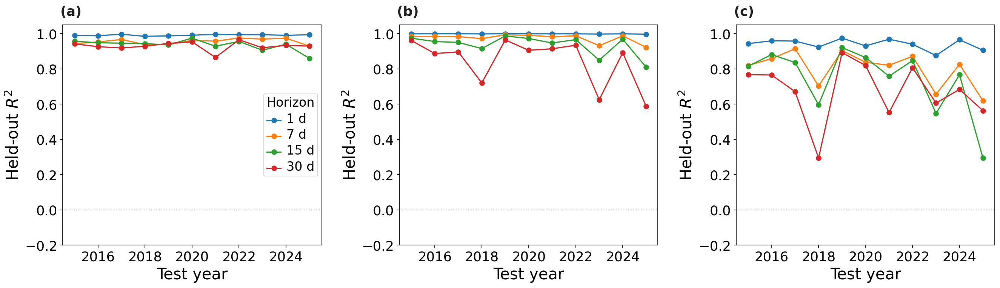

Weakest test year per target and horizon:
  sd       h= 1: 2025 with R2=0.997
  sd       h= 7: 2025 with R2=0.923
  sd       h=15: 2025 with R2=0.809
  sd       h=30: 2025 with R2=0.588
  smlt_mm  h= 1: 2023 with R2=0.876
  smlt_mm  h= 7: 2025 with R2=0.619
  smlt_mm  h=15: 2025 with R2=0.294
  smlt_mm  h=30: 2018 with R2=0.294
  snowc    h= 1: 2018 with R2=0.985
  snowc    h= 7: 2025 with R2=0.930
  snowc    h=15: 2025 with R2=0.860
  snowc    h=30: 2021 with R2=0.865


In [21]:
# 9f.1 Sensitivity of the reported skill to design choices, and its stability over test years
import itertools

from scipy.stats import spearmanr

HYPERPARAMETER_GRIDS = {
    "XGBoost": {"n_estimators": [120, 180, 300], "max_depth": [3, 4, 6],
                "learning_rate": [0.03, 0.06, 0.12]},
    "Random Forest": {"n_estimators": [60, 100, 200], "max_depth": [8, 12, 18],
                      "min_samples_leaf": [1, 2, 5]},
    "Extra Trees": {"n_estimators": [60, 100, 200], "max_depth": [8, 12, 18],
                    "min_samples_leaf": [1, 2, 5]},
}
MI_NEIGHBOURS = [3, 5, 7, 10, 15]


def configured_model(algorithm, settings):
    """The decision layer of Section 7.2 with named hyperparameters overridden."""
    model = decision_model(algorithm)
    model.set_params(**settings)
    return model


def rank_features_with_neighbours(frame, features, target, n_neighbors):
    scores = mutual_info_regression(frame[features], frame[target],
                                    n_neighbors=n_neighbors, random_state=SEED)
    return pd.Series(scores, index=features).sort_values(ascending=False)


hyperparameter_rows, mi_rows = [], []
for horizon in FORECAST_HORIZONS:
    train_h = forecast_frames[horizon]["train"]
    valid_h = forecast_frames[horizon]["valid"]
    test_h = forecast_frames[horizon]["test"]
    for target in targets:
        ycol = target_col(target, horizon)
        algorithm = fitted_models[(target, horizon)][0]
        features = list(selected_features[(target, horizon)])
        grid = HYPERPARAMETER_GRIDS[algorithm]
        published = {name: decision_model(algorithm).get_params()[name] for name in grid}

        for combination in itertools.product(*grid.values()):
            settings = dict(zip(grid.keys(), combination))
            model = configured_model(algorithm, settings).fit(train_h[features], train_h[ycol])
            hyperparameter_rows.append({
                "horizon_days": horizon, "target": target, "algorithm": algorithm,
                "settings": ", ".join(f"{k}={v}" for k, v in settings.items()),
                "is_published": settings == published,
                "valid_RMSE": np.sqrt(mean_squared_error(valid_h[ycol],
                                                         model.predict(valid_h[features]))),
                "test_R2": r2_score(test_h[ycol], model.predict(test_h[features])),
                "test_RMSE": np.sqrt(mean_squared_error(test_h[ycol],
                                                        model.predict(test_h[features])))})

        # Feature ranking under a range of neighbourhood sizes for the k-nearest-neighbour
        # mutual-information estimator, refitting the design each time.
        candidates = SELECTION_POOL
        published_ranking = rank_features_with_neighbours(train_h, candidates, ycol, 3)
        for n_neighbors in MI_NEIGHBOURS:
            ranking = rank_features_with_neighbours(train_h, candidates, ycol, n_neighbors)
            chosen = ranking.index[:len(features)].tolist()
            model = decision_model(algorithm).fit(train_h[chosen], train_h[ycol])
            mi_rows.append({
                "horizon_days": horizon, "target": target, "n_neighbors": n_neighbors,
                "top_k": len(features),
                "shared_with_published": len(set(chosen) & set(features)),
                "rank_correlation_with_default":
                    float(spearmanr(published_ranking.rank(), ranking[published_ranking.index]
                                    .rank()).statistic),
                "test_R2": r2_score(test_h[ycol], model.predict(test_h[chosen]))})

hyperparameter_sensitivity = pd.DataFrame(hyperparameter_rows)
mi_sensitivity = pd.DataFrame(mi_rows)
hyperparameter_sensitivity.to_csv(TABLE_DIR / "table_16r_hyperparameter_sensitivity.csv",
                                  index=False)
mi_sensitivity.to_csv(TABLE_DIR / "table_16s_mutual_information_sensitivity.csv", index=False)

summary = (hyperparameter_sensitivity.groupby(["target", "horizon_days"])
           .agg(configurations=("test_R2", "size"), test_R2_min=("test_R2", "min"),
                test_R2_median=("test_R2", "median"), test_R2_max=("test_R2", "max")))
published_skill = (hyperparameter_sensitivity[hyperparameter_sensitivity["is_published"]]
                   .set_index(["target", "horizon_days"])["test_R2"].rename("test_R2_published"))
best_on_validation = (hyperparameter_sensitivity
                      .loc[hyperparameter_sensitivity.groupby(["target", "horizon_days"])
                           ["valid_RMSE"].idxmin()]
                      .set_index(["target", "horizon_days"])["test_R2"]
                      .rename("test_R2_best_on_validation"))
summary = summary.join(published_skill).join(best_on_validation)
summary["published_minus_best"] = summary["test_R2_published"] - summary["test_R2_best_on_validation"]
summary.to_csv(TABLE_DIR / "table_16t_hyperparameter_summary.csv")
display(Markdown("**Held-out skill across the hyperparameter grid**"))
display(summary.round(4))
print(f"Across {int(summary['configurations'].iloc[0])} configurations per target and horizon, "
      f"the worst held-out R-squared is {hyperparameter_sensitivity['test_R2'].min():.3f} and the "
      f"published setting sits within {summary['published_minus_best'].abs().max():.4f} of the "
      f"configuration that the validation period would have chosen.")

display(Markdown("**Feature ranking under different mutual-information neighbourhood sizes**"))
display(mi_sensitivity.pivot_table(index=["target", "horizon_days"], columns="n_neighbors",
                                   values="test_R2").round(4))
_mi_spread = (mi_sensitivity.groupby(["target", "horizon_days"])["test_R2"]
              .agg(lambda s: s.max() - s.min()).max())
print(f"Changing the neighbourhood size keeps a median of "
      f"{mi_sensitivity['shared_with_published'].median():.0f} of "
      f"{mi_sensitivity['top_k'].median():.0f} selected predictors, with a median rank "
      f"correlation of {mi_sensitivity['rank_correlation_with_default'].median():.3f} against the "
      f"default, and moves held-out R-squared by at most {_mi_spread:.4f}.")

# Year-by-year skill, read from the stored held-out predictions rather than refitted.
predictions = pd.read_csv(TABLE_DIR / "table_16a_heldout_forecast_predictions.csv",
                          parse_dates=["issue_date", "target_date"])
framework = predictions[predictions["method"].str.startswith("CryoSENSE-HK")].copy()
framework["test_year"] = framework["target_date"].dt.year
annual_rows = []
for (horizon, target, year), group in framework.groupby(["horizon_days", "target", "test_year"]):
    annual_rows.append({"horizon_days": horizon, "target": target, "test_year": int(year),
                        "n_days": len(group),
                        **regression_metrics(group["observed"], group["predicted"])})
annual_skill = pd.DataFrame(annual_rows)
annual_skill.to_csv(TABLE_DIR / "table_16u_year_by_year_test_skill.csv", index=False)
display(Markdown("**Held-out skill by test year**"))
display(annual_skill.pivot_table(index=["target", "horizon_days"], columns="test_year",
                                 values="R2").round(3))

fig, axes = plt.subplots(1, 3, figsize=(18, 5.2))
for ax, target in zip(axes, targets):
    one = annual_skill[annual_skill.target == target]
    for horizon, group in one.groupby("horizon_days"):
        group = group.sort_values("test_year")
        ax.plot(group["test_year"], group["R2"], marker="o", label=f"{horizon} d")
    ax.set(xlabel="Test year", ylabel="Held-out $R^2$")
    ax.set_ylim(-0.2, 1.05)
    ax.axhline(0.0, color="grey", linewidth=0.8, linestyle=":")
axes[0].legend(fontsize=9, title="Horizon")
polish_manuscript_figure(fig)
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_08e_year_by_year_skill.png", bbox_inches="tight")
plt.show()

_worst = annual_skill.loc[annual_skill.groupby(["target", "horizon_days"])["R2"].idxmin()]
print("Weakest test year per target and horizon:")
for row in _worst.itertuples():
    print(f"  {row.target:<8} h={row.horizon_days:>2}: {row.test_year} with R2={row.R2:.3f}")


## 9g. Independent validation against ground observations

Targets and predictors both come from ERA5-Land, so skill measured inside the reanalysis
cannot rule out that the framework is reproducing the reanalysis rather than the snowpack.
An observation from outside the product is needed, and the Global Historical Climatology
Network provides one: a daily snow depth is recorded at Hakkari, twenty-two kilometres from
the study cell and under five from the centre of a cell the framework was fitted at, over a
period that lies wholly inside the held-out years. A second record at Van, outside the
province but reaching back to the training era, is carried as a regional cross-check.

The observation is a physical snow depth, which is the quantity ERA5-Land names sde. It
therefore tests the variable identification directly, not only the forecast.

Two limits are stated rather than worked around. The network transmits a depth only when
snow is present, so an absent date cannot be read as absent snow and no presence-absence
table is built from it, leaving every comparison conditional on snow being present. And a
gauge at seventeen hundred metres is not an average over a cell whose mean elevation is
several hundred metres higher, so part of the residual is representativeness and would
survive a perfect model.


**ERA5-Land snow depth against station observations, on reported days**

,station,station_id,station_elevation_m,in_province,comparison,cell_elevation_m,elevation_difference_m,record_start,record_end,n_days,observed_mean_mm,modelled_mean_mm,ratio,bias_mm,MAE_mm,RMSE_mm,debiased_RMSE_mm,pearson_r,spearman_rho
0,Hakkari,TUM00017285,1728.0,True,nearest cell,2282.096,554.096,2013-12-05,2025-05-15,812,267.352,1020.738,3.818,753.385,754.092,895.666,484.384,0.344,0.389
1,Hakkari,TUM00017285,1728.0,True,elevation-matched cell,1695.886,-32.114,2013-12-05,2025-05-15,812,267.352,836.319,3.128,568.967,571.915,705.559,417.240,0.575,0.590
2,Van,TU000017170,1662.0,False,nearest cell,1714.938,52.938,1973-01-07,2025-04-27,2859,105.324,226.413,2.150,121.089,152.346,194.714,152.483,0.267,0.293
3,Van,TU000017170,1662.0,False,elevation-matched cell,1787.049,125.049,1973-01-07,2025-04-27,2859,105.324,260.455,2.473,155.131,182.676,246.269,191.266,0.300,0.376


**Forecast snow depth against the Hakkari station, held-out days only**

,horizon_days,series,n_days,observed_mean_mm,modelled_mean_mm,ratio,bias_mm,MAE_mm,RMSE_mm,debiased_RMSE_mm,pearson_r,spearman_rho
0,1,climatological density,716,267.439,1062.012,3.971,794.574,798.469,975.932,566.653,0.317,0.353
1,1,observed density (oracle),716,267.439,1051.980,3.934,784.541,785.647,926.625,493.081,0.363,0.399
2,1,"ERA5-Land, same days",716,267.439,1056.133,3.949,788.694,789.421,932.320,497.174,0.344,0.384
3,7,climatological density,716,267.439,1045.876,3.911,778.438,792.892,970.788,580.054,0.278,0.312
4,7,observed density (oracle),716,267.439,1029.908,3.851,762.469,770.594,912.117,500.598,0.313,0.345
5,7,"ERA5-Land, same days",716,267.439,1056.133,3.949,788.694,789.421,932.320,497.174,0.344,0.384
6,15,climatological density,716,267.439,1041.111,3.893,773.673,791.499,975.073,593.463,0.226,0.268
7,15,observed density (oracle),716,267.439,1025.292,3.834,757.854,767.937,914.418,511.683,0.247,0.288
8,15,"ERA5-Land, same days",716,267.439,1056.133,3.949,788.694,789.421,932.320,497.174,0.344,0.384
9,30,climatological density,716,267.439,1030.372,3.853,762.934,775.180,961.829,585.702,0.148,0.195


The Hakkari gauge reports a depth on 812 days and the Van gauge on 2859, every one of them positive: this network does not transmit zeros, so an absent date cannot be read as absent snow. Every comparison here is therefore conditional on snow being present, and no presence-absence table is built from it.
ERA5-Land carries 3.8 times the observed depth at Hakkari and 2.1 times at Van. Elevation explains only part of it: the Hakkari cell sits +554 m above its gauge, but the Van cell is within 53 m of its own and still doubles the observed depth.
Day-to-day agreement is modest, with rank correlations of 0.39 at Hakkari and 0.29 at Van. Held-out skill reported against the reanalysis therefore measures agreement with ERA5-Land, not with the snowpack a gauge samples, and the framework is a hindcast benchmark against a reanalysis rather than a validated depth forecast.


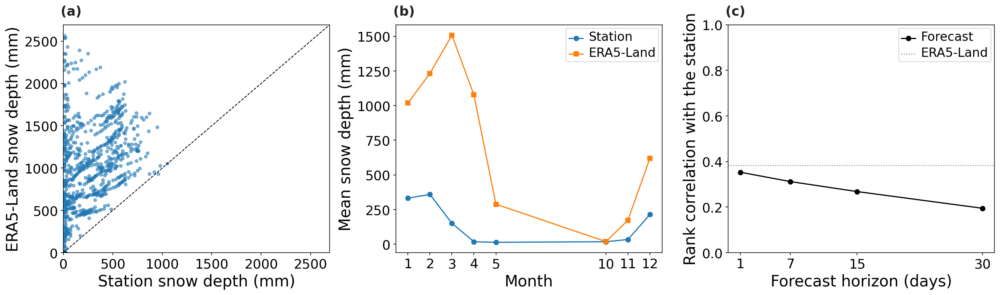

In [22]:
# 9g.1 Independent validation against ground snow-depth observations
STATION_DIR = DATA_DIR / "stations"
STATIONS = {
    "TUM00017285": {"name": "Hakkari", "latitude": 37.567, "longitude": 43.767,
                    "elevation_m": 1728.0, "in_province": True},
    "TU000017170": {"name": "Van", "latitude": 38.450, "longitude": 43.320,
                    "elevation_m": 1662.0, "in_province": False},
}
NEIGHBOURHOOD_DEG = 0.31


def read_ghcn_element(path, element):
    """One element of a GHCN-Daily .dly record, as a dated series in its native units.

    Values carrying a quality flag are dropped. Absences are not filled: this network
    transmits a snow depth only when snow is present, so a missing date means either no
    snow or no observation and the two cannot be separated.
    """
    observations = {}
    for line in Path(path).read_text().splitlines():
        if line[17:21] != element:
            continue
        year, month = int(line[11:15]), int(line[15:17])
        for day in range(31):
            offset = 21 + day * 8
            value, quality_flag = int(line[offset:offset + 5]), line[offset + 6]
            if value == -9999 or quality_flag.strip():
                continue
            try:
                observations[pd.Timestamp(year, month, day + 1)] = float(value)
            except ValueError:
                continue
    return pd.Series(observations, name=element).sort_index()


# The invariant fields carry a length-one time coordinate; it is dropped so the elevation
# and land tables can be joined on position alone.
with xr.open_dataset(ERA5_ARCHIVE / "z.nc") as _geopotential:
    ARCHIVE_ELEVATION = (_geopotential["z"].isel(time=0) / 9.80665).reset_coords(drop=True).load()
with xr.open_dataset(ERA5_ARCHIVE / "lsm.nc") as _land:
    ARCHIVE_LAND = _land["lsm"].isel(time=0).reset_coords(drop=True).load()


def archive_depth_series(latitude, longitude):
    with xr.open_dataset(ERA5_ARCHIVE / "sde.nc") as source:
        series = (source["sde"].sel(latitude=latitude, longitude=longitude,
                                    method="nearest") * 1e3).to_series()
    series.index = pd.to_datetime(series.index).normalize()
    return series


def companion_cells(station):
    """The cell nearest the station, and the nearby land cell closest to it in elevation.

    Only land cells are eligible. Van sits beside a lake, and its lowest neighbour is open
    water carrying no snow at all, which would read as a perfect absence of bias.
    """
    nearest = ARCHIVE_ELEVATION.sel(latitude=station["latitude"], longitude=station["longitude"],
                                    method="nearest")
    latitude, longitude = float(nearest.latitude), float(nearest.longitude)
    window = dict(latitude=slice(latitude + NEIGHBOURHOOD_DEG, latitude - NEIGHBOURHOOD_DEG),
                  longitude=slice(longitude - NEIGHBOURHOOD_DEG, longitude + NEIGHBOURHOOD_DEG))
    patch = (ARCHIVE_ELEVATION.sel(**window).to_dataframe(name="elevation_m")
             .join(ARCHIVE_LAND.sel(**window).to_dataframe(name="land_fraction"))
             .reset_index())
    patch = patch.loc[patch["land_fraction"] > 0.99]
    closest = patch.loc[(patch["elevation_m"] - station["elevation_m"]).abs().idxmin()]
    return ({"role": "nearest cell", "latitude": latitude, "longitude": longitude,
             "elevation_m": float(nearest)},
            {"role": "elevation-matched cell", "latitude": float(closest["latitude"]),
             "longitude": float(closest["longitude"]),
             "elevation_m": float(closest["elevation_m"])})


def depth_agreement(observed, modelled):
    """Magnitude and timing separated: a multiplicative bias this large would otherwise
    swamp any statement about whether the two series rise and fall together."""
    observed, modelled = np.asarray(observed, float), np.asarray(modelled, float)
    difference = modelled - observed
    debiased = difference - difference.mean()
    return {"n_days": len(observed), "observed_mean_mm": observed.mean(),
            "modelled_mean_mm": modelled.mean(),
            "ratio": modelled.mean() / observed.mean() if observed.mean() else np.nan,
            "bias_mm": difference.mean(), "MAE_mm": np.abs(difference).mean(),
            "RMSE_mm": float(np.sqrt(np.mean(difference ** 2))),
            "debiased_RMSE_mm": float(np.sqrt(np.mean(debiased ** 2))),
            "pearson_r": float(np.corrcoef(observed, modelled)[0, 1]),
            "spearman_rho": float(stats.spearmanr(observed, modelled).statistic)}


station_rows, station_pairs = [], {}
for station_id, station in STATIONS.items():
    depth = read_ghcn_element(STATION_DIR / f"{station_id}.dly", "SNWD")
    for companion in companion_cells(station):
        modelled = archive_depth_series(companion["latitude"], companion["longitude"])
        paired = pd.concat([depth.rename("station_mm"), modelled.rename("era5_mm")],
                           axis=1).dropna()
        if companion["role"] == "nearest cell":
            station_pairs[station_id] = paired
        station_rows.append({
            "station": station["name"], "station_id": station_id,
            "station_elevation_m": station["elevation_m"], "in_province": station["in_province"],
            "comparison": companion["role"], "cell_elevation_m": companion["elevation_m"],
            "elevation_difference_m": companion["elevation_m"] - station["elevation_m"],
            "record_start": str(paired.index.min().date()),
            "record_end": str(paired.index.max().date()),
            **depth_agreement(paired["station_mm"], paired["era5_mm"])})
station_agreement = pd.DataFrame(station_rows)
station_agreement.to_csv(TABLE_DIR / "table_16v_station_reanalysis_agreement.csv", index=False)
display(Markdown("**ERA5-Land snow depth against station observations, on reported days**"))
display(station_agreement.round(3))

# Forecast validation at Hakkari, the station that falls inside the modelled domain. The
# framework predicts water equivalent, so a density is needed to reach a depth: the
# operational conversion uses a day-of-year density climatology built on the training period
# alone, and an oracle conversion using the density of the target date bounds what the
# conversion could contribute. Because the reanalysis itself carries a large depth bias
# against this gauge, the timing statistics matter more here than the absolute error.
STATION_FOR_FORECAST = "TUM00017285"
station_cell = int(domain_mask.loc[
    (np.isclose(domain_mask["latitude"], 37.6)) & (np.isclose(domain_mask["longitude"], 43.8)),
    "cell"].iloc[0])
observed_depth = station_pairs[STATION_FOR_FORECAST]["station_mm"]
station_daily = multicell.loc[multicell["cell"] == station_cell].drop(columns="cell")
_training_daily = station_daily.set_index("time").loc[:"2002-12-31"]
density_climatology = _training_daily.groupby(_training_daily.index.dayofyear)["rsn"].mean()

forecast_rows = []
for horizon in FORECAST_HORIZONS:
    here = build_cell_forecast_frame(station_daily.copy(), horizon)
    train_here = here.loc[here["target_date"] <= pd.Timestamp("2002-12-31")]
    test_here = here.loc[here["target_date"] >= pd.Timestamp("2015-01-01")]

    ycol = target_col("sd", horizon)
    features = list(selected_features[("sd", horizon)])
    model = decision_model(TRANSFER_ALGORITHM).fit(train_here[features], train_here[ycol])
    predicted_swe = pd.Series(model.predict(test_here[features]),
                              index=test_here["target_date"].to_numpy())
    densities = {
        "climatological density": pd.Series(
            test_here["target_doy"].map(density_climatology).to_numpy(),
            index=test_here["target_date"].to_numpy()),
        "observed density (oracle)": station_daily.set_index("time")["rsn"].reindex(
            predicted_swe.index),
    }
    for label, density in densities.items():
        depth_forecast = (predicted_swe * 1e6 / density).rename("forecast_mm")
        paired = pd.concat([observed_depth.rename("station"), depth_forecast], axis=1).dropna()
        if paired.empty:
            continue
        forecast_rows.append({"horizon_days": horizon, "series": label,
                              **depth_agreement(paired["station"], paired["forecast_mm"])})
    reanalysis_depth = station_daily.set_index("time")["sde_mm"].reindex(predicted_swe.index)
    paired = pd.concat([observed_depth.rename("station"),
                        reanalysis_depth.rename("era5")], axis=1).dropna()
    forecast_rows.append({"horizon_days": horizon, "series": "ERA5-Land, same days",
                          **depth_agreement(paired["station"], paired["era5"])})

station_forecast_skill = pd.DataFrame(forecast_rows)
station_forecast_skill.to_csv(TABLE_DIR / "table_16w_station_forecast_validation.csv", index=False)
display(Markdown("**Forecast snow depth against the Hakkari station, held-out days only**"))
display(station_forecast_skill.round(3))

_nearest = station_agreement[station_agreement["comparison"] == "nearest cell"].set_index("station")
_hakkari, _van = _nearest.loc["Hakkari"], _nearest.loc["Van"]
print(f"The Hakkari gauge reports a depth on {int(_hakkari['n_days'])} days and the Van gauge on "
      f"{int(_van['n_days'])}, every one of them positive: this network does not transmit zeros, "
      f"so an absent date cannot be read as absent snow. Every comparison here is therefore "
      f"conditional on snow being present, and no presence-absence table is built from it.")
print(f"ERA5-Land carries {_hakkari['ratio']:.1f} times the observed depth at Hakkari and "
      f"{_van['ratio']:.1f} times at Van. Elevation explains only part of it: the Hakkari cell "
      f"sits {_hakkari['elevation_difference_m']:+.0f} m above its gauge, but the Van cell is "
      f"within {abs(_van['elevation_difference_m']):.0f} m of its own and still doubles the "
      f"observed depth.")
print(f"Day-to-day agreement is modest, with rank correlations of {_hakkari['spearman_rho']:.2f} "
      f"at Hakkari and {_van['spearman_rho']:.2f} at Van. Held-out skill reported against the "
      f"reanalysis therefore measures agreement with ERA5-Land, not with the snowpack a gauge "
      f"samples, and the framework is a hindcast benchmark against a reanalysis rather than a "
      f"validated depth forecast.")

fig, axes = plt.subplots(1, 3, figsize=(18, 5.4))
pairs = station_pairs[STATION_FOR_FORECAST]
axes[0].scatter(pairs["station_mm"], pairs["era5_mm"], s=14, alpha=0.55)
limit = float(max(pairs["station_mm"].max(), pairs["era5_mm"].max())) * 1.05
axes[0].plot([0, limit], [0, limit], color="black", linewidth=1.0, linestyle="--")
axes[0].set(xlabel="Station snow depth (mm)", ylabel="ERA5-Land snow depth (mm)",
            xlim=(0, limit), ylim=(0, limit))

monthly = pairs.assign(month=pairs.index.month).groupby("month")[["station_mm", "era5_mm"]].mean()
axes[1].plot(monthly.index, monthly["station_mm"], marker="o", label="Station")
axes[1].plot(monthly.index, monthly["era5_mm"], marker="s", label="ERA5-Land")
axes[1].set(xlabel="Month", ylabel="Mean snow depth (mm)")
# Months are integers; the automatic locator otherwise prints half months.
axes[1].set_xticks(sorted(monthly.index))
axes[1].legend(fontsize=9)

operational = station_forecast_skill[station_forecast_skill["series"] == "climatological density"]
axes[2].plot(operational["horizon_days"], operational["spearman_rho"], marker="o",
             color="black", label="Forecast")
reference = station_forecast_skill[station_forecast_skill["series"] == "ERA5-Land, same days"]
axes[2].axhline(float(reference["spearman_rho"].iloc[0]), color="grey", linestyle=":",
                linewidth=1.2, label="ERA5-Land")
axes[2].set(xlabel="Forecast horizon (days)", ylabel="Rank correlation with the station")
axes[2].set_xticks(FORECAST_HORIZONS)
axes[2].set_ylim(0, 1)
axes[2].legend(fontsize=9)
polish_manuscript_figure(fig)
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_08f_station_validation.png", bbox_inches="tight")
plt.show()


## 9h. Prediction intervals and event detection under class imbalance

A point forecast without an interval says nothing about how far it can be wrong, and a
detection score without a base rate says nothing about how hard the detection was. Both are
supplied here.

Intervals come from split conformal prediction, which needs a calibration set that the
model has never seen. The published forecast is fitted on the training and validation
periods together, so its validation residuals are in-sample and unusable for that purpose.
A separate model is therefore fitted on the training period alone, calibrated on the
validation residuals and applied to the held-out period, and the skill given up by
withholding those years is reported so the interval is not attached to a weaker forecast
without saying so. Coverage is then broken down by season, and compared against a variant
that calibrates a separate quantile per season, because a single quantile can hold overall
while failing in the season that matters.

For the event layer, precision-recall curves and average precision replace the area under
the receiver operating characteristic, which is optimistic when positives are rare. Every
score is reported against the base rate of the event in the held-out period, since a
classifier that ignored its predictors entirely would already score that.


**Split-conformal intervals: nominal against empirical coverage**

coverage         width        
level                    0.80   0.95   0.80    0.95
target  horizon_days                               
sd      1               0.816  0.953  0.009   0.022
        7               0.815  0.940  0.054   0.105
        15              0.805  0.953  0.085   0.184
        30              0.822  0.952  0.136   0.273
smlt_mm 1               0.805  0.954  0.433   5.522
        7               0.812  0.950  1.018  11.288
        15              0.816  0.948  1.011  11.222
        30              0.802  0.947  1.212  13.088
snowc   1               0.796  0.956  0.030   5.213
        7               0.768  0.964  1.116  57.612
        15              0.770  0.964  4.196  70.896
        30              0.798  0.967  9.587  81.050

At a nominal 80%, empirical coverage across the 12 designs runs from 0.768 to 0.822, a median of 0.805.
At a nominal 95%, empirical coverage across the 12 designs runs from 0.940 to 0.967, a median of 0.953.
One design is degenerate and is reported separately: snowc at 1 days carries a 80% interval only 0.0299 wide, which is 0.1% of the spread of the target itself, and it covers 0.796. The forecast is close enough at that lead that the calibrated radius is numerically negligible rather than wrong. This coverage is not a stable quantity: almost every residual sits at zero, so floating-point differences between runs move it by tenths while every other number in the pipeline reproduces, and it is therefore quoted as an artefact of the lead rather than as a result.
Withholding the validation years from the fit costs a median of 0.0001 and at most 0.0111 in held-out R-squared, so the interval belongs to a forecast that is close to the published one.


**Coverage by season, one global quantile against one quantile per season**

scheme                     global        seasonal       
level                        0.80   0.95     0.80   0.95
target  horizon_days group                              
sd      1            DJF    0.642  0.888    0.823  0.958
                     JJA    0.997  1.000    0.913  0.965
                     MAM    0.671  0.936    0.813  0.954
                     SON    0.952  0.988    0.849  0.967
        7            DJF    0.676  0.923    0.840  0.963
                     JJA    0.996  1.000    0.809  0.958
                     MAM    0.614  0.842    0.769  0.932
                     SON    0.975  0.995    0.813  0.968
        15           DJF    0.697  0.975    0.876  0.985
                     JJA    0.997  1.000    0.826  0.964
                     MAM    0.541  0.839    0.757  0.945
                     SON    0.987  0.999    0.804  0.947
        30           DJF    0.737  0.973    0.846  0.960
                     JJA    0.999  1.000    0.873  0.969
                     MAM    0.550  0.838    0.798  0.928
                     SON    1.000  1.000    0.800  0.949
smlt_mm 1            DJF    0.904  0.999    0.704  0.908
                     JJA    0.994  0.999    0.865  0.968
                     MAM    0.408  0.822    0.815  0.965
                     SON    0.917  0.999    0.863  0.969
        7            DJF    0.950  1.000    0.664  0.904
                     JJA    0.992  0.998    0.884  0.984
                     MAM    0.373  0.805    0.803  0.957
                     SON    0.936  1.000    0.876  0.975
        15           DJF    0.954  1.000    0.780  0.926
                     JJA    0.990  0.996    0.819  0.974
                     MAM    0.389  0.797    0.795  0.935
                     SON    0.933  1.000    0.838  0.977
        30           DJF    0.962  1.000    0.760  0.934
                     JJA    0.980  0.996    0.850  0.948
                     MAM    0.318  0.792    0.791  0.946
                     SON    0.951  1.000    0.810  0.977
snowc   1            DJF    0.785  0.971    0.785  0.959
                     JJA    0.986  0.997    0.986  0.986
                     MAM    0.726  0.967    0.750  0.941
                     SON    0.685  0.887    0.841  0.946
        7            DJF    0.824  0.982    0.719  0.985
                     JJA    0.991  1.000    0.804  0.962
                     MAM    0.791  0.978    0.716  0.919
                     SON    0.463  0.897    0.805  0.989
        15           DJF    0.775  0.995    0.749  0.991
                     JJA    0.988  0.998    0.826  0.969
                     MAM    0.788  0.976    0.733  0.915
                     SON    0.526  0.886    0.798  0.962
        30           DJF    0.833  0.999    0.755  0.993
                     JJA    0.991  0.998    0.825  0.964
                     MAM    0.773  0.954    0.810  0.933
                     SON    0.595  0.918    0.850  0.984

Season by season, a single quantile misses its nominal level by a median of 0.084 and by as much as 0.482; calibrating one quantile per season brings those to 0.022 and 0.136.
The largest single failure of the global quantile is smlt_mm at 30 days in MAM, covering 0.32 against a nominal 0.80; the seasonal quantile covers 0.79 there. Melt-season coverage is the case that matters, and it is the case a single quantile gets wrong.
Excluded from the season-by-season comparison: 8 summer snow-cover rows and 6 rows from designs whose interval is numerically degenerate; 82 rows remain.


**Average precision against the base rate of each event**

average_precision         \
horizon_days                                                     1      7    
event             model                                                      
High snowmelt day CryoSENSE-HK (Random Forest)                0.974  0.915   
                  CryoSENSE-HK (XGBoost)                        NaN    NaN   
                  Issue-day persistence                       0.826  0.511   
                  Target-DOY climatology baseline             0.611  0.611   
Snow-covered day  CryoSENSE-HK (Extra Trees)                    NaN  0.998   
                  CryoSENSE-HK (Random Forest)                1.000    NaN   
                  CryoSENSE-HK (XGBoost)                        NaN    NaN   
                  Issue-day persistence                       0.988  0.936   
                  Target-DOY climatology baseline             0.990  0.990   

                                                                 \
horizon_days                                          15     30   
event             model                                           
High snowmelt day CryoSENSE-HK (Random Forest)     0.893    NaN   
                  CryoSENSE-HK (XGBoost)             NaN  0.852   
                  Issue-day persistence            0.324  0.109   
                  Target-DOY climatology baseline  0.611  0.611   
Snow-covered day  CryoSENSE-HK (Extra Trees)       0.997    NaN   
                  CryoSENSE-HK (Random Forest)       NaN    NaN   
                  CryoSENSE-HK (XGBoost)             NaN  0.994   
                  Issue-day persistence            0.870  0.758   
                  Target-DOY climatology baseline  0.990  0.990   

                                                  skill_over_base_rate         \
horizon_days                                                        1      7    
event             model                                                         
High snowmelt day CryoSENSE-HK (Random Forest)                   0.883  0.825   
                  CryoSENSE-HK (XGBoost)                           NaN    NaN   
                  Issue-day persistence                          0.735  0.420   
                  Target-DOY climatology baseline                0.521  0.521   
Snow-covered day  CryoSENSE-HK (Extra Trees)                       NaN  0.538   
                  CryoSENSE-HK (Random Forest)                   0.539    NaN   
                  CryoSENSE-HK (XGBoost)                           NaN    NaN   
                  Issue-day persistence                          0.527  0.475   
                  Target-DOY climatology baseline                0.529  0.529   

                                                                 
horizon_days                                          15     30  
event             model                                          
High snowmelt day CryoSENSE-HK (Random Forest)     0.803    NaN  
                  CryoSENSE-HK (XGBoost)             NaN  0.761  
                  Issue-day persistence            0.233  0.019  
                  Target-DOY climatology baseline  0.520  0.521  
Snow-covered day  CryoSENSE-HK (Extra Trees)       0.536    NaN  
                  CryoSENSE-HK (Random Forest)       NaN    NaN  
                  CryoSENSE-HK (XGBoost)             NaN  0.533  
                  Issue-day persistence            0.409  0.297  
                  Target-DOY climatology baseline  0.529  0.529

Base rate of each event in the held-out period: High snowmelt day 0.091, Snow-covered day 0.461. Average precision is read against these rates, since a classifier that ignores the predictors entirely would score the base rate.


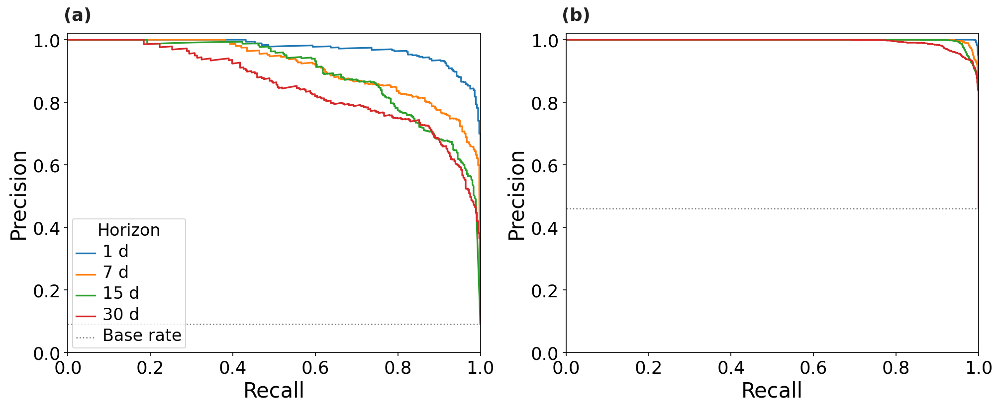

In [23]:
# 9h.1 Prediction intervals and event detection under class imbalance
from sklearn.metrics import average_precision_score, precision_recall_curve

CONFORMAL_LEVELS = [0.80, 0.95]
SEASONS = {12: "DJF", 1: "DJF", 2: "DJF", 3: "MAM", 4: "MAM", 5: "MAM",
           6: "JJA", 7: "JJA", 8: "JJA", 9: "SON", 10: "SON", 11: "SON"}


def split_conformal_intervals(train_df, calibrate_df, test_df, features, ycol, algorithm,
                              levels=CONFORMAL_LEVELS):
    """Split-conformal intervals with the calibration set held out of the fit.

    The published point forecast is fitted on training and validation together, so its
    validation residuals are in-sample and cannot calibrate anything. A separate model is
    therefore fitted on the training period alone, its absolute residuals on the validation
    period are the conformity scores, and the resulting quantiles are applied to that same
    model on the held-out period. The cost of withholding the validation years from the fit
    is reported alongside, so the interval is not quietly attached to a weaker forecast.
    """
    model = decision_model(algorithm).fit(train_df[features], train_df[ycol])
    calibration_residual = np.abs(calibrate_df[ycol].to_numpy()
                                  - model.predict(calibrate_df[features]))
    prediction = model.predict(test_df[features])
    observed = test_df[ycol].to_numpy()
    season = test_df["target_date"].dt.month.map(SEASONS).to_numpy()
    calibration_season = calibrate_df["target_date"].dt.month.map(SEASONS).to_numpy()

    rows = []
    n_calibration = len(calibration_residual)
    for level in levels:
        rank = int(np.ceil((n_calibration + 1) * level)) - 1
        radius = np.sort(calibration_residual)[min(rank, n_calibration - 1)]
        covered = np.abs(observed - prediction) <= radius
        rows.append({"level": level, "scheme": "global", "group": "all",
                     "radius": float(radius), "width": float(2 * radius),
                     "coverage": float(covered.mean()), "n_test": len(observed)})
        for group in sorted(set(SEASONS.values())):
            here = season == group
            if not here.any():
                continue
            rows.append({"level": level, "scheme": "global", "group": group,
                         "radius": float(radius), "width": float(2 * radius),
                         "coverage": float(covered[here].mean()), "n_test": int(here.sum())})
        # Mondrian variant: a separate quantile per season, which is the cheapest way to
        # ask for conditional coverage without fitting a second model.
        for group in sorted(set(SEASONS.values())):
            here, calibration_here = season == group, calibration_season == group
            if not here.any() or calibration_here.sum() < 20:
                continue
            scores = np.sort(calibration_residual[calibration_here])
            rank = min(int(np.ceil((len(scores) + 1) * level)) - 1, len(scores) - 1)
            group_radius = scores[rank]
            group_covered = np.abs(observed[here] - prediction[here]) <= group_radius
            rows.append({"level": level, "scheme": "seasonal", "group": group,
                         "radius": float(group_radius), "width": float(2 * group_radius),
                         "coverage": float(group_covered.mean()), "n_test": int(here.sum())})
    return rows, r2_score(observed, prediction)


conformal_rows = []
for horizon in FORECAST_HORIZONS:
    train_h = forecast_frames[horizon]["train"]
    valid_h = forecast_frames[horizon]["valid"]
    test_h = forecast_frames[horizon]["test"]
    for target in targets:
        ycol = target_col(target, horizon)
        algorithm = fitted_models[(target, horizon)][0]
        features = list(selected_features[(target, horizon)])
        rows, train_only_r2 = split_conformal_intervals(train_h, valid_h, test_h, features,
                                                        ycol, algorithm)
        published_r2 = float(final_results.loc[
            (final_results.horizon_days == horizon) & (final_results.target == target)
            & final_results.method.str.startswith("CryoSENSE-HK"), "R2"].iloc[0])
        for row in rows:
            conformal_rows.append({"horizon_days": horizon, "target": target,
                                   "algorithm": algorithm,
                                   "train_only_R2": train_only_r2,
                                   "published_R2": published_r2, **row})
conformal_intervals = pd.DataFrame(conformal_rows)
conformal_intervals.to_csv(TABLE_DIR / "table_16y_conformal_prediction_intervals.csv", index=False)

_overall = conformal_intervals[(conformal_intervals.scheme == "global")
                               & (conformal_intervals.group == "all")]
display(Markdown("**Split-conformal intervals: nominal against empirical coverage**"))
display(_overall.pivot_table(index=["target", "horizon_days"], columns="level",
                             values=["coverage", "width"]).round(3))
# A degenerate design is one whose calibrated radius is a rounding error against the scale
# of the target: the forecast is so close at that lead that most residuals sit at zero, the
# quantile is numerically negligible, and coverage is then decided by a handful of days
# rather than by the calibration being right or wrong.
_scale = {(target, horizon): float(forecast_frames[horizon]["test"][target_col(target, horizon)].std())
          for horizon in FORECAST_HORIZONS for target in targets}
_overall = _overall.assign(
    relative_width=lambda d: [row.width / _scale[(row.target, row.horizon_days)]
                              for row in d.itertuples()])
_degenerate = _overall["relative_width"] < 0.01
for level, group in _overall[~_degenerate].groupby("level"):
    print(f"At a nominal {level:.0%}, empirical coverage across the "
          f"{group['target'].nunique() * group['horizon_days'].nunique()} designs runs from "
          f"{group['coverage'].min():.3f} to {group['coverage'].max():.3f}, a median of "
          f"{group['coverage'].median():.3f}.")
for row in _overall[_degenerate].itertuples():
    print(f"One design is degenerate and is reported separately: {row.target} at "
          f"{row.horizon_days} days carries a {row.level:.0%} interval only {row.width:.3g} wide, "
          f"which is {row.relative_width:.1%} of the spread of the target itself, and it covers "
          f"{row.coverage:.3f}. The forecast is close enough at that lead that the calibrated "
          f"radius is numerically negligible rather than wrong. This coverage is not a stable "
          f"quantity: almost every residual sits at zero, so floating-point differences between "
          f"runs move it by tenths while every other number in the pipeline reproduces, and it "
          f"is therefore quoted as an artefact of the lead rather than as a result.")
_degenerate_designs = set(map(tuple, _overall.loc[_degenerate, ["target", "horizon_days"]].values))
_cost = (_overall.groupby(["target", "horizon_days"])[["published_R2", "train_only_R2"]].first()
         .assign(loss=lambda d: d["published_R2"] - d["train_only_R2"]))
print(f"Withholding the validation years from the fit costs a median of "
      f"{_cost['loss'].median():.4f} and at most {_cost['loss'].max():.4f} in held-out "
      f"R-squared, so the interval belongs to a forecast that is close to the published one.")

_seasonal = conformal_intervals[conformal_intervals.group != "all"]
display(Markdown("**Coverage by season, one global quantile against one quantile per season**"))
display(_seasonal.pivot_table(index=["target", "horizon_days", "group"], columns=["scheme", "level"],
                              values="coverage").round(3))
# Coverage is compared season by season on the designs that carry a usable interval. Summer
# for snow cover is excluded from the comparison and reported on its own: with no snow to
# forecast, every calibration residual is zero, the seasonal radius collapses to zero and the
# first non-zero error in the held-out period takes the coverage with it.
_pairs = _seasonal.pivot_table(index=["target", "horizon_days", "group", "level"],
                               columns="scheme", values="coverage").dropna().reset_index()
_summer_snow = (_pairs["target"] == "snowc") & (_pairs["group"] == "JJA")
# Degenerate designs are excluded from the comparison for the same reason they are excluded
# above: their coverage is decided by floating-point noise, so letting one of them stand as
# the worst case would put an unstable number in front of the reader.
_is_degenerate = _pairs.apply(lambda r: (r["target"], r["horizon_days"]) in _degenerate_designs, axis=1)
_usable = _pairs[~_summer_snow & ~_is_degenerate].assign(
    global_gap=lambda d: (d["global"] - d["level"]).abs(),
    seasonal_gap=lambda d: (d["seasonal"] - d["level"]).abs())
print(f"Season by season, a single quantile misses its nominal level by a median of "
      f"{_usable['global_gap'].median():.3f} and by as much as {_usable['global_gap'].max():.3f}; "
      f"calibrating one quantile per season brings those to "
      f"{_usable['seasonal_gap'].median():.3f} and {_usable['seasonal_gap'].max():.3f}.")
_worst = _usable.loc[_usable["global_gap"].idxmax()]
print(f"The largest single failure of the global quantile is {_worst['target']} at "
      f"{int(_worst['horizon_days'])} days in {_worst['group']}, covering {_worst['global']:.2f} "
      f"against a nominal {_worst['level']:.2f}; the seasonal quantile covers "
      f"{_worst['seasonal']:.2f} there. Melt-season coverage is the case that matters, and it is "
      f"the case a single quantile gets wrong.")
for _, row in _pairs[_summer_snow].iterrows():
    if row["seasonal"] < 0.5:
        print(f"Reported separately: snow cover in summer at {int(row['horizon_days'])} days. "
              f"There is no snow to forecast, so every calibration residual is zero, the seasonal "
              f"radius collapses to zero and coverage falls to {row['seasonal']:.2f}. The global "
              f"quantile covers {row['global']:.2f} there only because it is borrowed from the "
              f"snow season.")
print(f"Excluded from the season-by-season comparison: "
      f"{int(_summer_snow.sum())} summer snow-cover rows and {int((~_summer_snow & _is_degenerate).sum())} "
      f"rows from designs whose interval is numerically degenerate; "
      f"{len(_usable)} rows remain.")

# Precision-recall behaviour of the event layer, read from the stored probabilities. The
# events are rare, so a receiver operating characteristic flatters every classifier and the
# base rate has to be carried alongside every score.
event_probabilities = pd.read_csv(TABLE_DIR / "table_16x_event_probabilities.csv",
                                  parse_dates=["target_date"])
precision_rows = []
for (event, horizon, model), group in event_probabilities.groupby(["event", "horizon_days",
                                                                   "model"]):
    truth, score = group["observed"].to_numpy(), group["probability"].to_numpy()
    base_rate = float(truth.mean())
    precision_rows.append({"event": event, "horizon_days": horizon, "model": model,
                           "n_test": len(truth), "base_rate": base_rate,
                           "average_precision": float(average_precision_score(truth, score)),
                           "skill_over_base_rate":
                               float(average_precision_score(truth, score)) - base_rate})
event_precision = pd.DataFrame(precision_rows)
event_precision.to_csv(TABLE_DIR / "table_16z_event_precision_recall.csv", index=False)
display(Markdown("**Average precision against the base rate of each event**"))
display(event_precision.pivot_table(index=["event", "model"], columns="horizon_days",
                                    values=["average_precision", "skill_over_base_rate"]).round(3))
_rates = event_precision.groupby("event")["base_rate"].first()
print("Base rate of each event in the held-out period: "
      + ", ".join(f"{name} {rate:.3f}" for name, rate in _rates.items())
      + ". Average precision is read against these rates, since a classifier that ignores "
        "the predictors entirely would score the base rate.")

fig, axes = plt.subplots(1, 2, figsize=(13.5, 5.6))
for ax, event in zip(axes, sorted(event_probabilities["event"].unique())):
    for horizon in FORECAST_HORIZONS:
        subset = event_probabilities[(event_probabilities.event == event)
                                     & (event_probabilities.horizon_days == horizon)
                                     & (event_probabilities.model.str.startswith("CryoSENSE"))]
        if subset.empty:
            continue
        precision, recall, _ = precision_recall_curve(subset["observed"], subset["probability"])
        ax.plot(recall, precision, linewidth=1.6, label=f"{horizon} d")
        base_rate = float(subset["observed"].mean())
    ax.axhline(base_rate, color="grey", linestyle=":", linewidth=1.2, label="Base rate")
    ax.set(xlabel="Recall", ylabel="Precision", xlim=(0, 1), ylim=(0, 1.02))
axes[0].legend(fontsize=9, title="Horizon", loc="lower left")
polish_manuscript_figure(fig)
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_08g_event_precision_recall.png", bbox_inches="tight")
plt.show()


## 10. Rolling-origin temporal robustness

Expanding-window temporal validation evaluates whether lead-time forecasting conclusions depend on one holdout boundary. In each fold and horizon, mutual-information ranking is recomputed only within the fold training period.


RMSE_mean  RMSE_std  MAE_mean  MAE_std  R2_mean  R2_std  \
target  horizon_days                                                            
sd      1                0.0059    0.0010    0.0029   0.0005   0.9993  0.0002   
        7                0.0258    0.0019    0.0145   0.0010   0.9870  0.0018   
        15               0.0400    0.0019    0.0225   0.0011   0.9684  0.0052   
        30               0.0596    0.0034    0.0336   0.0010   0.9289  0.0161   
smlt_mm 1                1.2371    0.1236    0.4135   0.0512   0.9485  0.0037   
        7                2.1031    0.1338    0.7782   0.0662   0.8506  0.0113   
        15               2.2470    0.0662    0.8177   0.0513   0.8288  0.0168   
        30               2.6961    0.1802    1.0060   0.0689   0.7547  0.0195   
snowc   1                4.1953    0.3972    0.7015   0.1033   0.9926  0.0014   
        7               12.4566    0.6516    3.5152   0.3967   0.9351  0.0069   
        15              15.0740    0.9586    5.1537   0.9123   0.9049  0.0128   
        30              15.4398    0.6777    5.5148   0.2680   0.9004  0.0089   

                      NSE_mean  NSE_std  KGE_mean  KGE_std  \
target  horizon_days                                         
sd      1               0.9993   0.0002    0.9968   0.0002   
        7               0.9870   0.0018    0.9871   0.0078   
        15              0.9684   0.0052    0.9709   0.0139   
        30              0.9289   0.0161    0.9430   0.0233   
smlt_mm 1               0.9485   0.0037    0.9518   0.0100   
        7               0.8506   0.0113    0.8593   0.0521   
        15              0.8288   0.0168    0.8404   0.0708   
        30              0.7547   0.0195    0.8224   0.0278   
snowc   1               0.9926   0.0014    0.9950   0.0004   
        7               0.9351   0.0069    0.9557   0.0036   
        15              0.9049   0.0128    0.9281   0.0100   
        30              0.9004   0.0089    0.9219   0.0031   

                      runtime_seconds_mean  runtime_seconds_std  
target  horizon_days                                             
sd      1                           0.6372               0.3423  
        7                           0.1193               0.0421  
        15                          0.1871               0.1247  
        30                          0.1102               0.0302  
smlt_mm 1                           0.1245               0.0539  
        7                           0.0893               0.0174  
        15                          0.1317               0.0509  
        30                          0.0855               0.0094  
snowc   1                           0.1754               0.0988  
        7                           0.0679               0.0314  
        15                          0.1107               0.0567  
        30                          0.1387               0.0570

,target,horizon_days,published_algorithm,folds,folds_matching,distinct_winners,winners,agreement
0,sd,1,Random Forest,4,3,2,"Extra Trees, Random Forest",0.75
1,sd,7,Extra Trees,4,1,2,"Extra Trees, XGBoost",0.25
2,sd,15,Extra Trees,4,2,2,"Extra Trees, XGBoost",0.50
3,sd,30,XGBoost,4,1,2,"Extra Trees, XGBoost",0.25
4,smlt_mm,1,Extra Trees,4,2,2,"Extra Trees, Random Forest",0.50
5,smlt_mm,7,XGBoost,4,1,3,"Extra Trees, Random Forest, XGBoost",0.25
6,smlt_mm,15,Extra Trees,4,2,3,"Extra Trees, Random Forest, XGBoost",0.50
7,smlt_mm,30,XGBoost,4,0,1,Extra Trees,0.00
8,snowc,1,Random Forest,4,1,3,"Extra Trees, Random Forest, XGBoost",0.25
9,snowc,7,Extra Trees,4,2,3,"Extra Trees, Random Forest, XGBoost",0.50


Fold-wise decision-layer agreement with the published choice: 0.438 (21/48 folds)
On the 27 folds where the fold picked a different algorithm, keeping its own winner would change the fold test R-squared by a median of -0.0001, at best +0.0071 and at worst -0.0095. The three candidates are close enough that which of them wins a fold is decided by margins this small.
Fold-to-fold R2 standard deviation across target-horizon pairs: min 0.0002, median 0.0079, max 0.0195 (largest at ('smlt_mm', np.int64(30)))


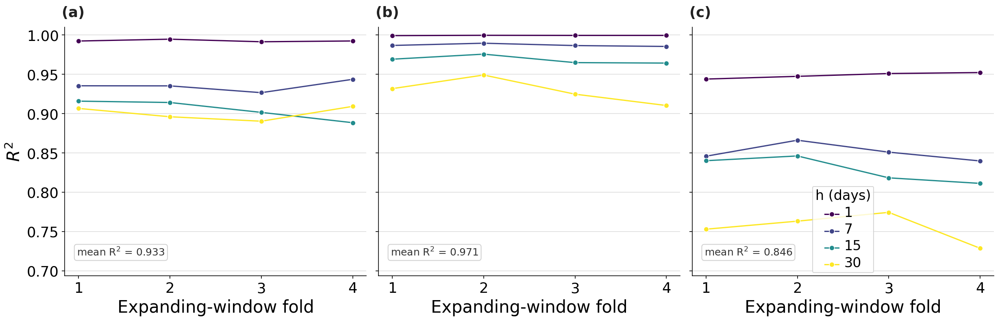

In [24]:
# 10.1 Expanding-window validation for proposed Set B lead-time design
rolling_rows, fold_choice_rows = [], []
for horizon in FORECAST_HORIZONS:
    hdf = forecast_frames[horizon]["data"]
    tscv = TimeSeriesSplit(n_splits=4)
    for target in targets:
        ycol = target_col(target, horizon)
        algorithm = fitted_models[(target, horizon)][0]
        fixed_k = len(selected_features[(target, horizon)])
        for fold, (tr_idx, te_idx) in enumerate(tscv.split(hdf), start=1):
            fold_train, fold_test = hdf.iloc[tr_idx], hdf.iloc[te_idx]
            ranking = rank_features(fold_train, proposed_features, ycol)
            feats = ranking.index[:fixed_k].tolist()
            # Fold-wise decision-layer re-selection (B10). The candidate algorithms
            # compete on an inner validation slice cut from the end of the fold
            # training window, so the fold test window stays untouched by selection.
            inner_cut = int(len(fold_train) * 0.8)
            inner_train, inner_valid = fold_train.iloc[:inner_cut], fold_train.iloc[inner_cut:]
            inner_feats = rank_features(inner_train, proposed_features, ycol).index[:fixed_k].tolist()
            inner_rmse = {}
            for candidate in algorithms:
                cm = decision_model(candidate)
                cm.fit(inner_train[inner_feats], inner_train[ycol])
                inner_rmse[candidate] = regression_metrics(
                    inner_valid[ycol], cm.predict(inner_valid[inner_feats]))["RMSE"]
            fold_algorithm = min(inner_rmse, key=inner_rmse.get)
            fold_choice_rows.append({"horizon_days": horizon, "target": target, "fold": fold,
                                     "fold_algorithm": fold_algorithm,
                                     "published_algorithm": algorithm,
                                     "matches_published": fold_algorithm == algorithm,
                                     **{f"inner_RMSE_{a}": inner_rmse[a] for a in algorithms}})
            m = decision_model(algorithm)
            start = time.perf_counter()
            m.fit(fold_train[feats], fold_train[ycol])
            runtime = time.perf_counter() - start
            met = regression_metrics(fold_test[ycol], m.predict(fold_test[feats]))
            # What the fold would have scored had it kept its own winner. An unstable
            # choice only matters if it moves the score, so the difference is measured
            # rather than argued.
            if fold_algorithm == algorithm:
                fold_choice_rows[-1]["fold_test_R2_published"] = met["R2"]
                fold_choice_rows[-1]["fold_test_R2_fold_choice"] = met["R2"]
            else:
                alt = decision_model(fold_algorithm)
                alt.fit(fold_train[feats], fold_train[ycol])
                alt_met = regression_metrics(fold_test[ycol], alt.predict(fold_test[feats]))
                fold_choice_rows[-1]["fold_test_R2_published"] = met["R2"]
                fold_choice_rows[-1]["fold_test_R2_fold_choice"] = alt_met["R2"]
            rolling_rows.append({"horizon_days": horizon, "target": target, "target_col": ycol,
                                 "fold": fold, "algorithm": algorithm,
                                 "target_start": fold_test["target_date"].min().date(),
                                 "target_end": fold_test["target_date"].max().date(),
                                 "runtime_seconds": runtime, **met})
rolling = pd.DataFrame(rolling_rows)
rolling_summary = rolling.groupby(["target", "horizon_days"])[["RMSE", "MAE", "R2", "NSE", "KGE", "runtime_seconds"]].agg(["mean", "std"]).round(4)
rolling_summary.columns = [f"{metric}_{stat}" for metric, stat in rolling_summary.columns]
rolling.to_csv(TABLE_DIR / "table_17_rolling_origin_folds.csv", index=False)
rolling_summary.to_csv(TABLE_DIR / "table_18_rolling_origin_summary.csv")
display(rolling_summary)

# B10: how stable is the decision-layer choice, and how wide is the fold spread?
fold_choice = pd.DataFrame(fold_choice_rows)
fold_choice.to_csv(TABLE_DIR / "table_18a_fold_algorithm_selection.csv", index=False)
choice_summary = (fold_choice.groupby(["target", "horizon_days"])
                  .agg(published_algorithm=("published_algorithm", "first"),
                       folds=("fold", "size"),
                       folds_matching=("matches_published", "sum"),
                       distinct_winners=("fold_algorithm", "nunique"),
                       winners=("fold_algorithm", lambda s: ", ".join(sorted(set(s)))))
                  .reset_index())
choice_summary["agreement"] = (choice_summary["folds_matching"] / choice_summary["folds"]).round(3)
choice_summary.to_csv(TABLE_DIR / "table_18b_fold_algorithm_agreement.csv", index=False)
display(choice_summary)
print(f"Fold-wise decision-layer agreement with the published choice: "
      f"{fold_choice['matches_published'].mean():.3f} "
      f"({int(fold_choice['matches_published'].sum())}/{len(fold_choice)} folds)")
fold_choice["fold_test_R2_gain"] = (fold_choice["fold_test_R2_fold_choice"]
                                    - fold_choice["fold_test_R2_published"])
_disagree = fold_choice[~fold_choice["matches_published"]]
print(f"On the {len(_disagree)} folds where the fold picked a different algorithm, keeping "
      f"its own winner would change the fold test R-squared by a median of "
      f"{_disagree['fold_test_R2_gain'].median():+.4f}, at best "
      f"{_disagree['fold_test_R2_gain'].max():+.4f} and at worst "
      f"{_disagree['fold_test_R2_gain'].min():+.4f}. The three candidates are close enough "
      f"that which of them wins a fold is decided by margins this small.")
fold_choice.to_csv(TABLE_DIR / "table_18a_fold_algorithm_selection.csv", index=False)
spread = rolling_summary["R2_std"]
print(f"Fold-to-fold R2 standard deviation across target-horizon pairs: "
      f"min {spread.min():.4f}, median {spread.median():.4f}, max {spread.max():.4f} "
      f"(largest at {spread.idxmax()})")

panel_labels = ["(a)", "(b)", "(c)"]
fig, axes = plt.subplots(1, 3, figsize=(16.5, 5.4), sharey=True)
y_min = max(0.0, rolling["R2"].min() - 0.035)
for ax, target, panel in zip(axes, targets, panel_labels):
    one = rolling.loc[rolling.target == target].sort_values("fold")
    sns.lineplot(data=one, x="fold", y="R2", hue="horizon_days", marker="o", ax=ax, palette="viridis")
    ax.set_xlabel("Expanding-window fold")
    ax.set_xticks(sorted(one["fold"].unique()))
    ax.set_ylim(y_min, 1.01)
    ax.grid(axis="y", color="#dddddd", lw=0.8)
    ax.spines[["top", "right"]].set_visible(False)
    ax.text(0.04, 0.08, f"mean R$^2$ = {one['R2'].mean():.3f}",
            transform=ax.transAxes, fontsize=12, color="#333333",
            bbox=dict(fc="white", ec="#cccccc", alpha=0.90, boxstyle="round,pad=0.25"))
    if ax is not axes[-1]:
        ax.get_legend().remove()
axes[-1].legend(title="h (days)", fontsize=8)
polish_manuscript_figure(fig)
# Shared y-axis: one neutral label, panels identified by letter and by the caption.
axes[0].set_ylabel("$R^2$")
add_panel_letters(axes, letters=panel_labels)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_09_rolling_origin_robustness.png", bbox_inches="tight")
plt.show()


## 11. Explainability: TreeSHAP feature contribution

SHAP contributions explain the fitted tree decision layer on the held-out target period. They are computed for all horizons and plotted for the 7-day horizon as the manuscript-scale example. They indicate predictive dependence, not causality and not glacier mass-balance mechanisms.


,horizon_days,target,algorithm,rank,feature,mean_abs_SHAP
4,1,sd,Random Forest,1,sd_lag0,0.14141
5,1,sd,Random Forest,2,sd_lag1,0.03937
6,1,sd,Random Forest,3,sd_lag3,0.00511
7,1,sd,Random Forest,4,snowc_lag0,0.00453
8,1,sd,Random Forest,5,doy_cos,0.00169
...,...,...,...,...,...,...
81,30,snowc,Extra Trees,2,net_radiation_W,9.40217
82,30,snowc,Extra Trees,3,t2m_C,4.66250
83,30,snowc,Extra Trees,4,sd_lag0,4.14886
84,30,snowc,Extra Trees,5,t2m_C_lag1,4.03775


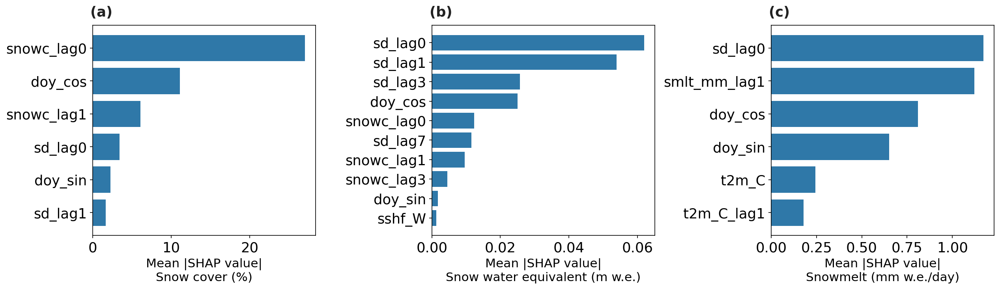

In [25]:
# 11.1 TreeSHAP summaries for final CryoSENSE-HK forecast models
shap_rows = []
SHAP_FIGURE_HORIZON = 7
fig, axes = plt.subplots(1, 3, figsize=(17, 5))
rng = np.random.RandomState(SEED)
for horizon in FORECAST_HORIZONS:
    test_h = forecast_frames[horizon]["test"]
    sample_idx = rng.choice(np.arange(len(test_h)), size=min(200, len(test_h)), replace=False)
    for target, label in targets.items():
        algorithm, model = fitted_models[(target, horizon)]
        feats = selected_features[(target, horizon)]
        X_sample = test_h.iloc[sample_idx][feats]
        explanation = shap.TreeExplainer(model)(X_sample)
        means = np.abs(explanation.values).mean(axis=0)
        order = np.argsort(means)
        for rank, idx in enumerate(np.argsort(-means), start=1):
            shap_rows.append({"horizon_days": horizon, "target": target, "algorithm": algorithm, "rank": rank,
                              "feature": feats[idx], "mean_abs_SHAP": means[idx]})
        if horizon == SHAP_FIGURE_HORIZON:
            ax = axes[list(targets.keys()).index(target)]
            ax.barh(np.array(feats)[order], means[order], color="#2f78a8")
            ax.set(xlabel="Mean |SHAP value|")
shap_table = pd.DataFrame(shap_rows).sort_values(["target", "rank"])
shap_table = shap_table.sort_values(["target", "horizon_days", "rank"])
shap_table.to_csv(TABLE_DIR / "table_19_shap_feature_importance_by_horizon.csv", index=False)
display(shap_table.groupby(["target", "horizon_days"]).head(6).round(5))
polish_manuscript_figure(fig)
# Panel identity: a letter inside the panel, the target variable in the axis label.
for ax, (target, label) in zip(axes, targets.items()):
    ax.set_xlabel(f"Mean |SHAP value|\n{label}", fontsize=15)
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_10_treeshap_feature_importance.png", bbox_inches="tight")
plt.show()


## 11b. Stability of the attribution and the correlation behind it

A ranking read from one fitted model is a property of that fit. The decision layer is
therefore refitted over five contiguous blocks of issue dates, the mean absolute TreeSHAP
value is recomputed on each withheld block, and the agreement between the resulting
rankings is reported.

The correlation structure of the selected predictors is reported next to it. TreeSHAP
divides credit between correlated predictors according to how the trees happened to split,
so a ranking can only be as stable as that structure allows, and a swap between two
predictors that carry the same information says more about the fit than about the snowpack.


**Stability of the TreeSHAP ranking across chronological folds**

,horizon_days,target,algorithm,n_folds,median_rank_correlation,min_rank_correlation,top_feature_agreement,most_frequent_top_feature,features_in_every_top_three,shared_top_three
0,1,snowc,Random Forest,5,1.000,1.000,1.0,snowc_lag0,3,"sd_lag0, sd_lag1, snowc_lag0"
1,1,sd,Random Forest,5,0.986,0.972,1.0,sd_lag0,3,"sd_lag0, sd_lag1, sd_lag3"
2,1,smlt_mm,Extra Trees,5,0.979,0.951,1.0,smlt_mm_lag1,3,"smlt_mm_lag1, smlt_mm_lag3, t2m_C"
3,7,snowc,Extra Trees,5,1.000,1.000,1.0,snowc_lag0,3,"doy_cos, snowc_lag0, snowc_lag1"
4,7,sd,Extra Trees,5,1.000,0.988,1.0,sd_lag0,2,"sd_lag0, sd_lag1"
5,7,smlt_mm,XGBoost,5,1.000,1.000,1.0,smlt_mm_lag1,3,"doy_cos, sd_lag0, smlt_mm_lag1"
6,15,snowc,Extra Trees,5,0.798,0.619,1.0,sd_lag0,1,sd_lag0
7,15,sd,Extra Trees,5,0.979,0.965,1.0,sd_lag0,3,"doy_cos, sd_lag0, sd_lag1"
8,15,smlt_mm,Extra Trees,5,0.952,0.867,1.0,doy_cos,3,"doy_cos, sd_lag1, sd_lag7"
9,30,snowc,Extra Trees,5,0.979,0.958,1.0,doy_cos,2,"doy_cos, net_radiation_W"


**Correlation among the selected predictors the attribution must divide**

,horizon_days,target,n_features,mean_abs_correlation,max_abs_correlation,most_correlated_pair,pairs_above_0.8
0,1,snowc,4,0.822,0.999,sd_lag0 / sd_lag1,2
1,1,sd,12,0.714,0.999,sd_lag0 / sd_lag1,22
2,1,smlt_mm,12,0.554,0.999,sd_lag0 / sd_lag1,16
3,7,snowc,6,0.630,0.999,sd_lag0 / sd_lag1,2
4,7,sd,10,0.698,0.999,sd_lag0 / sd_lag1,12
5,7,smlt_mm,6,0.436,0.990,t2m_C / t2m_C_lag1,3
6,15,snowc,8,0.688,0.990,t2m_C / t2m_C_lag1,14
7,15,sd,12,0.689,0.999,sd_lag0 / sd_lag1,24
8,15,smlt_mm,10,0.654,0.999,sd_lag0 / sd_lag1,15
9,30,snowc,12,0.645,1.000,e_mm / slhf_W,21


Rank correlation between folds has a median of 0.979 and never falls below 0.619. The same predictor leads in 100% of folds at worst, and a median of 3 predictors appear in every fold's top three.
The selected sets are not independent: the strongest pair reaches 1.00 and 161 pairs across all designs exceed 0.8, so an attribution that moves credit between two such predictors is a property of the fitted trees rather than evidence about the snowpack.
  snowc at 1 days pairs sd_lag0 / sd_lag1 at 0.999.
  sd at 1 days pairs sd_lag0 / sd_lag1 at 0.999.
  smlt_mm at 1 days pairs sd_lag0 / sd_lag1 at 0.999.
  snowc at 7 days pairs sd_lag0 / sd_lag1 at 0.999.
  sd at 7 days pairs sd_lag0 / sd_lag1 at 0.999.
  sd at 15 days pairs sd_lag0 / sd_lag1 at 0.999.
  smlt_mm at 15 days pairs sd_lag0 / sd_lag1 at 0.999.
  snowc at 30 days pairs e_mm / slhf_W at 1.000.
  sd at 30 days pairs sd_lag0 / sd_lag1 at 0.999.
  smlt_mm at 30 days pairs sd_lag1 / sd_lag0 at 0.999.
Evaporation and the surface laten

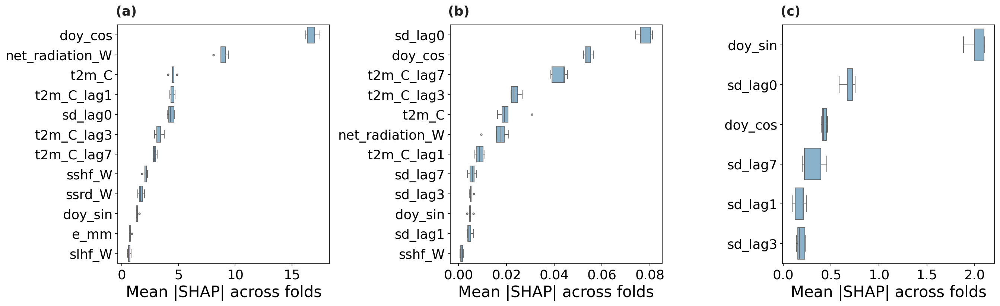

In [26]:
# 11b.1 Stability of the attribution across folds, and the correlation it has to share credit across
from itertools import combinations

SHAP_FOLDS = 5
SHAP_SAMPLE = 2000


def chronological_folds(frame, n_folds=SHAP_FOLDS):
    """Contiguous blocks of issue dates, so each fold is a distinct stretch of years."""
    edges = np.linspace(0, len(frame), n_folds + 1).astype(int)
    return [(frame.iloc[start:end]) for start, end in zip(edges[:-1], edges[1:])]


def mean_absolute_shap(model, frame, features, seed):
    sample = frame if len(frame) <= SHAP_SAMPLE else frame.sample(SHAP_SAMPLE, random_state=seed)
    values = shap.TreeExplainer(model).shap_values(sample[features])
    return pd.Series(np.abs(np.asarray(values)).mean(axis=0), index=features)


shap_fold_rows, shap_stability_rows, correlation_rows = [], [], []
for horizon in FORECAST_HORIZONS:
    fit_h = pd.concat([forecast_frames[horizon]["train"], forecast_frames[horizon]["valid"]])
    for target in targets:
        ycol = target_col(target, horizon)
        algorithm = fitted_models[(target, horizon)][0]
        features = list(selected_features[(target, horizon)])

        # How much shared information the attribution has to divide up. TreeSHAP splits
        # credit between correlated predictors in a way that depends on the fitted tree
        # structure, so a ranking is only as stable as the correlation structure allows.
        correlation = fit_h[features].corr().abs()
        pairs = [(a, b, float(correlation.loc[a, b])) for a, b in combinations(features, 2)]
        strongest = max(pairs, key=lambda item: item[2])
        correlation_rows.append({
            "horizon_days": horizon, "target": target, "n_features": len(features),
            "mean_abs_correlation": float(np.mean([value for _, _, value in pairs])),
            "max_abs_correlation": strongest[2],
            "most_correlated_pair": f"{strongest[0]} / {strongest[1]}",
            "pairs_above_0.8": int(sum(value > 0.8 for _, _, value in pairs))})

        rankings = {}
        for index, fold in enumerate(chronological_folds(fit_h)):
            others = fit_h.drop(fold.index)
            model = decision_model(algorithm).fit(others[features], others[ycol])
            importance = mean_absolute_shap(model, fold, features, SEED + index)
            rankings[index] = importance
            ordered = importance.sort_values(ascending=False)
            for rank, (feature, value) in enumerate(ordered.items(), start=1):
                shap_fold_rows.append({"horizon_days": horizon, "target": target, "fold": index,
                                       "fold_start": str(fold.index.min().date()),
                                       "fold_end": str(fold.index.max().date()),
                                       "feature": feature, "mean_abs_shap": float(value),
                                       "rank": rank})

        ranked = pd.DataFrame(rankings).rank(ascending=False)
        pairwise = [float(stats.spearmanr(ranked[a], ranked[b]).statistic)
                    for a, b in combinations(ranked.columns, 2)]
        top_features = [pd.Series(rankings[index]).idxmax() for index in rankings]
        top_three = [set(pd.Series(rankings[index]).sort_values(ascending=False).index[:3])
                     for index in rankings]
        shared_top_three = set.intersection(*top_three)
        shap_stability_rows.append({
            "horizon_days": horizon, "target": target, "algorithm": algorithm,
            "n_folds": SHAP_FOLDS, "median_rank_correlation": float(np.median(pairwise)),
            "min_rank_correlation": float(np.min(pairwise)),
            "top_feature_agreement": max(top_features.count(name) for name in set(top_features))
                                     / len(top_features),
            "most_frequent_top_feature": max(set(top_features), key=top_features.count),
            "features_in_every_top_three": len(shared_top_three),
            "shared_top_three": ", ".join(sorted(shared_top_three))})

shap_fold_importance = pd.DataFrame(shap_fold_rows)
shap_stability = pd.DataFrame(shap_stability_rows)
predictor_correlation = pd.DataFrame(correlation_rows)
shap_fold_importance.to_csv(TABLE_DIR / "table_20a_shap_importance_by_fold.csv", index=False)
shap_stability.to_csv(TABLE_DIR / "table_20b_shap_ranking_stability.csv", index=False)
predictor_correlation.to_csv(TABLE_DIR / "table_20c_selected_predictor_correlation.csv", index=False)

display(Markdown("**Stability of the TreeSHAP ranking across chronological folds**"))
display(shap_stability.round(3))
display(Markdown("**Correlation among the selected predictors the attribution must divide**"))
display(predictor_correlation.round(3))
print(f"Rank correlation between folds has a median of "
      f"{shap_stability['median_rank_correlation'].median():.3f} and never falls below "
      f"{shap_stability['min_rank_correlation'].min():.3f}. The same predictor leads in "
      f"{shap_stability['top_feature_agreement'].min():.0%} of folds at worst, and a median of "
      f"{shap_stability['features_in_every_top_three'].median():.0f} predictors appear in every "
      f"fold's top three.")
print(f"The selected sets are not independent: the strongest pair reaches "
      f"{predictor_correlation['max_abs_correlation'].max():.2f} and "
      f"{int(predictor_correlation['pairs_above_0.8'].sum())} pairs across all designs exceed "
      f"0.8, so an attribution that moves credit between two such predictors is a property of "
      f"the fitted trees rather than evidence about the snowpack.")
# One pair is not merely correlated but redundant by construction, and naming it is more
# useful than reporting a coefficient of one.
_redundant = predictor_correlation[predictor_correlation["max_abs_correlation"] > 0.999]
for row in _redundant.itertuples():
    print(f"  {row.target} at {row.horizon_days} days pairs {row.most_correlated_pair} at "
          f"{row.max_abs_correlation:.3f}.")
print("Evaporation and the surface latent heat flux are the same quantity in different "
      "units, related by the latent heat of vaporisation, and consecutive daily snow water "
      "equivalents differ by one day of accumulation. Credit assigned between members of "
      "such a pair carries no physical information and the ranking is read at the level of "
      "the pair.")

longest = FORECAST_HORIZONS[-1]
fig, axes = plt.subplots(1, 3, figsize=(18, 5.6))
for ax, target in zip(axes, targets):
    one = shap_fold_importance[(shap_fold_importance.target == target)
                               & (shap_fold_importance.horizon_days == longest)]
    order = (one.groupby("feature")["mean_abs_shap"].median().sort_values(ascending=False).index)
    sns.boxplot(data=one, x="mean_abs_shap", y="feature", order=order, ax=ax,
                color="#7fb3d5", fliersize=2, linewidth=0.9)
    ax.set(xlabel="Mean |SHAP| across folds", ylabel="")
polish_manuscript_figure(fig)
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_10b_shap_fold_stability.png", bbox_inches="tight")
plt.show()


## 12. CryoSENSE-HK to Landsat/GEE glacier-area linkage

The external target in this module is annual mapped glacier area (`km2`), not ice melt volume. For each satellite year, the 7-day CryoSENSE-HK snowmelt forecast layer is re-fitted only on daily ERA5-Land forecast pairs whose target dates precede that year, then forecasts that year's annual snowmelt indicator. Consequently, mapped glacier area is never used to train the daily snowmelt model.

With only 24 annual area observations, the linkage is evaluated as a parsimonious sensitivity model using leave-one-year-out (LOYO) and a separate chronological holdout. It is suitable for reporting area-decline association, not definitive glacier-mass forecasting.

**Placement: this module is supplementary material.** A physical interpretation built on 24 annual observations is too fragile to carry a main-text claim. The section therefore sits in the supplement, every association is reported with a percentile bootstrap interval and a permutation p-value, and the main text keeps a single directional-consistency sentence pointing to it.


In [27]:
# 12.1 Generate out-of-year CryoSENSE-HK forecast snowmelt indicators for GEE years
link_rows = []
target = "smlt_mm"
LINK_HORIZON = 7
ycol = target_col(target, LINK_HORIZON)
hdf_link = forecast_frames[LINK_HORIZON]["data"]
algorithm = fitted_models[(target, LINK_HORIZON)][0]
fixed_k = len(selected_features[(target, LINK_HORIZON)])
for year in glacier["year"]:
    historical = hdf_link.loc[hdf_link["target_date"] <= pd.Timestamp(f"{year - 1}-12-31")]
    current_year = hdf_link.loc[(hdf_link["target_date"] >= pd.Timestamp(f"{year}-01-01")) &
                                (hdf_link["target_date"] <= pd.Timestamp(f"{year}-12-31"))]
    ranking = rank_features(historical, proposed_features, ycol)
    feats = ranking.index[:fixed_k].tolist()
    annual_model = decision_model(algorithm)
    annual_model.fit(historical[feats], historical[ycol])
    snowmelt_pred = annual_model.predict(current_year[feats])
    link_rows.append({
        "year": year,
        "forecast_horizon_days": LINK_HORIZON,
        "cryosense_snowmelt_forecast_mm": snowmelt_pred.sum(),
        "snowmelt_observed_era5_mm": current_year[ycol].sum(),
        "snowmelt_forecast_daily_R2": r2_score(current_year[ycol], snowmelt_pred),
    })

link_indicators = pd.DataFrame(link_rows)
glacier_link = sat.merge(link_indicators, on="year", how="inner")
glacier_link.to_csv(TABLE_DIR / "table_20_glacier_cryosense_linkage_dataset.csv", index=False)
display(glacier_link[["year", "area_km2", "cryosense_snowmelt_forecast_mm", "cpdd_C_days", "snowmelt_forecast_daily_R2"]].round(4))


,year,area_km2,cryosense_snowmelt_forecast_mm,cpdd_C_days,snowmelt_forecast_daily_R2
0,2000,2.3379,560.738403,2446.0539,0.8557
1,2001,2.6576,337.700500,2486.0040,0.7551
2,2002,3.2660,920.404785,2333.5252,0.9409
3,2003,2.1187,884.951111,2363.5507,0.9116
4,2004,2.6331,704.533386,2368.4832,0.7525
5,2005,2.4777,644.316223,2364.3583,0.7512
6,2006,2.5118,692.091980,2503.0462,0.8688
7,2007,2.2488,755.859924,2378.1275,0.8691
8,2008,1.9206,423.201202,2517.7699,0.8286
9,2009,2.2249,811.914429,2170.6331,0.8912


,evaluation,model,n_predictors,RMSE,MAE,R2,NSE,KGE
0,LOYO,Time trend only,1,0.3304,0.2739,0.2319,0.2319,0.2301
1,LOYO,CryoSENSE forecast + CPDD,2,0.3735,0.2905,0.0183,0.0183,0.0168
2,LOYO,Trend + CryoSENSE forecast + CPDD,3,0.3259,0.2658,0.2524,0.2524,0.3019
3,Chronological holdout (2018-2024),Time trend only,1,0.3086,0.2865,0.0275,0.0275,-0.1103
4,Chronological holdout (2018-2024),CryoSENSE forecast + CPDD,2,0.4273,0.3554,-0.8647,-0.8647,0.1935
5,Chronological holdout (2018-2024),Trend + CryoSENSE forecast + CPDD,3,0.2728,0.2476,0.2400,0.2400,0.2134


,indicator,spearman_rho,p_value,boot_lo95,boot_hi95,boot_sd,sign_stable,permutation_p,n_years
0,cryosense_snowmelt_forecast_mm,0.3991,0.0533,-0.0542,0.7422,0.2082,0.9586,0.0538,24
1,cpdd_C_days,-0.4287,0.0366,-0.7670,0.0302,0.2067,0.9665,0.0365,24
2,mean_swe_m,0.5087,0.0111,0.0753,0.8288,0.1957,0.9882,0.0105,24


,slope_km2_per_year,linear_p,boot_lo95,boot_hi95,sign_stable,n_years
0,-0.0315,0.0014,-0.0502,-0.014,0.9997,24


,model,R2,boot_lo95,boot_hi95,n_years
0,Time trend only,0.2319,-0.1466,0.3971,24
1,CryoSENSE forecast + CPDD,0.0183,-0.5220,0.2659,24
2,Trend + CryoSENSE forecast + CPDD,0.2524,-0.2503,0.4596,24


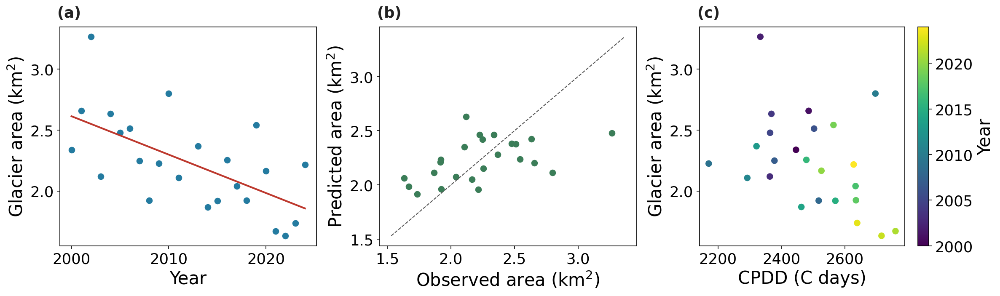

In [28]:
# 12.2 Small-sample glacier-area linkage: LOYO and chronological holdout
area_designs = {
    "Time trend only": ["year"],
    "CryoSENSE forecast + CPDD": ["cryosense_snowmelt_forecast_mm", "cpdd_C_days"],
    "Trend + CryoSENSE forecast + CPDD": ["year", "cryosense_snowmelt_forecast_mm", "cpdd_C_days"],
}
link_metrics, link_predictions = [], []
loo = LeaveOneOut()
for name, features in area_designs.items():
    pipe = make_pipeline(StandardScaler(), Ridge(alpha=10.0))
    pred = cross_val_predict(pipe, glacier_link[features], glacier_link["area_km2"], cv=loo)
    met = regression_metrics(glacier_link["area_km2"], pred)
    link_metrics.append({"evaluation": "LOYO", "model": name, "n_predictors": len(features), **met})
    for year, observed, predicted in zip(glacier_link["year"], glacier_link["area_km2"], pred):
        link_predictions.append({"evaluation": "LOYO", "model": name, "year": year,
                                 "observed_area_km2": observed, "predicted_area_km2": predicted})

train_area = glacier_link[glacier_link.year <= 2017]
test_area = glacier_link[glacier_link.year >= 2018]
for name, features in area_designs.items():
    pipe = make_pipeline(StandardScaler(), Ridge(alpha=10.0))
    pipe.fit(train_area[features], train_area["area_km2"])
    pred = pipe.predict(test_area[features])
    link_metrics.append({"evaluation": "Chronological holdout (2018-2024)", "model": name,
                         "n_predictors": len(features), **regression_metrics(test_area["area_km2"], pred)})
    for year, observed, predicted in zip(test_area["year"], test_area["area_km2"], pred):
        link_predictions.append({"evaluation": "Chronological holdout (2018-2024)", "model": name,
                                 "year": year, "observed_area_km2": observed, "predicted_area_km2": predicted})

link_metrics = pd.DataFrame(link_metrics)
link_predictions = pd.DataFrame(link_predictions)
link_metrics.to_csv(TABLE_DIR / "table_21_glacier_linkage_validation.csv", index=False)
link_predictions.to_csv(TABLE_DIR / "table_22_glacier_linkage_predictions.csv", index=False)
display(link_metrics.round(4))

# B14: with 24 annual observations a point correlation carries almost no
# information on its own, so every association is reported with a percentile
# bootstrap interval over resampled year pairs and a permutation p-value.
LINK_BOOTSTRAP = 10000
rng_link = np.random.RandomState(SEED)
n_link = len(glacier_link)
boot_idx = rng_link.randint(0, n_link, size=(LINK_BOOTSTRAP, n_link))

assoc_rows = []
for col in ["cryosense_snowmelt_forecast_mm", "cpdd_C_days", "mean_swe_m"]:
    area = glacier_link["area_km2"].to_numpy()
    other = glacier_link[col].to_numpy()
    rho, pvalue = stats.spearmanr(area, other)
    boot = np.array([stats.spearmanr(area[idx], other[idx]).statistic
                     for idx in boot_idx])
    boot = boot[np.isfinite(boot)]
    perm = np.array([stats.spearmanr(area, rng_link.permutation(other)).statistic
                     for _ in range(LINK_BOOTSTRAP)])
    assoc_rows.append({
        "indicator": col,
        "spearman_rho": rho,
        "p_value": pvalue,
        "boot_lo95": np.percentile(boot, 2.5),
        "boot_hi95": np.percentile(boot, 97.5),
        "boot_sd": boot.std(ddof=1),
        "sign_stable": float(np.mean(np.sign(boot) == np.sign(rho))),
        "permutation_p": float((np.sum(np.abs(perm) >= abs(rho)) + 1) / (len(perm) + 1)),
        "n_years": n_link,
    })
link_associations = pd.DataFrame(assoc_rows)
link_associations.to_csv(TABLE_DIR / "table_23_glacier_linkage_associations.csv", index=False)
display(link_associations.round(4))

# The mapped-area trend itself is quoted in the text, so it gets the same treatment.
link_slope, link_intercept, _, link_p, _ = stats.linregress(glacier_link["year"], glacier_link["area_km2"])
slope_boot = np.array([stats.linregress(glacier_link["year"].to_numpy()[idx],
                                        glacier_link["area_km2"].to_numpy()[idx]).slope
                       for idx in boot_idx])
trend_ci = {"slope_km2_per_year": link_slope, "linear_p": link_p,
            "boot_lo95": np.percentile(slope_boot, 2.5),
            "boot_hi95": np.percentile(slope_boot, 97.5),
            "sign_stable": float(np.mean(slope_boot < 0)), "n_years": n_link}
pd.DataFrame([trend_ci]).to_csv(TABLE_DIR / "table_23a_glacier_area_trend_ci.csv", index=False)
display(pd.DataFrame([trend_ci]).round(4))

# LOYO skill of the linkage designs, resampled the same way.
loyo_ci_rows = []
for name in area_designs:
    one = link_predictions[(link_predictions.evaluation == "LOYO") & (link_predictions.model == name)]
    obs = one["observed_area_km2"].to_numpy()
    pred = one["predicted_area_km2"].to_numpy()
    boot_r2 = np.array([r2_score(obs[idx], pred[idx]) for idx in boot_idx])
    loyo_ci_rows.append({"model": name, "R2": r2_score(obs, pred),
                         "boot_lo95": np.percentile(boot_r2, 2.5),
                         "boot_hi95": np.percentile(boot_r2, 97.5),
                         "n_years": n_link})
loyo_ci = pd.DataFrame(loyo_ci_rows)
loyo_ci.to_csv(TABLE_DIR / "table_23b_glacier_loyo_r2_ci.csv", index=False)
display(loyo_ci.round(4))

best_name = link_metrics.loc[link_metrics.evaluation == "LOYO"].sort_values("RMSE").iloc[0]["model"]
loyo_best = link_predictions[(link_predictions.evaluation == "LOYO") & (link_predictions.model == best_name)]
fig, axes = plt.subplots(1, 3, figsize=(16, 4.8))
axes[0].scatter(glacier_link.year, glacier_link.area_km2, color="#247ba0", s=42)
axes[0].plot(glacier_link.year, link_intercept + link_slope * glacier_link.year, color="#bd382d", lw=2)
axes[0].set(xlabel="Year", ylabel="Glacier area (km$^2$)")
axes[1].scatter(loyo_best.observed_area_km2, loyo_best.predicted_area_km2, color="#3b7d58", s=42)
lims = [glacier_link.area_km2.min() - .1, glacier_link.area_km2.max() + .1]
axes[1].plot(lims, lims, color="#555555", ls="--", lw=1)
axes[1].set(xlabel="Observed area (km$^2$)", ylabel="Predicted area (km$^2$)")
sc = axes[2].scatter(glacier_link.cpdd_C_days, glacier_link.area_km2,
                c=glacier_link.year, cmap="viridis", s=42)
axes[2].set(xlabel="CPDD (C days)", ylabel="Glacier area (km$^2$)")
cbar = fig.colorbar(sc, ax=axes[2])
cbar.set_label("Year")
polish_manuscript_figure(fig)
# Panel identity: a letter inside the panel; what each panel shows is stated
# in the body text of the supplementary section.
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_11_glacier_area_linkage.png", bbox_inches="tight")
plt.show()


## 13. Climate-change snow projection (CryoSENSE-HK driven by a CMIP6 ensemble)

The daily lead-time model cannot be driven by CMIP6, which publishes monthly fields, so a reduced monthly emulator shares the drivers that both products provide: temperature, total precipitation, snowfall and seasonality. The emulator is fitted on ERA5-Land and then forced with bias-corrected output from every CMIP6 model that the Climate Data Store serves with all four required variables across the historical, SSP2-4.5 and SSP5-8.5 monthly collections. Selection is by availability rather than preference, so the ensemble cannot be read as a chosen subset.

Three questions are separated here. Whether the emulator responds to warming at all is answered by a synthetic warming experiment on the observed record (§13.2). What the ensemble implies for the massif is answered by the projection itself, reported as a median with the spread across models (§13.4). Whether the emulator's climate sensitivity can be trusted is answered by putting it next to two independent estimates of the same quantity: the snow water equivalent each model carries in its own physics, and a degree-day water balance calibrated on ERA5-Land (§13.5). The three do not have to agree, and where they do not, the disagreement is reported rather than resolved by preference.

In [29]:
# 13.1 Monthly projection model: ERA5 drivers shared with CMIP6
_agg = {"t2m_C": "mean", "tp_mm": "sum", "sf_mm": "sum",
        "snowc": "mean", "sd": "mean", "smlt_mm": "sum"}
era_m = daily.resample("MS").agg(_agg)
era_m["month"] = era_m.index.month
era_m["sin_m"] = np.sin(2 * np.pi * era_m["month"] / 12)
era_m["cos_m"] = np.cos(2 * np.pi * era_m["month"] / 12)
PROJ_PRED = ["t2m_C", "tp_mm", "sf_mm", "sin_m", "cos_m"]
PROJ_TARGETS = {"snowc": "Snow cover (%)", "sd": "Snow water equivalent (m w.e.)",
                "smlt_mm": "Snowmelt (mm w.e./month)"}
REFERENCE = ("1985-01-01", "2014-12-31")  # bias-correction reference, shared with CMIP6 historical
FUTURE = ("2015-01-01", "2099-12-31")     # projection window, common to every member

proj_fit = era_m.loc[: "2014-12-31"]
proj_test = era_m.loc["2015-01-01":]
proj_models, proj_skill = {}, []
for t in PROJ_TARGETS:
    mdl = XGBRegressor(n_estimators=300, max_depth=4, learning_rate=.05, subsample=.85,
                       colsample_bytree=.85, objective="reg:squarederror", tree_method="hist",
                       random_state=SEED, n_jobs=4)
    mdl.fit(proj_fit[PROJ_PRED], proj_fit[t])
    proj_skill.append({"target": t, **regression_metrics(proj_test[t], mdl.predict(proj_test[PROJ_PRED]))})
    mdl.fit(era_m[PROJ_PRED], era_m[t])  # refit on full record for projection
    proj_models[t] = mdl
proj_skill = pd.DataFrame(proj_skill)
proj_skill.to_csv(TABLE_DIR / "table_24_projection_model_skill.csv", index=False)
display(Markdown("**Monthly projection-model skill (ERA5-Land held-out 2015+):**"))
display(proj_skill.round(4))
print(f"Monthly training envelope for temperature: {era_m['t2m_C'].min():.1f} to "
      f"{era_m['t2m_C'].max():.1f} deg C over {len(era_m)} months.")


**Monthly projection-model skill (ERA5-Land held-out 2015+):**

,target,RMSE,MAE,R2,NSE,KGE
0,snowc,10.6216,4.8655,0.9475,0.9475,0.9630
1,sd,0.1000,0.0545,0.7472,0.7472,0.8477
2,smlt_mm,66.7865,24.8944,0.7085,0.7085,0.8052


Monthly training envelope for temperature: -14.8 to 20.8 deg C over 912 months.


### 13b. Does the emulator respond to warming, and where does it stop being able to?

A tree ensemble predicts within the range of its training targets, so before any scenario is run the emulator is asked a question with a known answer: hold the recent observed months fixed, add a uniform temperature offset, and see how the predicted snow state moves. The offset is applied to temperature alone, which is deliberately unphysical, because the point is to isolate the temperature response rather than to simulate a climate. The share of months pushed outside the monthly training envelope is reported alongside, since that is where the prediction stops being interpolation.

**Emulator response to uniform warming of the recent record**

,warming_C,months_outside_envelope,snowc_level,sd_level,smlt_mm_level,snowc_change_pct,sd_change_pct,smlt_mm_change_pct
0,0,0.0000,47.2537,0.1461,54.6907,0.0000,0.0000,0.0000
1,1,0.0167,44.9305,0.1407,50.9896,-4.9166,-3.7546,-6.7673
2,2,0.0708,42.9812,0.1343,51.2992,-9.0417,-8.0969,-6.2013
3,3,0.1333,41.0216,0.1291,52.8275,-13.1886,-11.6678,-3.4069
4,4,0.1542,38.6536,0.1233,52.3700,-18.1999,-15.6073,-4.2433
5,5,0.1708,36.0401,0.1165,51.1931,-23.7308,-20.3157,-6.3952
6,6,0.2042,33.7451,0.1117,52.5809,-28.5875,-23.5724,-3.8577


Snow water equivalent falls by 4.0 per cent per degree of warming, reaching -23.6 per cent at six degrees. The response is monotonic across the tested range, so the ensemble is not being flattened by the model class.
At six degrees, 20 per cent of months sit outside the monthly training envelope of -14.8 to 20.8 deg C; below four degrees it is 15 per cent. Warming shifts winter months into ranges the emulator has seen, which is why the share stays modest even under strong warming.


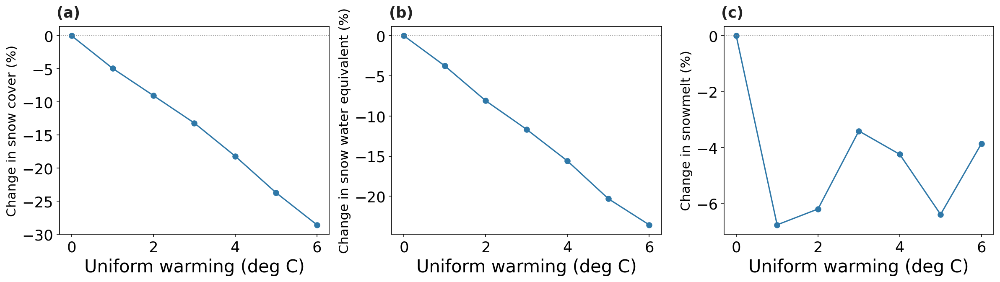

In [30]:
# 13b.1 Synthetic warming response of the monthly emulator
WARMING_STEPS = [0, 1, 2, 3, 4, 5, 6]
recent = era_m.loc["2006-01-01":].copy()   # two recent decades as the present climate
envelope_low, envelope_high = era_m["t2m_C"].min(), era_m["t2m_C"].max()

sensitivity_rows = []
for delta in WARMING_STEPS:
    warmed = recent.copy()
    warmed["t2m_C"] = warmed["t2m_C"] + delta
    outside = float(np.mean((warmed["t2m_C"] > envelope_high) | (warmed["t2m_C"] < envelope_low)))
    row = {"warming_C": delta, "months_outside_envelope": outside}
    for target in PROJ_TARGETS:
        prediction = proj_models[target].predict(warmed[PROJ_PRED])
        row[f"{target}_level"] = float(prediction.mean())
    sensitivity_rows.append(row)

emulator_sensitivity = pd.DataFrame(sensitivity_rows)
for target in PROJ_TARGETS:
    baseline = emulator_sensitivity.loc[emulator_sensitivity.warming_C == 0, f"{target}_level"].iloc[0]
    emulator_sensitivity[f"{target}_change_pct"] = 100 * (emulator_sensitivity[f"{target}_level"] / baseline - 1)
emulator_sensitivity.to_csv(TABLE_DIR / "table_24a_emulator_warming_response.csv", index=False)
display(Markdown("**Emulator response to uniform warming of the recent record**"))
display(emulator_sensitivity.round(4))

_swe = emulator_sensitivity.set_index("warming_C")["sd_change_pct"]
_per_degree = np.polyfit(emulator_sensitivity["warming_C"], emulator_sensitivity["sd_change_pct"], 1)[0]
print(f"Snow water equivalent falls by {abs(_per_degree):.1f} per cent per degree of warming, "
      f"reaching {_swe.loc[6]:.1f} per cent at six degrees. The response is monotonic across the "
      f"tested range, so the ensemble is not being flattened by the model class.")
print(f"At six degrees, {100 * emulator_sensitivity['months_outside_envelope'].iloc[-1]:.0f} per cent "
      f"of months sit outside the monthly training envelope of {envelope_low:.1f} to {envelope_high:.1f} "
      f"deg C; below four degrees it is "
      f"{100 * emulator_sensitivity.loc[emulator_sensitivity.warming_C == 4, 'months_outside_envelope'].iloc[0]:.0f} "
      f"per cent. Warming shifts winter months into ranges the emulator has seen, which is why the share "
      f"stays modest even under strong warming.")

fig, axes = plt.subplots(1, 3, figsize=(16, 4.6))
for ax, (target, label) in zip(axes, PROJ_TARGETS.items()):
    ax.plot(emulator_sensitivity["warming_C"], emulator_sensitivity[f"{target}_change_pct"],
            marker="o", color="#2f78a8")
    ax.axhline(0, color="#888888", lw=0.8, ls=":")
    ax.set(xlabel="Uniform warming (deg C)", ylabel=f"Change in {label.split(' (')[0].lower()} (%)")
polish_manuscript_figure(fig)
for ax, (target, label) in zip(axes, PROJ_TARGETS.items()):
    ax.set_ylabel(f"Change in {label.split(' (')[0].lower()} (%)", fontsize=15)
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_12a_emulator_warming_response.png", bbox_inches="tight")
plt.show()


### 13c. CMIP6 ensemble forcing and quantile-mapped bias correction

Every model the Climate Data Store serves with temperature, precipitation, snowfall and snow water equivalent across the historical, SSP2-4.5 and SSP5-8.5 monthly collections is used. Each model is corrected against ERA5-Land over 1985-2014 by empirical quantile mapping, calendar month by calendar month. Values beyond the model's own historical range keep the correction of the outermost quantile, additively for temperature and multiplicatively for the water fluxes, so a future month warmer than anything in the model's history is not mapped back inside it.

In [31]:
# 13c.1 Load the CMIP6 ensemble and bias-correct it against ERA5-Land 1985-2014
import io, zipfile

ENSEMBLE_DIR = NC_DIR / "SSP_ensemble"
CMIP_VARIABLES = {"tas": "t2m_C", "pr": "tp_mm", "prsn": "sf_mm", "snw": "snw_mm"}
CMIP_SCENARIOS = {"SSP2-4.5": "ssp2_4_5", "SSP5-8.5": "ssp5_8_5"}
LAST_YEAR = int(FUTURE[1][:4])


def _read_cmip(short, model, experiment):
    """Area-mean monthly series of one ensemble member, or None if absent.

    Members arrive by two routes that carry the same published CMIP6 files: a
    NetCDF subset pulled from the Google Cloud archive, or a zip delivered by the
    Climate Data Store. Which route a member came from is recorded in
    cmip6_ensemble_provenance.csv and does not change the data.
    """
    netcdf_path = ENSEMBLE_DIR / f"{short}_{model}_{experiment}.nc"
    zip_path = ENSEMBLE_DIR / f"{short}_{model}_{experiment}.zip"
    if netcdf_path.exists():
        with xr.open_dataset(netcdf_path) as ds:
            if short not in ds.variables:
                return None
            series = ds[short].mean(dim=[d for d in ("lat", "lon") if d in ds.dims]).to_series()
    elif zip_path.exists():
        with zipfile.ZipFile(zip_path) as archive:
            member = next((n for n in archive.namelist() if n.endswith(".nc")), None)
            if member is None:
                return None
            with xr.open_dataset(io.BytesIO(archive.read(member))) as ds:
                if short not in ds.variables:
                    return None
                series = ds[short].mean(dim=[d for d in ("lat", "lon") if d in ds.dims]).to_series()
    else:
        return None
    # One member publishes the post-2100 extension. Those stamps fall outside the
    # range pandas can hold in nanoseconds, and the projection does not use them,
    # so they are dropped before the calendar is converted.
    stamps = [(k, ts) for k, ts in enumerate(series.index) if ts.year <= LAST_YEAR]
    series = series.iloc[[k for k, _ in stamps]]
    series.index = pd.to_datetime([f"{ts.year}-{ts.month:02d}-01" for _, ts in stamps])
    return series.groupby(level=0).mean()


def _to_physical(frame):
    """CMIP6 units to the units the emulator was trained on."""
    days = frame.index.to_series().dt.daysinmonth
    out = pd.DataFrame(index=frame.index)
    out["t2m_C"] = frame["tas"] - 273.15
    out["tp_mm"] = frame["pr"] * 86400 * days
    out["sf_mm"] = frame["prsn"] * 86400 * days
    if "snw" in frame:
        out["snw_mm"] = frame["snw"]          # kg m-2 is mm of water equivalent
    return out


def _quantile_map(future, model_hist, obs_hist, multiplicative):
    """Empirical quantile mapping with the tail correction carried outward."""
    model_sorted = np.sort(model_hist)
    obs_sorted = np.sort(obs_hist)
    if len(model_sorted) < 5 or len(obs_sorted) < 5:
        return future
    levels = np.linspace(0, 1, len(model_sorted))
    ranks = np.interp(future, model_sorted, levels)
    mapped = np.interp(ranks, np.linspace(0, 1, len(obs_sorted)), obs_sorted)
    # Beyond the historical range the rank saturates, so carry the outermost
    # correction instead of letting the mapping clip the signal.
    if multiplicative:
        high_ratio = obs_sorted[-1] / model_sorted[-1] if model_sorted[-1] > 1e-9 else 1.0
        low_ratio = obs_sorted[0] / model_sorted[0] if model_sorted[0] > 1e-9 else 1.0
        mapped = np.where(future > model_sorted[-1], future * np.clip(high_ratio, 0.2, 5.0), mapped)
        mapped = np.where(future < model_sorted[0], future * np.clip(low_ratio, 0.2, 5.0), mapped)
        mapped = np.clip(mapped, 0.0, None)
    else:
        mapped = np.where(future > model_sorted[-1],
                          future + (obs_sorted[-1] - model_sorted[-1]), mapped)
        mapped = np.where(future < model_sorted[0],
                          future + (obs_sorted[0] - model_sorted[0]), mapped)
    return mapped


era_reference = era_m.loc[REFERENCE[0]:REFERENCE[1]]
available_models = sorted({p.name[len("tas_"):-len("_historical" + p.suffix)]
                           for pattern in ("tas_*_historical.nc", "tas_*_historical.zip")
                           for p in ENSEMBLE_DIR.glob(pattern)}) if ENSEMBLE_DIR.exists() else []
_provenance_path = ENSEMBLE_DIR / "cmip6_ensemble_provenance.csv"
if _provenance_path.exists():
    _provenance = pd.read_csv(_provenance_path)
    display(Markdown("**Ensemble provenance: one member per model, and where it was read from**"))
    display(_provenance.groupby(["model", "source_id", "member_id", "route"]).size()
            .rename("files").reset_index())

cmip_corrected, cmip_raw_snw, dropped_models = {}, {}, []
for model in available_models:
    historical = {}
    for short in CMIP_VARIABLES:
        series = _read_cmip(short, model, "historical")
        if series is not None:
            historical[short] = series
    if set(historical) < {"tas", "pr", "prsn"}:
        dropped_models.append((model, "incomplete historical run"))
        continue
    hist_physical = _to_physical(pd.DataFrame(historical))
    # Routes differ in how much of the historical run they carry: the cloud
    # archive holds it from 1850, ESGF was asked only for the reference window.
    # The mapping compares like with like, so every member is cut to 1985-2014.
    hist_physical = hist_physical.loc[REFERENCE[0]:REFERENCE[1]]

    for scenario_label, experiment in CMIP_SCENARIOS.items():
        future = {}
        for short in CMIP_VARIABLES:
            series = _read_cmip(short, model, experiment)
            if series is not None:
                future[short] = series
        if set(future) < {"tas", "pr", "prsn"}:
            dropped_models.append((model, f"incomplete {experiment}"))
            continue
        future_physical = _to_physical(pd.DataFrame(future))
        # Two members publish the post-2100 extension; the projection stops at 2099.
        future_physical = future_physical.loc[FUTURE[0]:FUTURE[1]]

        corrected = future_physical.copy()
        for column, multiplicative in (("t2m_C", False), ("tp_mm", True), ("sf_mm", True)):
            for month in range(1, 13):
                future_mask = corrected.index.month == month
                hist_mask = hist_physical.index.month == month
                obs_mask = era_reference.index.month == month
                corrected.loc[future_mask, column] = _quantile_map(
                    future_physical.loc[future_mask, column].to_numpy(),
                    hist_physical.loc[hist_mask, column].to_numpy(),
                    era_reference.loc[obs_mask, column].to_numpy(),
                    multiplicative)
        corrected["month"] = corrected.index.month
        corrected["sin_m"] = np.sin(2 * np.pi * corrected["month"] / 12)
        corrected["cos_m"] = np.cos(2 * np.pi * corrected["month"] / 12)
        cmip_corrected[(model, scenario_label)] = corrected
        if "snw_mm" in future_physical:
            cmip_raw_snw[(model, scenario_label)] = future_physical["snw_mm"]

print(f"Ensemble loaded: {len({m for m, _ in cmip_corrected})} models with usable forcing, "
      f"{len(cmip_raw_snw)} model-scenario pairs carrying their own snow water equivalent.")
for model, reason in dropped_models:
    print(f"  dropped {model}: {reason}")

# The correction has to leave the warming signal intact rather than mapping it away.
_check = []
for (model, scenario), frame in cmip_corrected.items():
    late = frame.loc["2080-01-01":"2099-12-31", "t2m_C"].mean()
    base = frame.loc["2015-01-01":"2034-12-31", "t2m_C"].mean()
    _check.append({"model": model, "scenario": scenario, "warming_C": late - base})
bias_check = pd.DataFrame(_check)
bias_check.to_csv(TABLE_DIR / "table_24b_ensemble_warming_after_correction.csv", index=False)
display(Markdown("**Warming retained after bias correction (late century minus baseline)**"))
display(bias_check.pivot_table(index="model", columns="scenario", values="warming_C").round(2))


**Ensemble provenance: one member per model, and where it was read from**

,model,source_id,member_id,route,files
0,bcc_csm2_mr,BCC-CSM2-MR,r1i1p1f1,google-cloud-cmip6,12
1,canesm5_canoe,CanESM5-CanOE,r1i1p2f1,google-cloud-cmip6,12
2,ec_earth3_cc,EC-Earth3-CC,r1i1p1f1,esgf-http,12
3,ipsl_cm6a_lr,IPSL-CM6A-LR,r14i1p1f1,google-cloud-cmip6,12
4,miroc6,MIROC6,r1i1p1f1,google-cloud-cmip6,12
5,miroc_es2l,MIROC-ES2L,r10i1p1f2,esgf-http,12
6,mpi_esm1_2_lr,MPI-ESM1-2-LR,r1i1p1f1,google-cloud-cmip6,12
7,mri_esm2_0,MRI-ESM2-0,r1i1p1f1,google-cloud-cmip6,12
8,noresm2_mm,NorESM2-MM,r1i1p1f1,esgf-http,12
9,taiesm1,TaiESM1,r1i1p1f1,esgf-http,12


Ensemble loaded: 10 models with usable forcing, 20 model-scenario pairs carrying their own snow water equivalent.


**Warming retained after bias correction (late century minus baseline)**

scenario,SSP2-4.5,SSP5-8.5
model,,
bcc_csm2_mr,1.61,3.85
canesm5_canoe,2.86,6.98
ec_earth3_cc,1.60,4.85
ipsl_cm6a_lr,2.40,5.84
miroc6,1.91,4.51
miroc_es2l,1.94,3.79
mpi_esm1_2_lr,1.65,3.65
mri_esm2_0,1.53,3.70
noresm2_mm,1.55,3.99


### 13d. Ensemble projection of the snow state

The emulator is applied to each corrected model separately and the results are reported as an ensemble median with the full spread across models. A single member cannot express how much of the projected change is scenario and how much is model, which is what the previous version of this section asked the reader to accept.

In [32]:
# 13d.1 Apply the emulator to every ensemble member and summarise the spread
PERIODS = {"Baseline (2015-2034)": (2015, 2034), "Mid-century (2041-2060)": (2041, 2060),
           "Late-century (2080-2099)": (2080, 2099)}

member_rows = []
for (model, scenario), frame in sorted(cmip_corrected.items()):
    prediction = pd.DataFrame(index=frame.index)
    for target in PROJ_TARGETS:
        prediction[target] = proj_models[target].predict(frame[PROJ_PRED])
    prediction["t2m_C_bc"] = frame["t2m_C"]
    if (model, scenario) in cmip_raw_snw:
        prediction["snw_mm_raw"] = cmip_raw_snw[(model, scenario)].reindex(prediction.index)
    prediction["year"] = prediction.index.year
    annual = prediction.groupby("year").agg(
        {"snowc": "mean", "sd": "mean", "smlt_mm": "sum", "t2m_C_bc": "mean",
         **({"snw_mm_raw": "mean"} if "snw_mm_raw" in prediction else {})}).reset_index()
    annual["model"], annual["scenario"] = model, scenario
    member_rows.append(annual)

projected_members = pd.concat(member_rows, ignore_index=True)
projected_members.to_csv(TABLE_DIR / "table_25_projected_snow_annual_series.csv", index=False)

change_rows = []
for (model, scenario), group in projected_members.groupby(["model", "scenario"]):
    baseline = group[group.year.between(*PERIODS["Baseline (2015-2034)"])].mean(numeric_only=True)
    for period, (start, end) in PERIODS.items():
        window = group[group.year.between(start, end)].mean(numeric_only=True)
        entry = {"model": model, "scenario": scenario, "period": period,
                 "temperature_change_C": window["t2m_C_bc"] - baseline["t2m_C_bc"],
                 "snow_cover_change_pp": window["snowc"] - baseline["snowc"],
                 "snow_water_equivalent_change_pct":
                     100 * (window["sd"] / baseline["sd"] - 1) if baseline["sd"] else np.nan,
                 "snowmelt_change_pct":
                     100 * (window["smlt_mm"] / baseline["smlt_mm"] - 1) if baseline["smlt_mm"] else np.nan}
        if "snw_mm_raw" in group and baseline.get("snw_mm_raw", 0):
            entry["cmip6_own_swe_change_pct"] = 100 * (window["snw_mm_raw"] / baseline["snw_mm_raw"] - 1)
        change_rows.append(entry)
member_changes = pd.DataFrame(change_rows)
member_changes.to_csv(TABLE_DIR / "table_26a_projected_changes_by_member.csv", index=False)

metrics = ["temperature_change_C", "snow_cover_change_pp", "snow_water_equivalent_change_pct",
           "snowmelt_change_pct"]
ensemble_summary = (member_changes.groupby(["scenario", "period"])[metrics]
                    .agg(["median", "min", "max", "count"]))
ensemble_summary.columns = [f"{metric}_{stat}" for metric, stat in ensemble_summary.columns]
ensemble_summary = ensemble_summary.reset_index()
ensemble_summary.to_csv(TABLE_DIR / "table_26_projected_snow_period_changes.csv", index=False)
display(Markdown("**Ensemble projection: median and full model spread**"))
display(ensemble_summary.round(2))

_late = member_changes[member_changes.period == "Late-century (2080-2099)"]
for scenario, group in _late.groupby("scenario"):
    swe = group["snow_water_equivalent_change_pct"]
    print(f"{scenario}: snow water equivalent changes by a median of {swe.median():.1f} per cent by the "
          f"end of the century, with members spanning {swe.min():.1f} to {swe.max():.1f} per cent across "
          f"{len(swe)} models, under a median warming of "
          f"{group['temperature_change_C'].median():.1f} deg C.")


**Ensemble projection: median and full model spread**

,scenario,period,temperature_change_C_median,temperature_change_C_min,temperature_change_C_max,temperature_change_C_count,snow_cover_change_pp_median,snow_cover_change_pp_min,snow_cover_change_pp_max,snow_cover_change_pp_count,snow_water_equivalent_change_pct_median,snow_water_equivalent_change_pct_min,snow_water_equivalent_change_pct_max,snow_water_equivalent_change_pct_count,snowmelt_change_pct_median,snowmelt_change_pct_min,snowmelt_change_pct_max,snowmelt_change_pct_count
0,SSP2-4.5,Baseline (2015-2034),0.00,0.00,0.00,10,0.00,0.00,0.00,10,0.00,0.00,0.00,10,0.00,0.00,0.00,10
1,SSP2-4.5,Late-century (2080-2099),1.78,1.53,3.01,10,-4.25,-7.72,-2.85,10,-9.93,-22.62,-6.11,10,2.01,-14.77,8.40,10
2,SSP2-4.5,Mid-century (2041-2060),0.85,0.40,1.53,10,-1.22,-5.17,-0.23,10,-4.59,-12.84,1.19,10,-1.02,-10.62,11.18,10
3,SSP5-8.5,Baseline (2015-2034),0.00,0.00,0.00,10,0.00,0.00,0.00,10,0.00,0.00,0.00,10,0.00,0.00,0.00,10
4,SSP5-8.5,Late-century (2080-2099),4.25,3.65,6.98,10,-8.99,-20.20,-7.44,10,-23.68,-37.96,-7.46,10,5.69,-6.68,19.34,10
5,SSP5-8.5,Mid-century (2041-2060),1.44,0.89,2.60,10,-3.48,-6.86,-1.65,10,-10.12,-18.90,-3.01,10,1.42,-10.97,13.61,10


SSP2-4.5: snow water equivalent changes by a median of -9.9 per cent by the end of the century, with members spanning -22.6 to -6.1 per cent across 10 models, under a median warming of 1.8 deg C.
SSP5-8.5: snow water equivalent changes by a median of -23.7 per cent by the end of the century, with members spanning -38.0 to -7.5 per cent across 10 models, under a median warming of 4.3 deg C.


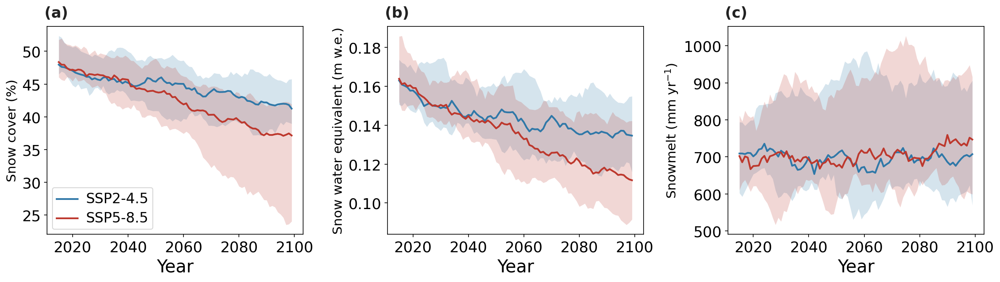

In [33]:
# 13d.2 Ensemble projection figure: median with the spread across models
fig, axes = plt.subplots(1, 3, figsize=(16, 4.6))
_scenario_colour = {"SSP2-4.5": "#2f78a8", "SSP5-8.5": "#bd382d"}
_panels = [("snowc", "Snow cover (%)"), ("sd", "Snow water equivalent (m w.e.)"),
           ("smlt_mm", "Snowmelt (mm yr$^{-1}$)")]
for ax, (target, label) in zip(axes, _panels):
    for scenario, group in projected_members.groupby("scenario"):
        wide = group.pivot_table(index="year", columns="model", values=target)
        smooth = wide.rolling(10, center=True, min_periods=1).mean()
        ax.fill_between(smooth.index, smooth.min(axis=1), smooth.max(axis=1),
                        color=_scenario_colour[scenario], alpha=0.20, linewidth=0)
        ax.plot(smooth.index, smooth.median(axis=1), color=_scenario_colour[scenario],
                lw=2, label=scenario)
    ax.set(xlabel="Year", ylabel=label)
axes[0].legend(fontsize=12)
polish_manuscript_figure(fig)
for ax, (target, label) in zip(axes, _panels):
    ax.set_ylabel(label, fontsize=15)
add_panel_letters(axes)
fig.tight_layout()
fig.savefig(FIG_DIR / "figure_12_projected_snow_scenarios.png", bbox_inches="tight")
plt.show()


### 13e. Three estimates of the same sensitivity

The emulator's climate sensitivity is not self-validating: it is a statistical relationship fitted to one reanalysis, asked to hold under a climate the reanalysis never contained. Two independent estimates are placed next to it. The first is the snow water equivalent each model carries in its own physics, in the same unit as the target. The second is a degree-day water balance, the standard reduced description of a seasonal snowpack, calibrated on ERA5-Land and driven by the same corrected forcing. Agreement would not prove the emulator right, but disagreement bounds how much weight the projection can carry.

Degree-day benchmark calibrated on ERA5-Land: 1.25 mm w.e. per degree per day above -2.5 deg C, monthly RMSE 42.7 mm w.e. against a mean observed 165.6 mm w.e., correlation 0.983.


**Late-century snow water equivalent change from three independent estimates**

,model,scenario,warming_C,emulator_change_pct,degree_day_change_pct,model_own_change_pct,emulator_per_degree,degree_day_per_degree,model_own_per_degree
0,bcc_csm2_mr,SSP2-4.5,1.61,-8.200000,-49.65,-83.209999,-5.09,-30.82,-51.65
1,bcc_csm2_mr,SSP5-8.5,3.85,-19.170000,-83.19,-89.419998,-4.98,-21.62,-23.24
2,canesm5_canoe,SSP2-4.5,2.86,-22.620001,-64.06,-76.820000,-7.92,-22.43,-26.90
3,canesm5_canoe,SSP5-8.5,6.98,-37.959999,-98.90,-95.550003,-5.44,-14.17,-13.69
4,ec_earth3_cc,SSP2-4.5,1.60,-6.110000,-23.36,-20.320000,-3.81,-14.56,-12.66
5,ec_earth3_cc,SSP5-8.5,4.85,-28.540001,-77.50,-66.230003,-5.88,-15.97,-13.65
6,ipsl_cm6a_lr,SSP2-4.5,2.40,-13.040000,-53.81,-77.910004,-5.44,-22.44,-32.50
7,ipsl_cm6a_lr,SSP5-8.5,5.84,-29.559999,-89.41,-94.410004,-5.06,-15.31,-16.17
8,miroc6,SSP2-4.5,1.91,-7.530000,-47.35,-64.459999,-3.94,-24.80,-33.76
9,miroc6,SSP5-8.5,4.51,-15.850000,-90.82,-95.300003,-3.51,-20.12,-21.11


Median change in snow water equivalent per degree of warming: emulator -5.4 per cent, degree day -21.3 per cent, model own -23.4 per cent. The emulator is the statistical estimate, the model-own figure is what each climate model carries in its own snow physics at its own resolution, and the degree-day figure is a physical benchmark calibrated on the reanalysis.


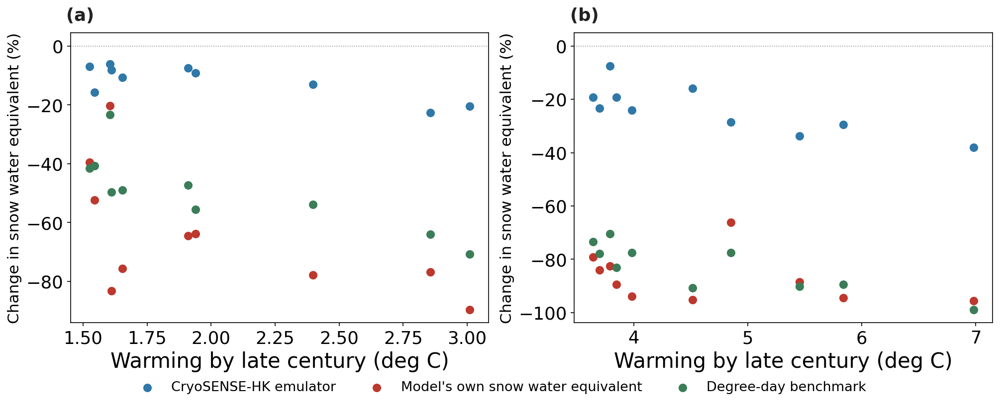

In [34]:
# 13e.1 Degree-day benchmark and the three-way sensitivity comparison
def degree_day_swe(temperature_C, snowfall_mm, days, factor, base_C, initial=0.0):
    """Monthly snow water balance: accumulate snowfall, melt on positive degree-days."""
    swe, series = initial, np.empty(len(temperature_C))
    for i, (temp, snowfall, month_days) in enumerate(zip(temperature_C, snowfall_mm, days)):
        swe = swe + snowfall
        melt = min(swe, factor * month_days * max(temp - base_C, 0.0))
        swe = max(swe - melt, 0.0)
        series[i] = swe
    return series


_era_days = era_m.index.to_series().dt.daysinmonth.to_numpy()
_observed_swe_mm = (era_m["sd"] * 1000).to_numpy()
best = None
for factor in np.arange(0.5, 6.01, 0.25):          # mm w.e. per degree per day
    for base_C in np.arange(-3.0, 3.01, 0.5):
        simulated = degree_day_swe(era_m["t2m_C"].to_numpy(), era_m["sf_mm"].to_numpy(),
                                   _era_days, factor, base_C)
        rmse = float(np.sqrt(np.mean((simulated - _observed_swe_mm) ** 2)))
        if best is None or rmse < best[0]:
            best = (rmse, factor, base_C)
_rmse, DD_FACTOR, DD_BASE = best
_fitted = degree_day_swe(era_m["t2m_C"].to_numpy(), era_m["sf_mm"].to_numpy(),
                         _era_days, DD_FACTOR, DD_BASE)
print(f"Degree-day benchmark calibrated on ERA5-Land: {DD_FACTOR:.2f} mm w.e. per degree per day "
      f"above {DD_BASE:.1f} deg C, monthly RMSE {_rmse:.1f} mm w.e. against a mean observed "
      f"{_observed_swe_mm.mean():.1f} mm w.e., correlation {np.corrcoef(_fitted, _observed_swe_mm)[0, 1]:.3f}.")

comparison_rows = []
for (model, scenario), frame in sorted(cmip_corrected.items()):
    days = frame.index.to_series().dt.daysinmonth.to_numpy()
    physical = degree_day_swe(frame["t2m_C"].to_numpy(), frame["sf_mm"].to_numpy(),
                              days, DD_FACTOR, DD_BASE)
    physical = pd.Series(physical, index=frame.index)
    member = projected_members[(projected_members.model == model)
                               & (projected_members.scenario == scenario)]
    baseline_years, late_years = PERIODS["Baseline (2015-2034)"], PERIODS["Late-century (2080-2099)"]

    def _window(series, years):
        return series.loc[f"{years[0]}-01-01":f"{years[1]}-12-31"].mean()

    warming = (member[member.year.between(*late_years)]["t2m_C_bc"].mean()
               - member[member.year.between(*baseline_years)]["t2m_C_bc"].mean())
    emulator_change = 100 * (member[member.year.between(*late_years)]["sd"].mean()
                             / member[member.year.between(*baseline_years)]["sd"].mean() - 1)
    physical_base, physical_late = _window(physical, baseline_years), _window(physical, late_years)
    physical_change = 100 * (physical_late / physical_base - 1) if physical_base else np.nan
    row = {"model": model, "scenario": scenario, "warming_C": warming,
           "emulator_change_pct": emulator_change, "degree_day_change_pct": physical_change}
    if "snw_mm_raw" in member and member["snw_mm_raw"].notna().any():
        own_base = member[member.year.between(*baseline_years)]["snw_mm_raw"].mean()
        own_late = member[member.year.between(*late_years)]["snw_mm_raw"].mean()
        row["model_own_change_pct"] = 100 * (own_late / own_base - 1) if own_base else np.nan
    comparison_rows.append(row)

sensitivity_comparison = pd.DataFrame(comparison_rows)
for column in ["emulator", "degree_day", "model_own"]:
    source = f"{column}_change_pct"
    if source in sensitivity_comparison:
        sensitivity_comparison[f"{column}_per_degree"] = (sensitivity_comparison[source]
                                                          / sensitivity_comparison["warming_C"])
sensitivity_comparison.to_csv(TABLE_DIR / "table_26b_sensitivity_three_ways.csv", index=False)
display(Markdown("**Late-century snow water equivalent change from three independent estimates**"))
display(sensitivity_comparison.round(2))

_summary = sensitivity_comparison[[c for c in sensitivity_comparison.columns
                                   if c.endswith("_per_degree")]].median()
print("Median change in snow water equivalent per degree of warming: "
      + ", ".join(f"{name.replace('_per_degree', '').replace('_', ' ')} {value:.1f} per cent"
                  for name, value in _summary.items())
      + ". The emulator is the statistical estimate, the model-own figure is what each climate model "
        "carries in its own snow physics at its own resolution, and the degree-day figure is a "
        "physical benchmark calibrated on the reanalysis.")

fig, axes = plt.subplots(1, 2, figsize=(13.5, 5.2))
_sources = [("emulator_change_pct", "CryoSENSE-HK emulator", "#2f78a8"),
            ("model_own_change_pct", "Model's own snow water equivalent", "#bd382d"),
            ("degree_day_change_pct", "Degree-day benchmark", "#3b7d58")]
for ax, (scenario, group) in zip(axes, sensitivity_comparison.groupby("scenario")):
    for column, label, colour in _sources:
        if column in group:
            ax.scatter(group["warming_C"], group[column], s=52, color=colour, label=label)
    ax.axhline(0, color="#888888", lw=0.8, ls=":")
    ax.set(xlabel="Warming by late century (deg C)",
           ylabel="Change in snow water equivalent (%)")
polish_manuscript_figure(fig)
for ax in axes:
    ax.set_ylabel("Change in snow water equivalent (%)", fontsize=15)
add_panel_letters(axes)
fig.tight_layout()
# Inside the frame the key sits on the low-warming, strong-loss corner where the
# degree-day and model-own points fall, so it goes underneath the panels instead.
_handles, _labels = axes[0].get_legend_handles_labels()
fig.legend(_handles, _labels, loc="lower center", ncol=3, fontsize=13,
           frameon=False, bbox_to_anchor=(0.5, -0.06))
fig.savefig(FIG_DIR / "figure_12b_sensitivity_three_ways.png", bbox_inches="tight")
plt.show()


## 14. Interpretation and limitation register

**Intended publication argument**

1. CryoSENSE-HK is a named and reproducible framework for lead-time forecasting of ERA5-Land snow state, with leakage-safe shifted targets, a feature pipeline, training-only selection, an ensemble decision layer, conformal intervals and TreeSHAP explainability.
2. The paper separates three claims of decreasing evidential strength and evaluates each on its own terms: predictability within the reanalysis, agreement between the reanalysis and ground observation, and the response of the fitted model to a warming climate.
3. Feature-group ablation distinguishes conservative forcing-only forecasts from the proposed snowfall-plus-memory design and the upper-bound reanalysis-informed design, so skill is separated from snow-memory reconstruction.
4. The event layer reports the full applied-classification metric suite (accuracy, balanced accuracy, precision, recall, specificity, F1, AUC, Cohen's kappa) against issue-day persistence and a day-of-year climatology.
5. Every interval and paired test is recomputed with a moving-block bootstrap, and the eighty paired comparisons are judged against a Bonferroni threshold as well as at the five percent level.
6. Spatial transfer is tested by leave-one-pixel-out over the 82 domain cells, and the result is stated as a domain median with its failure tail rather than as a property of the framework.
7. Two GHCN-Daily stations bound what the internal skill means, with elevation-matched companion cells separating elevation mismatch from product bias.
8. The projection module drives a reduced monthly emulator with ten bias-corrected CMIP6 members and compares its warming response against two references that do not share its training data: a degree-day water balance calibrated on the same reanalysis, and the snow water equivalent each climate model carries in its own land-surface scheme.

**Limitations to carry into the manuscript**

- Targets and predictors come from the same ERA5-Land product. The forecast framing and the shifted targets rule out recovering a same-date mapping, but skill measured here remains agreement with the reanalysis.
- The station comparison rests on two stations, one of them outside the province, and the network reports no zeros, so a presence-absence contingency cannot be built. It bounds the reanalysis rather than correcting it.
- Spatial transfer holds in the median and fails in individual cells, so a regional deployment would need per-cell verification.
- The monthly emulator is restricted to the drivers the CMIP6 archive carries at monthly resolution, so the daily Set B design cannot be driven directly by scenario forcing.
- A degree-day balance driven by monthly means can overstate melt, because a month whose mean exceeds the base temperature is treated as melting throughout.
- The snow field the climate models carry is itself known to be biased, so it is treated as corroboration rather than as an independent authority.
- The mechanism proposed for the emulator's weak warming response, a training record that contains almost no warm months with a persistent snowpack, is plausible rather than demonstrated.
- The glacier-area linkage rests on 24 annual observations and does not survive resampling; it is reported as directional consistency only.
- SHAP reveals predictive dependence and must not be read as causal attribution.
- The quality-checked ERA5-Land archive trails real time by roughly two to three months, so the results are a hindcast predictability benchmark rather than an operational forecast.


In [ ]:
# 14.1 The numbered figure set the journal receives
#
# Every panel above is written under figures/raw with a working name. The
# journal receives eleven of them under Figure_N. The mapping used to live only
# outside this notebook and was applied by hand, so a redrawn
# panel could reach the submission folder late or not at all. It is code now,
# and it runs from the same cells that drew the figures.
SUBMISSION_FIGURES = {
    "Figure_1.png": "fig1_manuscript/figure_01_study_area_map_ccby.png",
    "Figure_2.png": "figure_05_cryosense_hk_workflow.png",
    "Figure_3.png": "figure_02_historical_climate_diagnostics.png",
    "Figure_4.png": "figure_07_feature_group_ablation.png",
    "Figure_5.png": "figure_08_final_model_baselines.png",
    "Figure_6.png": "figure_08d_spatial_generalisation.png",
    "Figure_7.png": "figure_08b_event_classification.png",
    "Figure_8.png": "figure_10_treeshap_feature_importance.png",
    "Figure_9.png": "figure_08f_station_validation.png",
    "Figure_10.png": "figure_12b_sensitivity_three_ways.png",
    "Figure_S1.png": "figure_12_projected_snow_scenarios.png",
    # Figure 1 also travels as the 600 dpi TIFF written by the CC BY rebuild.
    "Figure_1.tiff": "fig1_manuscript/Fig1.tiff",
}

import shutil as _shutil

SUBMIT_DIR.mkdir(parents=True, exist_ok=True)
missing = [source for source in SUBMISSION_FIGURES.values()
           if not (FIG_DIR / source).exists()]
if missing:
    raise FileNotFoundError(
        "these raw figures are absent, so the submission set would be "
        f"incomplete: {missing}")

for target, source in SUBMISSION_FIGURES.items():
    _shutil.copy2(FIG_DIR / source, SUBMIT_DIR / target)

stray = sorted(p.name for p in SUBMIT_DIR.iterdir()
               if p.is_file() and p.name not in SUBMISSION_FIGURES)
print(f"Submission set: {len(SUBMISSION_FIGURES)} files under "
      f"{SUBMIT_DIR.relative_to(ROOT)}/")
if stray:
    print(f"  NOT IN THE MAP, remove by hand: {stray}")


In [ ]:
# 14.2 Output register for manuscript assembly
stale_output_tokens = [
    ".DS_Store",
    "direct_cmip6",
    "projection_emulator",
    "table_19_shap_feature_importance.csv",
    "table_26_output_register.csv",
]
# Tables live under outputs/, figures under figures/{raw,submission}; the
# register covers both so nothing generated escapes it.
scanned = [p for root in (OUT_DIR, ROOT / "figures") for p in root.rglob("*")]
outputs = sorted([
    str(p.relative_to(ROOT)) for p in scanned
    if p.is_file() and not any(token in str(p.relative_to(ROOT)) for token in stale_output_tokens)
])
output_register = pd.DataFrame({"generated_artifact": outputs})
output_register.to_csv(TABLE_DIR / "table_27_output_register.csv", index=False)
display(output_register)
print(f"Completed: {len(outputs)} generated artifacts under outputs/ and figures/")
